In [1]:
# If running in Google Colab, import files
try:
    import google.colab
    in_colab = True
except:
    in_colab = False

if in_colab:
    !git clone https://github.com/Hyperparticle/one-pixel-attack-keras.git
    !mv -v one-pixel-attack-keras/* .
    !rm -rf one-pixel-attack-keras

# Python Libraries
%matplotlib inline
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
import math
from keras.datasets import cifar10
from keras import backend as K # original
#from kears import keras.backend.tensorflow_backend as K
import tensorflow as tf
from PIL import Image
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
import matplotlib

# Custom Networks
from networks.lenet import LeNet
from networks.pure_cnn import PureCnn
from networks.network_in_network import NetworkInNetwork
from networks.resnet import ResNet
from networks.densenet import DenseNet
from networks.wide_resnet import WideResNet
from networks.capsnet import CapsNet

# Helper functions
from differential_evolution import differential_evolution
import helper

matplotlib.style.use('ggplot')
np.random.seed(100)

This notebook will demonstrate the one pixel attack with a few different convolutional neural network models. By using differential evolution, we find a special pixel that can modify a target image such that the network misclassifies the image (which it previously correctly classified).

In theory, we want models that don't get fooled by such tiny changes. Especially in images, it is undesirable to have a small alteration in the input result in a drastic change in the output. However, even the most accurate neural networks are susceptible to this type of attack.

To read more about it, see [the original paper](https://arxiv.org/abs/1710.08864), or the authors' [official repo](https://github.com/Carina02/One-Pixel-Attack).

Let's get started.

![](images/pred2.png "All it takes is one pixel")

# One Pixel Attack Tutorial
## Part 1 - Cifar10

### Dan Kondratyuk
### September 15, 2019

We can access and display any image in the dataset by its index. For instance, here is a horse.

## Imports

In [2]:
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

Ensure that you have `numpy`, `pandas`, `scipy`, `matplotlib`, `tensorflow-gpu`, and `keras` installed.

Alternatively, you may [run this notebook in Google Colab](https://colab.research.google.com/drive/1Zq1kGP9C7i-70-SXyuEEaqYngtyQZMn7). Note: colab allows you to run this notebook on GPU, free of charge. Simply select "GPU" in the Accelerator drop-down in Notebook Settings (either through the Edit menu or the command palette at cmd/ctrl-shift-P).

In [3]:
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

## Load Dataset

For this attack, we will use the [Cifar10 dataset](https://www.cs.toronto.edu/~kriz/cifar.html) packaged by Keras. The task of the dataset is to correctly classify a 32x32 pixel image in 1 of 10 categories (e.g., bird, deer, truck).

The code below will load the Cifar10 dataset. Keras will need to download the dataset if it is not cached locally already.

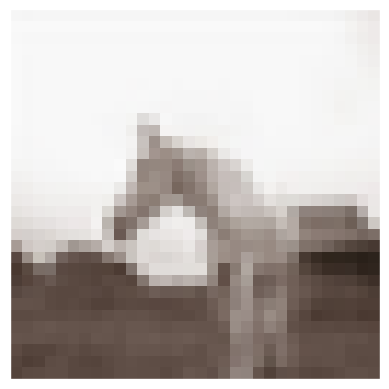

In [4]:
image_id = 87 # Image index in the test set
helper.plot_image(x_test[image_id])
temp_img = Image.fromarray(x_test[image_id])
temp_img.save("fig1_a.png", "png")

In [5]:
# this cell is added for test
print(type(x_test[0]))
print(type(y_test[0])) # blank image
temp_img = Image.fromarray(x_test[16])
print(x_test[16])
# temp_img2.show()
# print(temp_img.width)
# print(temp_img.height)
# temp_img.show()
# helper.plot_image(temp_img) # 얘는 걍 ndim array 넣어줘야 정상 작동하는듯??

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
[[[ 95  76  78]
  [ 92  77  78]
  [ 89  77  77]
  ...
  [ 30  28  38]
  [175 183 191]
  [225 234 240]]

 [[ 90  71  73]
  [ 86  72  72]
  [ 83  71  71]
  ...
  [  0   0  13]
  [ 60  63  79]
  [165 171 189]]

 [[ 88  69  71]
  [ 84  70  70]
  [ 82  70  70]
  ...
  [  5   0  12]
  [ 24  26  48]
  [127 139 165]]

 ...

 [[203 176 161]
  [213 175 156]
  [202 165 155]
  ...
  [182 183 189]
  [118 120 125]
  [ 37  32  46]]

 [[123  94  90]
  [210 170 157]
  [211 171 160]
  ...
  [116 116 120]
  [ 44  45  47]
  [ 11   3  15]]

 [[102  85  84]
  [208 183 175]
  [215 186 176]
  ...
  [ 37  33  43]
  [ 17  13  22]
  [ 22  11  28]]]


## Image Perturbation

To begin, we need a function to modify one or more pixels in an image. 

We can define the perturbation of a pixel as a 5-tuple 

$$\textbf{x} = (x, y, r, g, b)$$

where $x, y$ are the coordinates of the pixel from 0 to 31, and $r,g,b$ are the red, green, and blue values from 0 to 255. Then multiple perturbations can simply be a concatenation of these tuples:

$$X = (x_1, y_1, r_1, g_1, b_1, x_2, y_2, r_2, g_2, b_2, ...)$$

We could instead use an array of tuples, but the optimization algorithm we will use requires it to be a flat 1-d vector.

Then the function to perturb an image can take as an input the image and $X$, and output a copy of the image with each pixel at $x_i, y_i$ modified to have the color $r_i, g_i, b_i$. To speed up computation, we will batch together an array of $X$ perturbations, denoted $X_S$.

In [6]:
def perturb_image(xs, img):
    # If this function is passed just one perturbation vector,
    # pack it in a list to keep the computation the same
    if xs.ndim < 2:
        xs = np.array([xs])
    
    # Copy the image n == len(xs) times so that we can 
    # create n new perturbed images
    tile = [len(xs)] + [1]*(xs.ndim+1)
    imgs = np.tile(img, tile)
    # numpy tile(A, repeat_shape)
    # A라는 array가 repeat_shape 모양으로 쌓이도록
    # 추후에 다시 보자..
    
    # Make sure to floor the members of xs as int types
    xs = xs.astype(int)
    
    for x,img in zip(xs, imgs):
        # Split x into an array of 5-tuples (perturbation pixels)
        # i.e., [[x,y,r,g,b], ...]
        pixels = np.split(x, len(x) // 5)
        # pixels = 5-tuple of perturb information (x,y,r,g,b) by kyle
        for pixel in pixels:
            # At each pixel's x,y position, assign its rgb value
            x_pos, y_pos, *rgb = pixel # *rgb = 뒤에 올 (r,g,b) 값을 가리킨다
            img[x_pos, y_pos] = rgb # perturb image by *rgb == (r,g,b) by kyle
    
    return imgs
    # Return value is array of perturbed images by xs
    # For example, if xs is [(16,16,255,255,0), (16,16,0,255,255)]
    # imgs is an array of perturbed image by xs[0], xs[1]. So it's size is 2 by kyle

Now we can modify the pixels of any image we want.

Let's modify our horse image by making pixel (16,16) yellow.

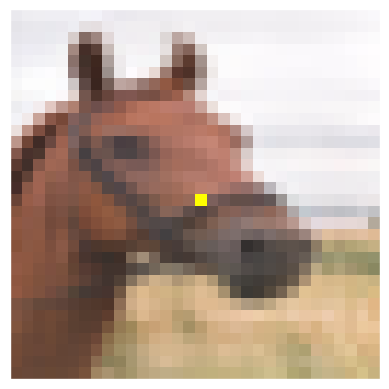

In [7]:
image_id = 99 # Image index in the test set
pixel = np.array([16, 16, 255, 255, 0]) # pixel = x,y,r,g,b
image_perturbed = perturb_image(pixel, x_test[image_id])[0]

helper.plot_image(image_perturbed)

## Load Models

To demonstrate the attack, we need some neural network models trained on the Cifar10 dataset. We will now load some pretrained models, which can be found in the `networks/models` directory.

It is recommended to use Keras with a GPU enabled. If you're [running in Google Colab](https://colab.research.google.com/drive/1Zq1kGP9C7i-70-SXyuEEaqYngtyQZMn7), you can enable a GPU instance by selecting `Runtime > Change runtime type > Hardware accelerator > GPU` (you will need to re-run all cells). The code below can be used to check (if using TensorFlow).

In [8]:
# Should output /device:GPU:0
#K.tensorflow_backend._get_available_gpus() #original
tf.compat.v1.disable_eager_execution()
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

There are two models included in this repository, `lenet` and `resnet` which will be loaded from disk automatically.

Optionally, you may [download the larger, more accurate models](https://www.dropbox.com/sh/dvatkpjl0sn79kn/AAC9L4puJ_sdFUkDZfr5SFkLa?dl=0) (e.g., Capsule Network, DenseNet, etc.). Make sure to copy the models into the `networks/models/` directory. Then uncomment the lines below and run the cell to load the models of your choosing.

In [9]:
lenet = LeNet()
resnet = ResNet()

# originally, lenet and resnet

## Uncomment below to load more models to play with. Make sure the model files exist by training or downloading them.

# lenet = LeNet()
pure_cnn = PureCnn()
net_in_net = NetworkInNetwork()
# resnet = ResNet()
densenet = DenseNet()
wide_resnet = WideResNet()
# capsnet = CapsNet()
# models = [lenet, resnet, wide_resnet]

models = [lenet, pure_cnn, net_in_net, resnet, densenet, wide_resnet]

Metal device set to: Apple M1
Successfully loaded lenet


2023-08-29 23:12:15.308911: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-08-29 23:12:15.338055: W tensorflow/c/c_api.cc:300] Operation '{name:'dense_3/bias/Assign' id:115 op device:{requested: '', assigned: ''} def:{{{node dense_3/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](dense_3/bias, dense_3/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-08-29 23:12:15.450939: W tensorflow/c/c_api.cc:300] Operation '{name:'dense_3/kernel/momentum/Assign' id:370 op device:{requested: '', assigned: ''} def:{{{node dense_3/kernel/momentum/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](dense_3/kernel/momentum, dense_3/kernel/momentum/Init

Instructions for updating:
Colocations handled automatically by placer.


2023-08-29 23:12:16.598913: W tensorflow/c/c_api.cc:300] Operation '{name:'conv2d_13/kernel/Assign' id:1286 op device:{requested: '', assigned: ''} def:{{{node conv2d_13/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](conv2d_13/kernel, conv2d_13/kernel/Initializer/stateless_truncated_normal)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-08-29 23:12:17.304730: W tensorflow/c/c_api.cc:300] Operation '{name:'conv2d_17/bias/momentum/Assign' id:4307 op device:{requested: '', assigned: ''} def:{{{node conv2d_17/bias/momentum/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](conv2d_17/bias/momentum, conv2d_17/bias/momentum/Initializer/zeros)}}' was changed by setting attribute after it was run by a session.

Successfully loaded resnet


2023-08-29 23:12:17.959580: W tensorflow/c/c_api.cc:300] Operation '{name:'conv2d_9_1/bias/Assign' id:5438 op device:{requested: '', assigned: ''} def:{{{node conv2d_9_1/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](conv2d_9_1/bias, conv2d_9_1/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-08-29 23:12:18.295778: W tensorflow/c/c_api.cc:300] Operation '{name:'conv2d_5_1/bias/v/Assign' id:5787 op device:{requested: '', assigned: ''} def:{{{node conv2d_5_1/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](conv2d_5_1/bias/v, conv2d_5_1/bias/v/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trig

Successfully loaded pure_cnn


2023-08-29 23:12:19.080894: W tensorflow/c/c_api.cc:300] Operation '{name:'batch_normalization_5_1/gamma/Assign' id:6308 op device:{requested: '', assigned: ''} def:{{{node batch_normalization_5_1/gamma/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](batch_normalization_5_1/gamma, batch_normalization_5_1/gamma/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-08-29 23:12:19.535861: W tensorflow/c/c_api.cc:300] Operation '{name:'conv2d_9_2/kernel/momentum/Assign' id:7250 op device:{requested: '', assigned: ''} def:{{{node conv2d_9_2/kernel/momentum/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](conv2d_9_2/kernel/momentum, conv2d_9_2/kernel/momentum/Initializer/zeros)}}' was changed by settin

Successfully loaded net_in_net


2023-08-29 23:12:22.916924: W tensorflow/c/c_api.cc:300] Operation '{name:'conv2d_77/kernel/Assign' id:12295 op device:{requested: '', assigned: ''} def:{{{node conv2d_77/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](conv2d_77/kernel, conv2d_77/kernel/Initializer/stateless_truncated_normal)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-08-29 23:12:24.815341: W tensorflow/c/c_api.cc:300] Operation '{name:'conv2d_74/kernel/momentum/Assign' id:18409 op device:{requested: '', assigned: ''} def:{{{node conv2d_74/kernel/momentum/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](conv2d_74/kernel/momentum, conv2d_74/kernel/momentum/Initializer/zeros)}}' was changed by setting attribute after it was run by 

Successfully loaded densenet


2023-08-29 23:12:27.027595: W tensorflow/c/c_api.cc:300] Operation '{name:'batch_normalization_13_2/moving_variance/Assign' id:21112 op device:{requested: '', assigned: ''} def:{{{node batch_normalization_13_2/moving_variance/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](batch_normalization_13_2/moving_variance, batch_normalization_13_2/moving_variance/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-08-29 23:12:28.489512: W tensorflow/c/c_api.cc:300] Operation '{name:'conv2d_18_2/kernel/momentum/Assign' id:22201 op device:{requested: '', assigned: ''} def:{{{node conv2d_18_2/kernel/momentum/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](conv2d_18_2/kernel/momentum, conv2d_18_2/kernel/mo

Successfully loaded wide_resnet


Note that there are even more networks available in the `networks` directory, but must be trained before loading them here.

### Calculate Model Accuracies

After loading the models, we would like to evaluate all test images with each model to ensure that we only attack the images which have been classified correctly. The code below will also display the accuracy and number of parameters of each model.

In [10]:
network_stats, correct_imgs = helper.evaluate_models(models, x_test, y_test)
correct_imgs = pd.DataFrame(correct_imgs, columns=['name', 'img', 'label', 'confidence', 'pred'])
network_stats = pd.DataFrame(network_stats, columns=['name', 'accuracy', 'param_count'])

network_stats

Evaluating lenet


/opt/homebrew/Caskroom/miniforge/base/lib/python3.9/site-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2023-08-29 23:12:29.695666: W tensorflow/c/c_api.cc:300] Operation '{name:'dense_3/Softmax' id:121 op device:{requested: '', assigned: ''} def:{{{node dense_3/Softmax}} = Softmax[T=DT_FLOAT, _has_manual_control_dependencies=true](dense_3/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Evaluating pure_cnn


2023-08-29 23:12:31.398046: W tensorflow/c/c_api.cc:300] Operation '{name:'activation_3_1/Softmax' id:5446 op device:{requested: '', assigned: ''} def:{{{node activation_3_1/Softmax}} = Softmax[T=DT_FLOAT, _has_manual_control_dependencies=true](global_average_pooling2d_1_1/Mean)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Evaluating net_in_net


2023-08-29 23:12:36.473042: W tensorflow/c/c_api.cc:300] Operation '{name:'activation_10_1/Softmax' id:6645 op device:{requested: '', assigned: ''} def:{{{node activation_10_1/Softmax}} = Softmax[T=DT_FLOAT, _has_manual_control_dependencies=true](global_average_pooling2d_1_2/Mean)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Evaluating resnet


2023-08-29 23:12:42.715735: W tensorflow/c/c_api.cc:300] Operation '{name:'dense_1_1/Softmax' id:2683 op device:{requested: '', assigned: ''} def:{{{node dense_1_1/Softmax}} = Softmax[T=DT_FLOAT, _has_manual_control_dependencies=true](dense_1_1/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Evaluating densenet


2023-08-29 23:12:46.341093: W tensorflow/c/c_api.cc:300] Operation '{name:'dense_1_2/Softmax' id:13845 op device:{requested: '', assigned: ''} def:{{{node dense_1_2/Softmax}} = Softmax[T=DT_FLOAT, _has_manual_control_dependencies=true](dense_1_2/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Evaluating wide_resnet


2023-08-29 23:13:14.543960: W tensorflow/c/c_api.cc:300] Operation '{name:'dense_1_3/Softmax' id:21166 op device:{requested: '', assigned: ''} def:{{{node dense_1_3/Softmax}} = Softmax[T=DT_FLOAT, _has_manual_control_dependencies=true](dense_1_3/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


,name,accuracy,param_count
0,lenet,0.7488,62006
1,pure_cnn,0.8877,1369738
2,net_in_net,0.9074,972658
3,resnet,0.9231,470218
4,densenet,0.9467,850606
5,wide_resnet,0.9534,11318026


### Prediction Function

For the black-box attack, all we should care about is the inputs to the model (the images), and the outputs of the model (the prediction probabilities). No special information about the model is required; we could even swap it with a model that is not a neural network.

Define a function that runs several perturbed images on a given model and returns the model's confidence (probability output) in the target class, one confidence value per image. If the target class is the correct class, this will be the function that we want to minimize so that the model will be most confident in another class (which is incorrect). Otherwise, the target is an incorrect class and we will want to maximize it.

In [11]:
def predict_classes(xs, img, target_class, model, minimize=True):
    # Perturb the image with the given pixel(s) x and get the prediction of the model
    imgs_perturbed = perturb_image(xs, img)
    predictions = model.predict(imgs_perturbed)[:,target_class]
    # Target class의 값만 뽑아내는 용(파이썬 문법)
    # This function should always be minimized, so return its complement if needed
    return predictions if minimize else 1 - predictions
    # optimization을 풀 때 최솟값으로 풀지 최댓값으로 풀지 보통 정해진다.
    # DE의 기본 format은 minimize를 하는데에 초점이 맞춰져 있다.
    # 만약 targetted라면, target의 confidence를 높이는게 최우선이니 보수를 리턴
    # 아니라면, 내 클래스의 confidence를 낮추는게 우선이니 그냥 리턴

Below we can modify a pixel in an image and see how the confidence of the model changes. In almost all cases, the confidence will not change. However, for very special cases it will change drastically.
#If(untargetted) -> 1-predictions?
내 class의 확률을 낮추고 싶을 때 --> prediction
다르게 인식시키고 싶을 때 --> 1-prediction

<class 'numpy.ndarray'>
Confidence in true class frog is 0.9999999
Prior confidence was 1.0


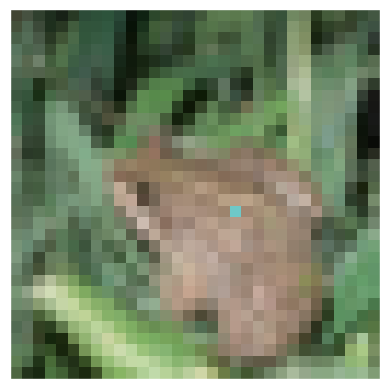

In [12]:
image_id = 4
pixel = np.array([17, 19, 110, 200, 200])
model = resnet

true_class = y_test[image_id, 0]
prior_confidence = model.predict_one(x_test[image_id])[true_class]
confidence = predict_classes(pixel, x_test[image_id], true_class, model)[0]

print(type(model.predict_one(x_test[image_id])))

print('Confidence in true class', class_names[true_class], 'is', confidence)
print('Prior confidence was', prior_confidence)
helper.plot_image(perturb_image(pixel, x_test[image_id])[0])

Confidence in true class dog is [0.9999331]
Prior confidence was 0.9999733


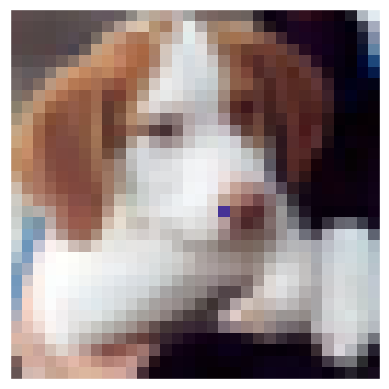

[95 76 78]
[[5, 17, 0.1811955], [6, 14, 0.09939861], [6, 18, 0.09784567], [6, 11, 0.09445697], [6, 17, 0.08650726], [22, 19, 0.06840348], [5, 18, 0.056456804], [3, 12, 0.054075778], [2, 13, 0.053829193], [6, 16, 0.043830395], [7, 12, 0.03764987], [7, 18, 0.035319984], [21, 18, 0.033661485], [6, 13, 0.028870344], [4, 12, 0.02490896], [20, 19, 0.023458362], [5, 14, 0.02083826], [4, 16, 0.01681012], [4, 17, 0.013578534], [5, 13, 0.011624873], [3, 17, 0.010395229], [22, 18, 0.010021746], [4, 14, 0.009427905], [20, 21, 0.009285331], [22, 17, 0.008374929], [1, 10, 0.007924736], [3, 13, 0.0077269673], [7, 11, 0.0075244904], [19, 20, 0.007447958], [20, 20, 0.007189393]]


In [13]:
# this cell is for test
image_id_1 = 16
pixel_1 = np.array([17, 18, 70, 50, 150])
# model = resnet

true_class_1 = y_test[image_id_1, 0]
prior_confidence_1 = model.predict_one(x_test[image_id_1])[true_class_1]
confidence_after_perturb = predict_classes(pixel_1, x_test[image_id_1], true_class_1, model)

print('Confidence in true class', class_names[true_class_1], 'is', confidence_after_perturb)
print('Prior confidence was', prior_confidence_1)
helper.plot_image(perturb_image(pixel_1, x_test[image_id_1]))

print(x_test[image_id_1][0][0])

# pixel_value is triple of (r,g,b) value, img's type is nd.array // 추후 여기 분리하자
def sensitive_pixel_sorting(image_id):
    img = x_test[image_id].copy()
    target_class = y_test[image_id, 0]

    diff_list = [[0,0,0]]

    prior_confidence =  model.predict_one(img)[target_class]

    rgb = [0, 0, 0]

    for x in range(32):
        for y in range(32):

          for i in range(3):
              if img[x][y][i] >= 128:
                rgb[i] = 0
              else:
                rgb[i] = 255

          pixel = np.array([x, y,  rgb[0], rgb[1], rgb[2]])
          perturbed_image = perturb_image(pixel, img)
          
          after_confidence =  model.predict_one(perturbed_image)[target_class]
          diff_confidence = abs(after_confidence - prior_confidence)

          if diff_confidence > 0:
              for diff_index in range(len(diff_list)):
                  if diff_confidence >= diff_list[diff_index][2]:
                      diff_list.insert(diff_index, [x, y, diff_confidence])
                      if (len(diff_list) > 30):
                          diff_list.pop()
                      break
    return diff_list

diff_list = sensitive_pixel_sorting(16)
print(diff_list)

In [14]:
# To check confidence score and class of images

con_high_list = [] # 60~99%
con_middle_list = [] # 20~59%
con_low_list = [] # 0~19%


for i in range (4000):
    image_id = i
    true_class = y_test[image_id, 0]
    confidence_score = model.predict_one(x_test[image_id])[true_class]
    # print(confidence_score)
    if confidence_score * 100 >= 60:
        con_high_list.append(i)
    elif 20 <= confidence_score * 100 < 60:
        con_middle_list.append(i)
    else:
        con_low_list.append(i)
    
# print(image_list[16])
# print(confidence_list[16])

print(len(con_high_list))
print(len(con_middle_list))
print(len(con_low_list))




def change_one(change_color, image_id, true_class, stride, pixel_stride):
    x_coord = []

    for i in range(256 // stride):
        x_coord.append(i*4)
    img = x_test[image_id].copy()
    graph_color = 'red'
    original_confidence = model.predict_one(x_test[image_id])[true_class]
    if change_color == 'r':
        target = 2
    elif change_color == 'g':
        target = 3
        graph_color = 'blue'
    elif change_color == 'b':
        target = 4
        graph_color = 'green'
    for i in range(0, 32, pixel_stride):
        for j in range(0, 32, pixel_stride):
            for k in range(256 // stride):
                original_rgb_value = img[i][j]
                pixel = np.array([i, j, img[i][j][0], img[i][j][1], img[i][j][2]])
                pixel[target] = k * stride # 0, 4, ... , 252
                perturbed_confidence = model.predict_one(perturb_image(pixel, img))[true_class]
                # confidence_difference = abs(original_confidence - perturbed_confidence)
                change_confidence_list.append(perturbed_confidence)
    j = 0
    k = -4
    for i in range(64):
        if i%8 == 0:
            k += 4
        plt.plot(x_coord, change_confidence_list[(256 // stride) * i: (256 // stride) * (i+1)], color = graph_color, linestyle = '--', marker = 'o')
        plt.xlabel("rgb value")
        plt.ylabel("confidence score difference")
        plt.title((k,j))
        plt.show()
        j += 4
        if j%32 == 0:
            j = 0

            
# change_one('r', 384, true_class, 4, 4)
            
def change_sensitive(change_color, image_id, true_class, stride):
    x_coord = []

    for i in range(256 // stride):
        x_coord.append(i*4)
    s_list = sensitive_pixel_sorting(image_id)
    img = x_test[image_id].copy()
    graph_color = 'red'
    original_confidence = model.predict_one(x_test[image_id])[true_class]
    if change_color == 'r':
        target = 2
    elif change_color == 'g':
        target = 3
        graph_color = 'blue'
    elif change_color == 'b':
        target = 4
        graph_color = 'green'
    for i in range(30):
        sensitive_x = s_list[i][0]
        sensitive_y = s_list[i][1]
        for k in range(256 // stride):
            original_rgb_value = img[sensitive_x][sensitive_y]
            pixel = np.array([sensitive_x, sensitive_y, img[sensitive_x][sensitive_y][0], img[sensitive_x][sensitive_y][1], img[sensitive_x][sensitive_y][2]])
            pixel[target] = k * stride
            perturbed_confidence = model.predict_one(perturb_image(pixel, img))[true_class]
            # confidence_difference = abs(original_confidence - perturbed_confidence)
            s_change_confidence_list.append(perturbed_confidence)
            
    for i in range(30):
        sensitive_x = s_list[i][0]
        sensitive_y = s_list[i][1]
        plt.plot(x_coord, s_change_confidence_list[(256 // stride) * i: (256 // stride) * (i+1)], color = graph_color, linestyle = '--', marker = 'o')
        plt.xlabel("rgb value")
        plt.ylabel("confidence score difference")
        plt.title((sensitive_x,sensitive_y))
        plt.show() 

#change_sensitive('r', 384, true_class, 4)    





3666
93
241


In [15]:
# This cell is for sensitivity maps

def pixel_confidence(image_id):
    img_original = x_test[image_id].copy()
    img_confidence = x_test[image_id].copy()
    target_class = y_test[image_id, 0]

    helper.plot_image(img_original)

    prior_confidence =  model.predict_one(img_original)[target_class]

    diff_list = [[0,0,0]]
    rgb = [0, 0, 0]

    for x in range(32):
        for y in range(32):
            for i in range(3):
                if img_original[x][y][i] >= 128:
                    rgb[i] = 0
                else:
                    rgb[i] = 255

            pixel = np.array([x, y,  rgb[0], rgb[1], rgb[2]])
            perturbed_image = perturb_image(pixel, img_original)

            after_confidence =  model.predict_one(perturbed_image)[target_class]
            diff_confidence = abs(after_confidence - prior_confidence)

            img_confidence = perturb_image(np.array([x, y,  255 - diff_confidence * 255, 255 - diff_confidence * 255, 255 - diff_confidence * 255]), img_confidence)
    # ----- top 30 or all
    
            if(diff_confidence > 0):
                   for diff_index in range(len(diff_list)):
                    if diff_confidence >= diff_list[diff_index][2]:
                        diff_list.insert(diff_index, [x, y, diff_confidence])
                    if (len(diff_list) > 30):
                        diff_list.pop()
                        break

    for i in range(30):
         img_confidence = perturb_image(np.array([diff_list[i][0], diff_list[i][1],  (30- i) * 8.5, 0, 0]), img_confidence)
    # ------
    print(diff_list)
    helper.plot_image(img_confidence)

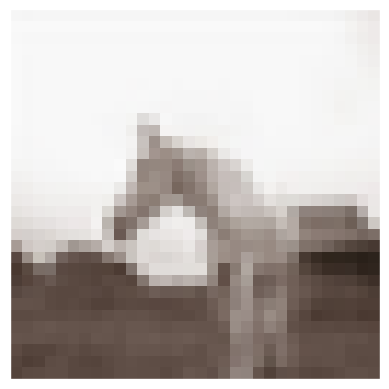

[[21, 13, 0.6967192], [21, 15, 0.69671273], [20, 15, 0.69670826], [21, 14, 0.696677], [20, 14, 0.69667435], [20, 13, 0.69665396], [20, 16, 0.69663787], [17, 13, 0.6966006], [20, 12, 0.6965735], [21, 12, 0.69655716], [12, 23, 0.69655544], [17, 19, 0.69643724], [19, 13, 0.69641954], [19, 12, 0.6962804], [11, 23, 0.69620174], [18, 13, 0.69619894], [16, 19, 0.69610137], [19, 15, 0.69605124], [16, 21, 0.695898], [18, 14, 0.6957921], [22, 13, 0.695404], [13, 23, 0.6951231], [19, 14, 0.6951143], [16, 20, 0.6951081], [12, 24, 0.6950772], [21, 16, 0.69478244], [18, 15, 0.69474185], [20, 11, 0.6947317], [18, 19, 0.69466686], [16, 18, 0.69429994]]


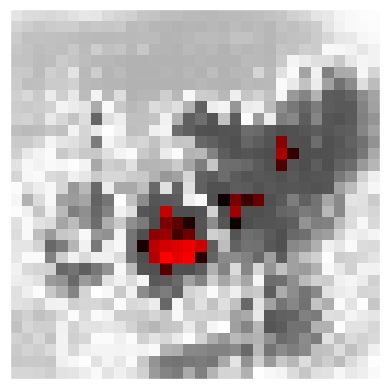

In [16]:
# test for sensitivity maps
pixel_confidence(87)

In [15]:
# Cell for plot change_one

image_id = 384
true_class = y_test[image_id, 0]
original_confidence = model.predict_one(x_test[image_id])[true_class] # [4] is a cat
s_change_confidence_list = []
change_confidence_list = []
stride = 4
pixel_stride = 4

#change_one('r', image_id, true_class, stride, pixel_stride)
#change_sensitive('r', image_id, true_class, stride)

In [16]:
# Cell for plot change_sensitive

image_id = 384
true_class = y_test[image_id, 0]
original_confidence = model.predict_one(x_test[image_id])[true_class] # [4] is a cat
s_change_confidence_list = []
change_confidence_list = []
stride = 4
pixel_stride = 4

#change_one('r', image_id, true_class, stride, pixel_stride)
#change_sensitive('r', image_id, true_class, stride)

In [17]:

def change_two(change_color1, change_color2, model, image_id, true_class, stride, pixel_stride):
    x_coord = []
    y_coord = []
    change_confidence_list_2 = []
    """
    for i in range(256 // stride):
        x_coord.append(i*stride)
    for i in range(256 // stride):
        y_coord.append(i*stride)
    """
    img = x_test[image_id].copy()
    graph_color = 'red'
    original_confidence = model.predict_one(x_test[image_id])[true_class]
    if change_color1 == change_color2:
        print("same color")
        return;
    if change_color1 == 'r':
        target1 = 2
    elif change_color1 == 'g':
        target1 = 3
        graph_color = 'blue'
    elif change_color1 == 'b':
        target1 = 4
        graph_color = 'green'
    if change_color2 == 'r':
        target2 = 2
    elif change_color2 == 'g':
        target2 = 3
        graph_color = 'blue'
    elif change_color2 == 'b':
        target2 = 4
        graph_color = 'green'
    for i in range(0, 32, pixel_stride):
        for j in range(0, 32, pixel_stride):
            for rgb_x in range(0, 256, stride):
                original_rgb_value = img[i][j]
                pixel = np.array([i, j, img[i][j][0], img[i][j][1], img[i][j][2]])
                pixel[target1] = rgb_x * stride # 0, 4, ... , 252
                for rgb_y in range(0, 256, stride):
                    x_coord.append(rgb_x)
                    y_coord.append(rgb_y)
                    pixel[target2] = rgb_y * stride # 0, 4, ... , 252
                    perturbed_confidence = model.predict_one(perturb_image(pixel, img))[true_class]
                    # confidence_difference = abs(original_confidence - perturbed_confidence)
                    change_confidence_list_2.append(perturbed_confidence)
    
    print(len(x_coord))
    print(len(y_coord))
    print(len(change_confidence_list_2))
    
    for i in range(pixel_stride * pixel_stride):
        graph_1 = plt.figure(1)
        graph_2 = graph_1.add_subplot(111, projection = '3d')
        graph_2.scatter(x_coord[pow((256 // stride), 2) * i: pow((256 // stride), 2) * (i+1)], y_coord[pow((256 // stride), 2) * i: pow((256 // stride), 2) * (i+1)], change_confidence_list_2[pow((256 // stride), 2) * i: pow((256 // stride), 2) * (i+1)], 'r', linestyle = '--', marker = 'o')
        graph_2.set_xlabel(change_color1)
        graph_2.set_ylabel(change_color2)
        graph_2.set_zlabel('perturbed confidence')
        # graph_2.plot_surface(x_coord, y_coord, change_confidence_list_2[(256 // stride) * i: (256 // stride) * (i+1)], cmap = "brg_r")
        #plt.title('perturbed confidence')
        plt.show()
    

In [37]:
global gnumber
gnumber = 0
def change_two_test(change_color1, change_color2, remained_color, model, image_id, true_class, stride, x, y, remained_rgb, step_color, original):
    x_coord = []
    y_coord = []
    change_confidence_list_2 = []
    x_label = None
    Y_label = None
    z_label = "Confidence score"
    
    global gnumber
    img = x_test[image_id].copy()
    graph_color = 'red'
    original_confidence = model.predict_one(x_test[image_id])[true_class]
    
    if change_color1 == change_color2:
        print("same color")
        return;
    if change_color1 == 'r':
        target1 = 2
        x_label = "Red"
    elif change_color1 == 'g':
        target1 = 3
        x_label = "Green"
    elif change_color1 == 'b':
        target1 = 4
        x_label = "Blue"
    if change_color2 == 'r':
        target2 = 2
        y_label = "Red"
    elif change_color2 == 'g':
        target2 = 3
        y_label = "Green"
    elif change_color2 == 'b':
        target2 = 4
        y_label = "Blue"
    if remained_color == 'r':
        target3 = 2
    elif remained_color == 'g':
        target3 = 3
    elif remained_color == 'b':
        target3 = 4
    pixel = np.array([x, y, img[x][y][0], img[x][y][1], img[x][y][2]])
    for rgb_x in range(0, 256, stride):
        pixel[target1] = rgb_x # 0, 4, ... , 252
        for rgb_y in range(0, 256, stride):
            x_coord.append(rgb_x)
            y_coord.append(rgb_y)
            pixel[target2] = rgb_y # 0, 4, ... , 252
            pixel[target3] = remained_rgb
            perturbed_confidence = model.predict_one(perturb_image(pixel, img))[true_class]
            # confidence_difference = abs(original_confidence - perturbed_confidence)
            change_confidence_list_2.append(perturbed_confidence)
    
    
    graph_1 = plt.figure(1)
    graph_2 = graph_1.add_subplot(111, projection = '3d')
    graph_2.scatter(x_coord, y_coord, change_confidence_list_2, 'r', alpha = 0.5)
    graph_2.set_xlabel(x_label)
    graph_2.set_ylabel(y_label)
    graph_2.set_zlabel(z_label)
    if original == 'original':
        plt.savefig('./graph_' + str(image_id) + '_' + step_color + '_' +  original + '.png', bbox_inches = 'tight')
    else:
        plt.savefig('./graph_' + str(image_id) + '_' + step_color + '_' +  str(remained_rgb) + '.png', bbox_inches = 'tight')
    gnumber += 1
    plt.show()
    

In [38]:
#list1 = sensitive_pixel_sorting(384) # high confidence, bird
#print(list1)
#list2 = sensitive_pixel_sorting(1470) # low confidence, horse
#list3 = sensitive_pixel_sorting(4) # high confidence, frog
#print(list3)
#list4 = sensitive_pixel_sorting(771) # middle confidence, automobile
#print(list4)
#list4 = sensitive_pixel_sorting(1492) # middle confidence, truck
#print(list4)
list4 = sensitive_pixel_sorting(87) # middle confidence, horse
print(list4)
print("\n\n\n")
sensitive_x = list4[0][0]
sensitive_y = list4[0][1]
print(sensitive_x)
print(sensitive_y)
#print(list2)

[[21, 13, 0.6967192], [21, 15, 0.69671273], [20, 15, 0.69670826], [21, 14, 0.696677], [20, 14, 0.69667435], [20, 13, 0.69665396], [20, 16, 0.69663787], [17, 13, 0.6966006], [20, 12, 0.6965735], [21, 12, 0.69655716], [12, 23, 0.69655544], [17, 19, 0.69643724], [19, 13, 0.69641954], [19, 12, 0.6962804], [11, 23, 0.69620174], [18, 13, 0.69619894], [16, 19, 0.69610137], [19, 15, 0.69605124], [16, 21, 0.695898], [18, 14, 0.6957921], [22, 13, 0.695404], [13, 23, 0.6951231], [19, 14, 0.6951143], [16, 20, 0.6951081], [12, 24, 0.6950772], [21, 16, 0.69478244], [18, 15, 0.69474185], [20, 11, 0.6947317], [18, 19, 0.69466686], [16, 18, 0.69429994]]




21
13


[217 213 210]


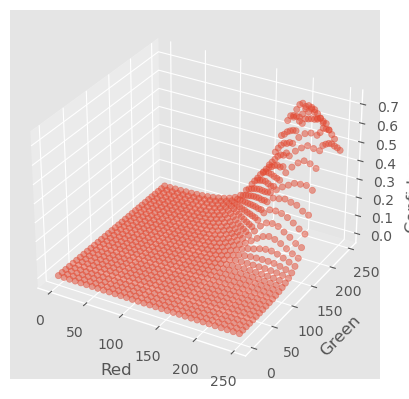


from here, blue will changed with stride 10




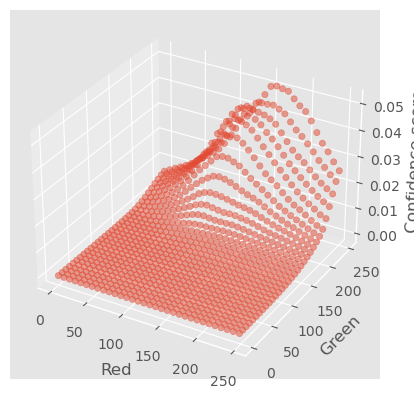

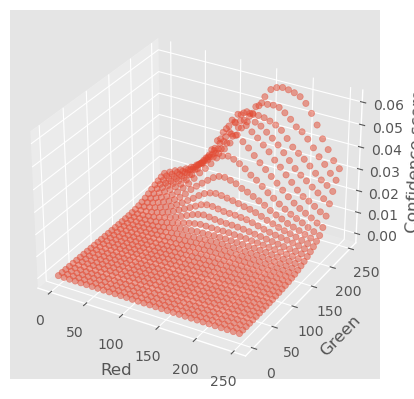

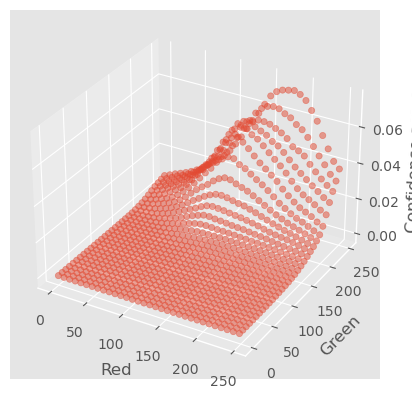

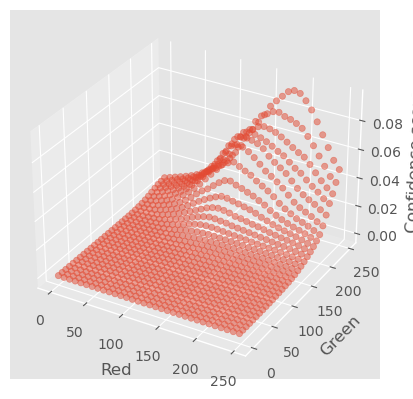

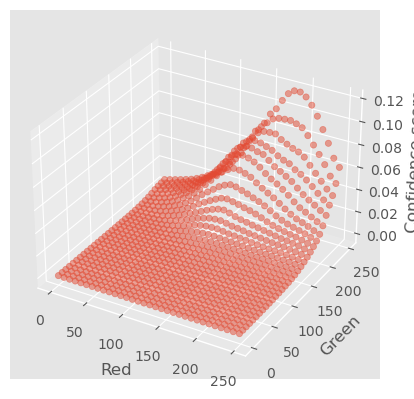

...

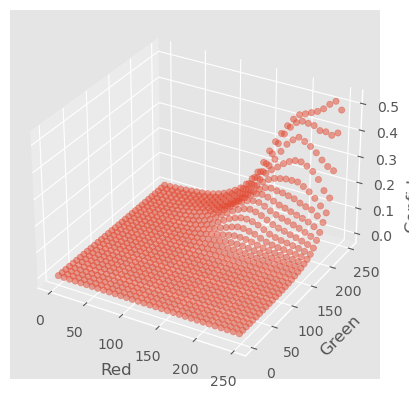

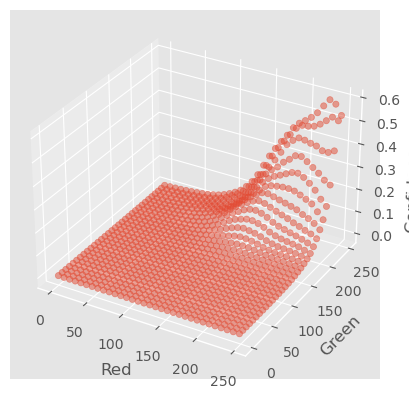

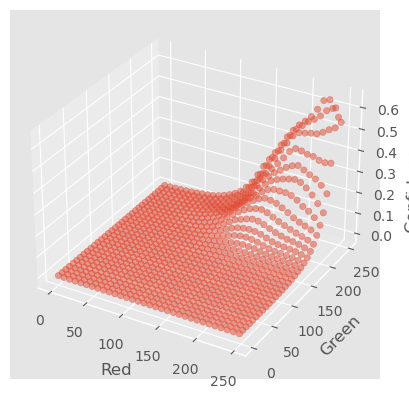

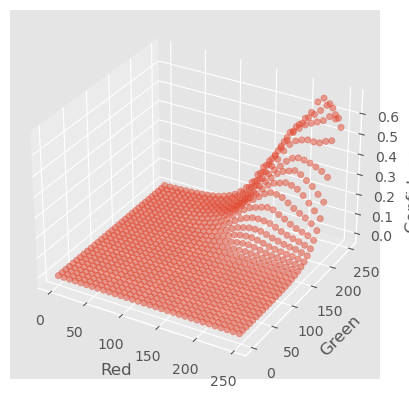

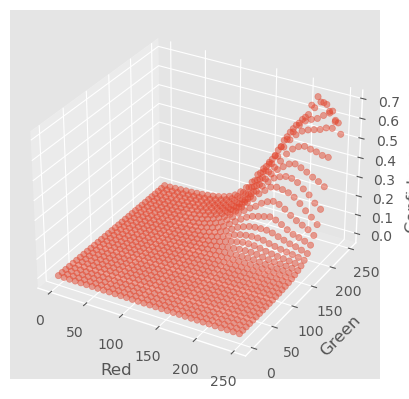

In [ ]:
# high confidence image
image_id = 87
true_class = y_test[image_id, 0]
stride = 8
test_image = x_test[image_id].copy()
sensitive_rgb = test_image[sensitive_x][sensitive_y] # most sensitive coordinate
print(sensitive_rgb)

random_rgb = test_image[16][17] # random coordinate
# pixel_stride = 8
graph_model = resnet
# print(sensitive_pixel_sorting(384))
# change_two('r', 'g', graph_model, image_id, true_class, stride, pixel_stride)

# r,g are main
change_two_test('r', 'g', 'b', graph_model, image_id, true_class, stride, sensitive_x, sensitive_y, sensitive_rgb[2], 'blue', 'original') # sensitive
print("\nfrom here, blue will changed with stride 10\n\n")
for remained_rgb in range(0, 255, 10):
    change_two_test('r', 'g', 'b', graph_model, image_id, true_class, stride, sensitive_x, sensitive_y, remained_rgb, 'blue', 'n') # r,g


"""
# -------------    
    
# r,b are main
change_two_test('r', 'b', 'g', graph_model, image_id, true_class, stride, sensitive_x, sensitive_y, sensitive_rgb[1], 'green', 'original') # sensitive
print("\nfrom here, green will changed with stride 10\n\n")
for remained_rgb in range(0, 255, 10):
    change_two_test('r', 'b', 'g', graph_model, image_id, true_class, stride, sensitive_x, sensitive_y, remained_rgb, 'green', 'n') # r,b

#--------------    
    
# g,b are main
change_two_test('g', 'b', 'r', graph_model, image_id, true_class, stride, sensitive_x, sensitive_y, sensitive_rgb[0], 'red', 'original') # sensitive
print("\nfrom here, red will changed with stride 10\n\n")
for remained_rgb in range(0, 255, 10):
    change_two_test('g', 'b', 'r', graph_model, image_id, true_class, stride, sensitive_x, sensitive_y, remained_rgb, 'red', 'n') # r,g
"""


"""
#from here, random piexl and r,g are main
change_two_test('r', 'g', 'b', graph_model, image_id, true_class, stride, 16, 17, random_rgb[2]) # sensitive
print("\nfrom here, blue will changed with stride 10, random pixel\n\n")
for remained_rgb in range(0, 255, 10):
    change_two_test('r', 'g', 'b', graph_model, image_id, true_class, stride, 16, 17, remained_rgb) # r,g
#change_two_test('r', 'b', graph_model, image_id, true_class, stride, 16, 17) # random
#change_two_test('r', 'b', graph_model, image_id, true_class, stride, 24, 12) # weired
"""




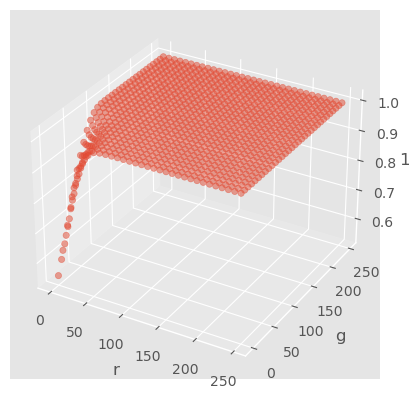


from here, blue will changed with stride 10




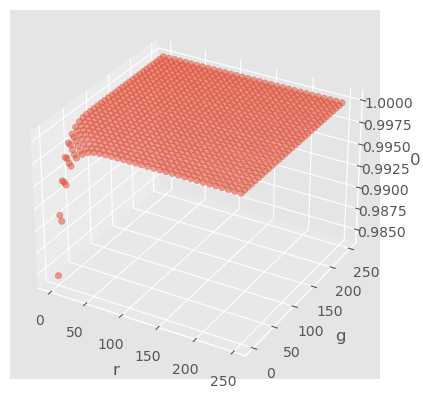

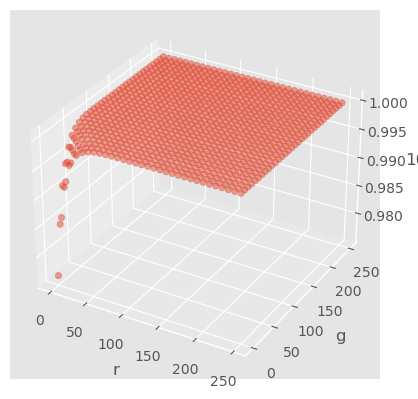

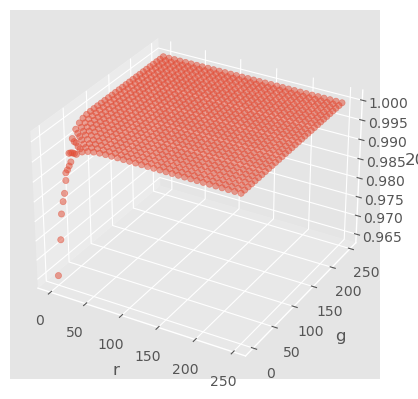

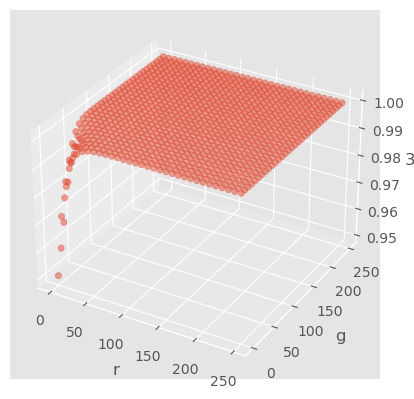

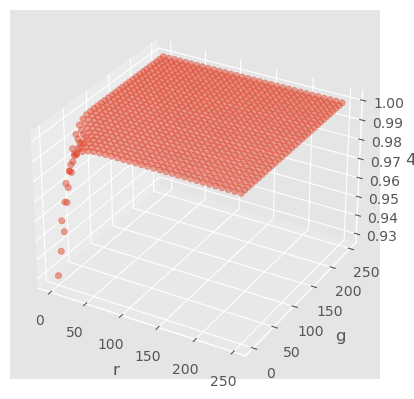

...

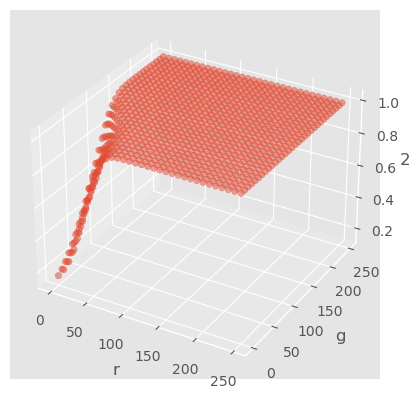

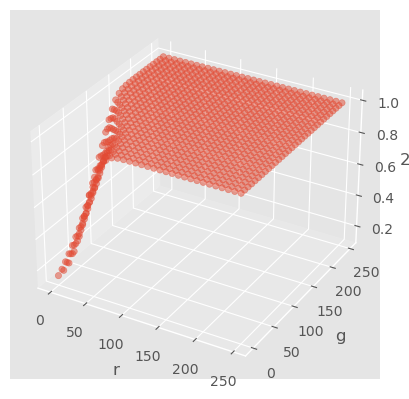

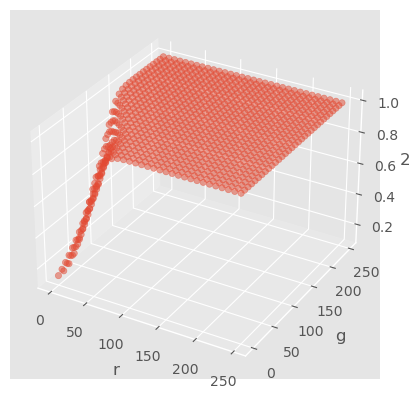

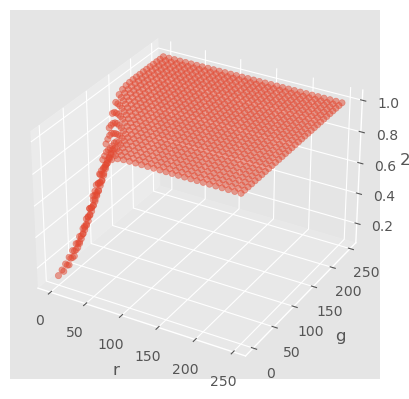

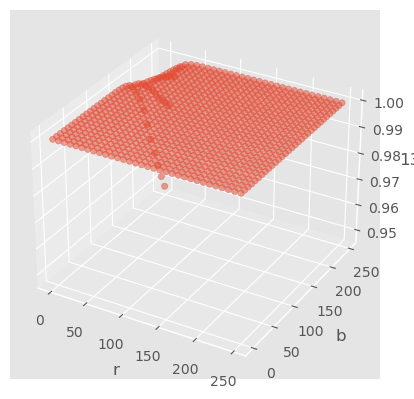


from here, green will changed with stride 10




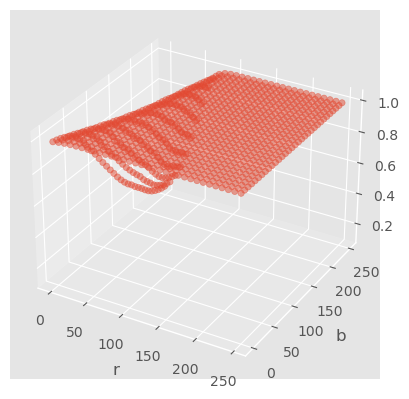

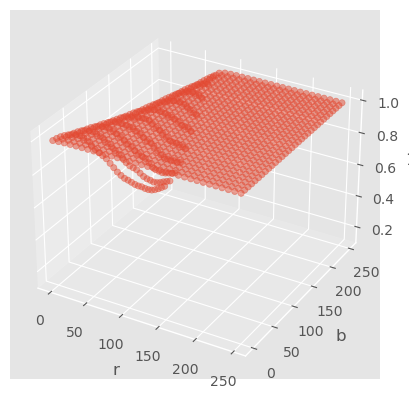

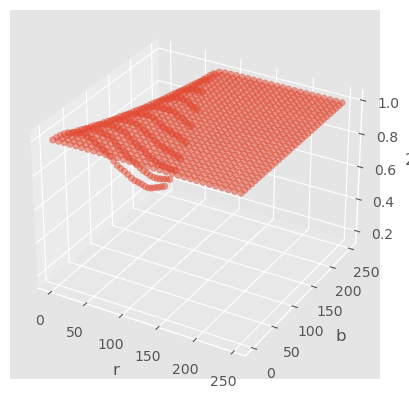

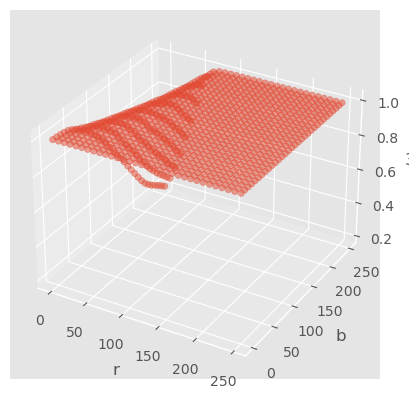

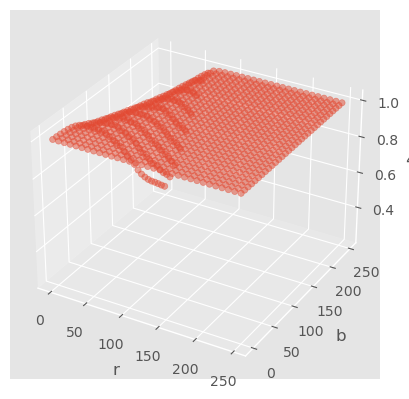

...

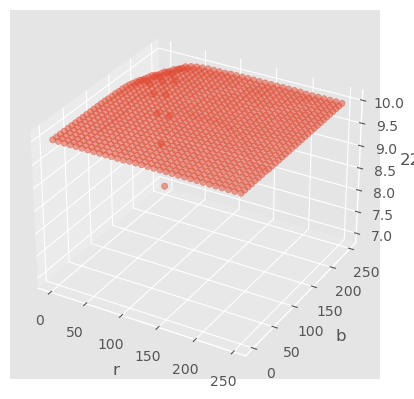

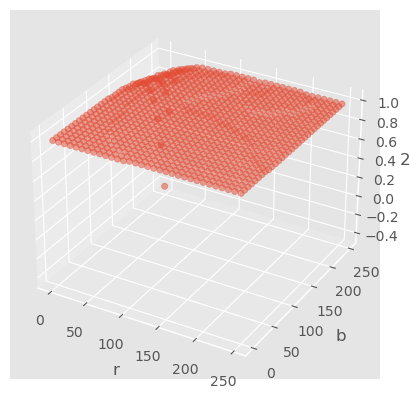

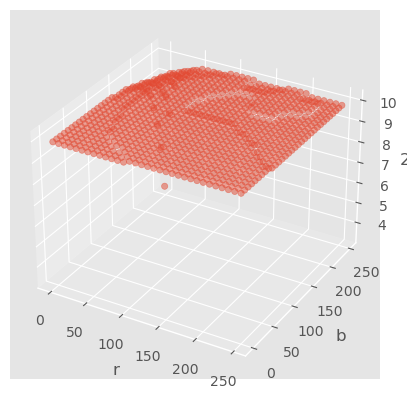

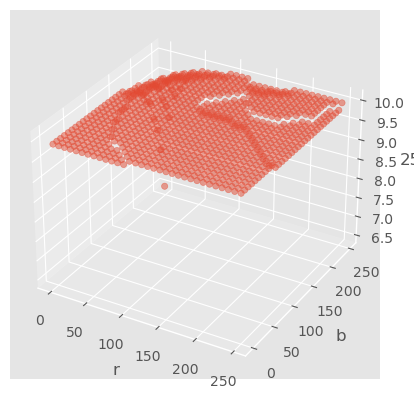

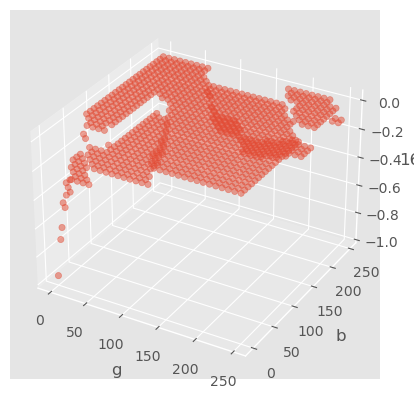


from here, red will changed with stride 10




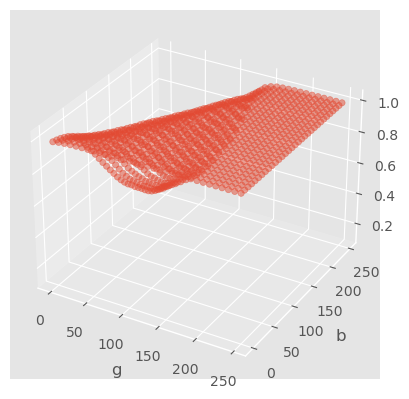

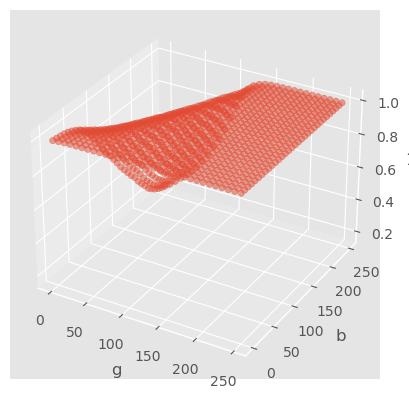

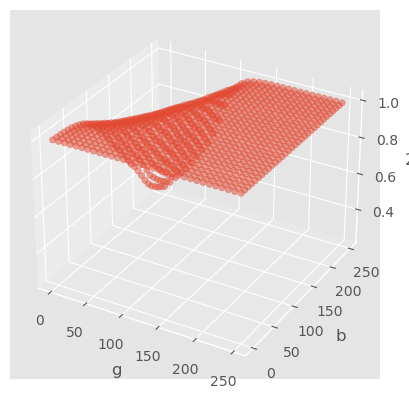

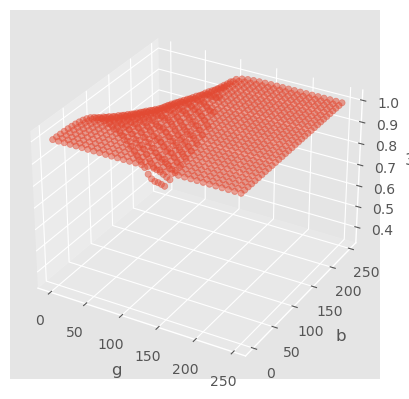

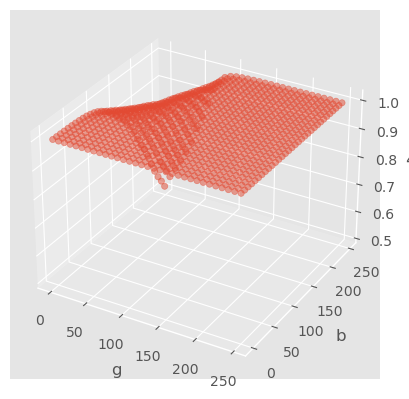

...

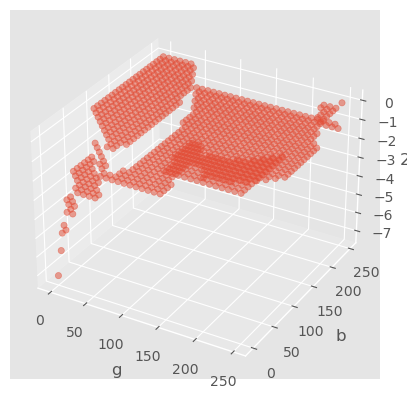

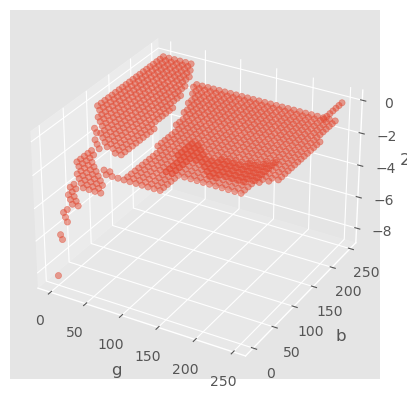

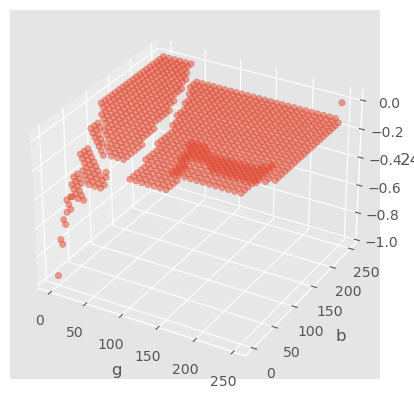

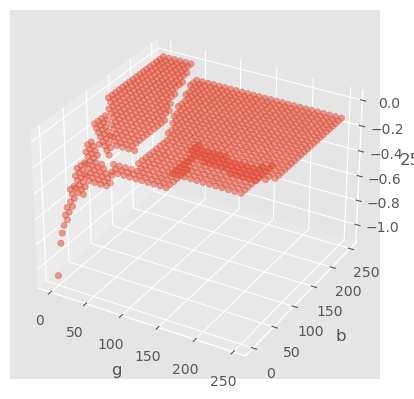

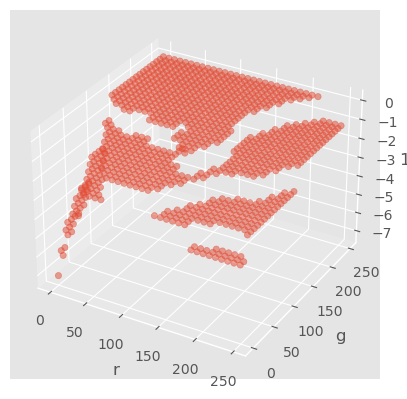


from here, blue will changed with stride 10, random pixel




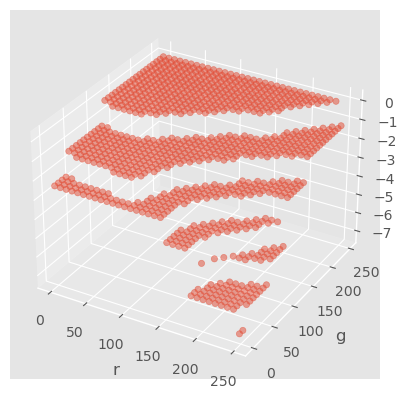

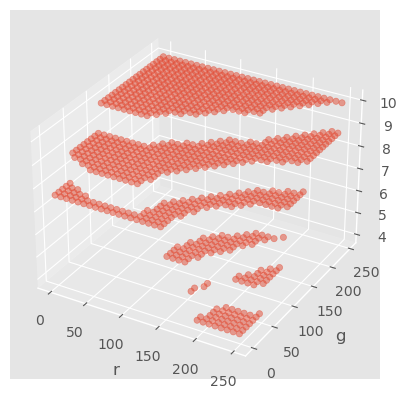

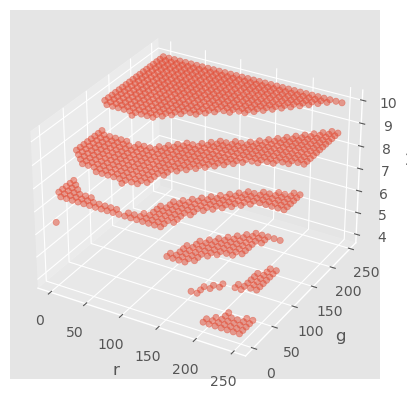

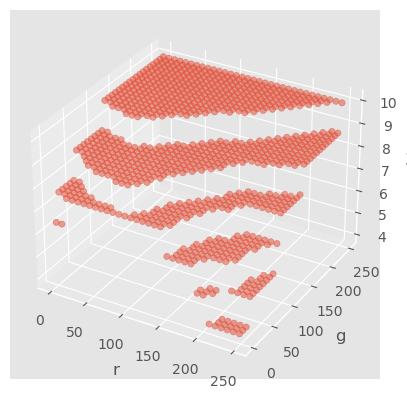

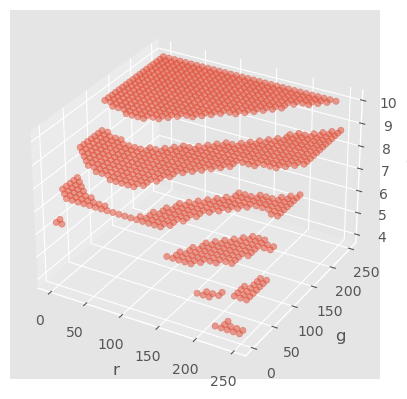

...

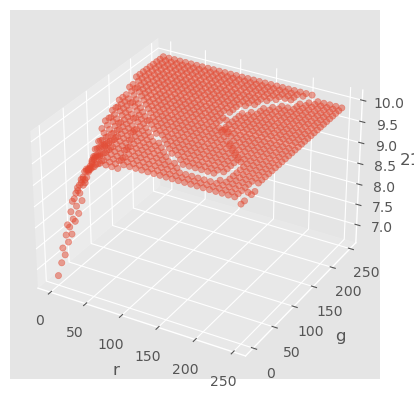

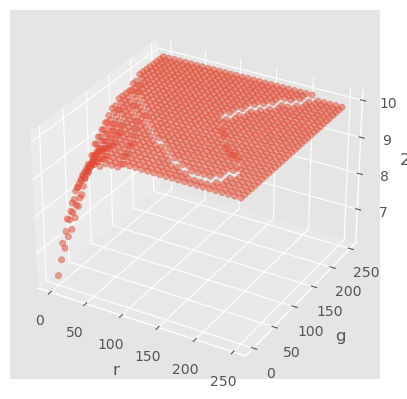

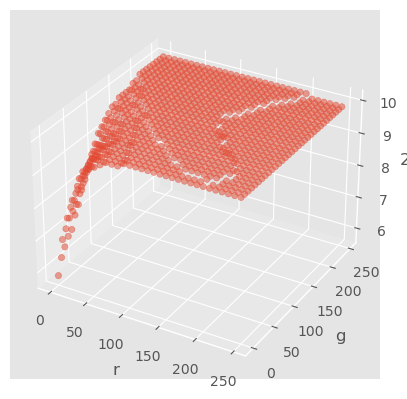

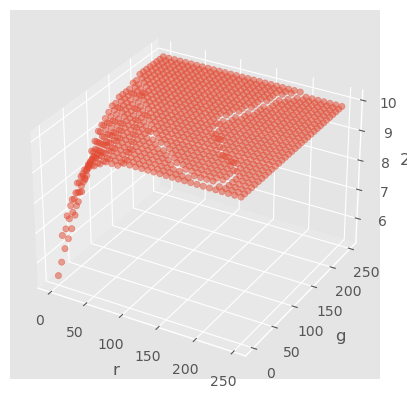

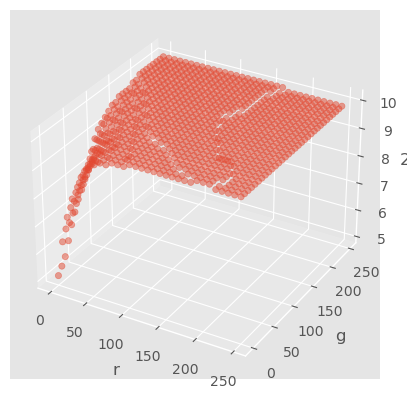

In [89]:
# high confidence image
image_id = 4
true_class = y_test[image_id, 0]
stride = 8
test_image = x_test[image_id].copy()
sensitive_rgb = test_image[17][19] # most sensitive coordinate
random_rgb = test_image[20][24] # random coordinate
# pixel_stride = 8
graph_model = resnet
# print(sensitive_pixel_sorting(384))
# change_two('r', 'g', graph_model, image_id, true_class, stride, pixel_stride)

# r,g are main
change_two_test('r', 'g', 'b', graph_model, image_id, true_class, stride, 17, 19, sensitive_rgb[2], 'blue', 'original') # sensitive
print("\nfrom here, blue will changed with stride 10\n\n")
for remained_rgb in range(0, 255, 10):
    change_two_test('r', 'g', 'b', graph_model, image_id, true_class, stride, 17, 19, remained_rgb, 'blue', 'n') # r,g

# r,b are main
change_two_test('r', 'b', 'g', graph_model, image_id, true_class, stride, 17, 19, sensitive_rgb[1], 'green', 'original') # sensitive
print("\nfrom here, green will changed with stride 10\n\n")
for remained_rgb in range(0, 255, 10):
    change_two_test('r', 'b', 'g', graph_model, image_id, true_class, stride, 17, 19, remained_rgb, 'green', 'n') # r,b

# g,b are main
change_two_test('g', 'b', 'r', graph_model, image_id, true_class, stride, 17, 19, sensitive_rgb[0], 'red', 'original') # sensitive
print("\nfrom here, red will changed with stride 10\n\n")
for remained_rgb in range(0, 255, 10):
    change_two_test('g', 'b', 'r', graph_model, image_id, true_class, stride, 17, 19, remained_rgb, 'red', 'n') # r,g
"""    
#from here, random piexl and r,g are main
change_two_test('r', 'g', 'b', graph_model, image_id, true_class, stride, 20, 24, random_rgb[2], 'blue', 'original') # sensitive
print("\nfrom here, blue will changed with stride 10, random pixel\n\n")
for remained_rgb in range(0, 255, 10):
    change_two_test('r', 'g', 'b', graph_model, image_id, true_class, stride, 20, 24, remained_rgb, 'blue', 'n') # r,g
#change_two_test('r', 'b', graph_model, image_id, true_class, stride, 16, 17) # random
#change_two_test('r', 'b', graph_model, image_id, true_class, stride, 24, 12) # weired
"""

## The Attack

Here we will demonstrate two variants of the one pixel attack: untargeted and targeted.

### Targeted vs. Untargeted Attacks

The objective of an untargeted attack is to cause a model to misclassify an image. This means we want to perturb an image as to minimize the confidence probability of the correct classification category and maximize the sum of the probabilities of all other categories.

The objective of a targeted attack is to cause a model to classify an image as a given  target class. We want to perturb an image as to maximize the probability of a class of our own choosing.

### Success Criterion

Define a function so that whenever a given perturbation is sufficient to fool a model, it returns `True`. This will be called the success criterion. The `targeted_attack` boolean flag will indicate whether success means maximization of the target class or minimization of the correct (target) class.

In [21]:
def attack_success(x, img, target_class, model, targeted_attack=False, verbose=False):
    # Perturb the image with the given pixel(s) and get the prediction of the model
    attack_image = perturb_image(x, img)

    confidence = model.predict(attack_image)[0] # attack_image가 배열이다. 그 중 하나를 리턴.
    predicted_class = np.argmax(confidence) # 그 중 최댓값을 고른다..
    
    # If the prediction is what we want (misclassification or 
    # targeted classification), return True
    if verbose:
        print('Confidence:', confidence[target_class])
    if ((targeted_attack and predicted_class == target_class) or
        (not targeted_attack and predicted_class != target_class)):
        return True
    # NOTE: return None otherwise (not False), due to how Scipy handles its callback function

Here we demonstrate the usage of the success criterion function. It's nearly identical to `predict_class()` as before, but also decides the success of the attack. For purposes of demonstration we assume an untargeted attack.

Confidence: 0.07460061
Prior confidence 0.50054187
Attack success: True


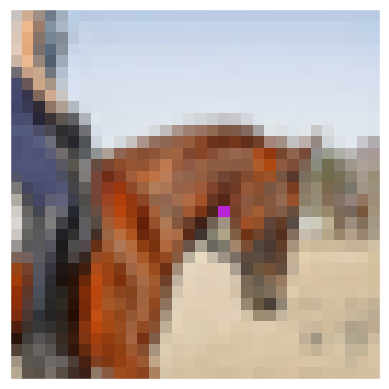

In [22]:
image_id = 541
pixel = np.array([17, 18, 185, 36, 215])
model = resnet

true_class = y_test[image_id, 0]
prior_confidence = model.predict_one(x_test[image_id])[true_class]
success = attack_success(pixel, x_test[image_id], true_class, model, verbose=True)

print('Prior confidence', prior_confidence)
print('Attack success:', success == True)
helper.plot_image(perturb_image(pixel, x_test[image_id])[0])

### Attack Function

Finally, we arrive at the attack itself: how do we find the pixels that will result in a successful attack? First, formulate it as an optimization problem: in an untargeted attack, minimize the confidence of the correct class, and in a targeted attack, maximize the confidence of a target class. This is precisely our `predict_class` function.

When performing black-box optimizations such as the one pixel attack, it can be very difficult to find an efficient gradient-based optimization that will work for the problem. It would be nice to use an optimization algorithm that can find good solutions without relying on the smoothness of the function. In our case, we have discrete integer positions ranging from 0 to 31 and color intensities from 0 to 255, so the function is expected to be jagged.

For that, we use an algorithm called [differential evolution](https://en.wikipedia.org/wiki/Differential_evolution). Here's an example of differential evolution optimizing the [Ackley function](https://en.wikipedia.org/wiki/Ackley_function) (if you're using Google Colab, run the code cell below):

<br>

![Ackley GIF](images/Ackley.gif)

<br>

Differential evolution is a type of evolutionary algorithm where a population of candidate solutions generate offspring which compete with the rest of the population each generation according to their fitness. Each candidate solution is represented by a vector of real numbers which are the inputs to the function we would like to minimize. The lower the output of this function, the better the fitness. The algorithm works by initializing a (usually random) population of vectors, generating new offspring vectors by combining (mutating) individuals in the population, and replacing worse-performing individuals with better candidates.

In the context of the one pixel attack, our input will be a flat vector of pixel values:

$$X = (x_1, y_1, r_1, g_1, b_1, x_2, y_2, r_2, g_2, b_2, ...)$$

These will be encoded as floating-point values, but will be floored back into integers to calculate image perturbations. First we generate a random population of $n$ perturbations

$$\textbf{P} = (X_1, X_2, \dots, X_n)$$

Then, on each iteration we calculate $n$ new mutant children using the formula

$$X_i = X_{r1} + F (X_{r2} - X_{r3})$$

such that

$$r1 \neq r2 \neq r3$$

where $r1,r2,r3$ are random indices into our population $\textbf{P}$, and $F = 0.5$ is a mutation parameter. Basically, we pick 3 random individuals from the previous generation and recombine them to make a new candidate solution. If this candidate $X_i$ gives a lower minimum at position $i$ (i.e., the attack is closer to success), replace the old $X_i$ with this new one. This process repeats for several iterations until our stopping criterion, `attack_success`, which is when we find an image that successfully completes the attack.

<br>

See [this excellent tutorial post](https://pablormier.github.io/2017/09/05/a-tutorial-on-differential-evolution-with-python/) on how differential evolution works in greater detail. 

We will use a [slight modification](differential_evolution.py) of [Scipy's implementation of differential evolution](https://docs.scipy.org/doc/scipy-0.17.0/reference/generated/scipy.optimize.differential_evolution.html) to utilize GPU parallelism by batching predictions together.

In [23]:
# Run this cell if you are using Google Colab to see the Ackley GIF
if in_colab:
    from IPython.display import Image
    with open('images/Ackley.gif','rb') as file:
        display(Image(file.read()))

In [24]:
#pixel_list = sensitive_pixel_sorting(384)# temp, 384 sensitive list

In [25]:
def attack(img_id, model, target=None, pixel_count=1, 
           maxiter=75, popsize=400, verbose=False):
    # Change the target class based on whether this is a targeted attack or not
    targeted_attack = target is not None
    target_class = target if targeted_attack else y_test[img_id, 0]
    
    # Define bounds for a flat vector of x,y,r,g,b values
    # For more pixels, repeat this layout
    bounds = [(0,32), (0,32), (0,256), (0,256), (0,256)] * pixel_count
    
    # Population multiplier, in terms of the size of the perturbation vector x
    popmul = max(1, popsize // len(bounds))
    # 이거 체크, 왜 이런 표현을 썼지..?
    # 나중에 parameter_count를 다시 곱해줄 거라 여기서 나눠준다.
    
    
    """
        1. Choose sensitive pixel by confidence score difference
            1.1 predict 통해서 confidence score difference 비교하고
            1.2 descending order sorting      
        2. Color distance
            2.1 distance 구하는 function 따로 만들어 놓자(조금만 바꾸면 될 듯?)
        3. Algorithm1 & Algorithm2
        4. 추후 OPA2D-ATK은 얘를 복붙해서 조금만 바꿔서 만들면 될 듯?
    """
    
    # Format the predict/callback functions for the differential evolution algorithm
    def predict_fn(xs):
        return predict_classes(xs, x_test[img_id], target_class, 
                               model, target is None)                                                         
    
    def callback_fn(x, convergence):
        return attack_success(x, x_test[img_id], target_class, 
                              model, targeted_attack, verbose)
    
    # Call Scipy's Implementation of Differential Evolution
    attack_result = differential_evolution(
        predict_fn, bounds, maxiter=maxiter, popsize=popmul,
        recombination=1, atol=-1, callback=callback_fn, polish=False)
    # result == (self.x, self.population_energies[0], nfev, nit, status_message, warning_flag)

    # Calculate some useful statistics to return from this function
    attack_image = perturb_image(attack_result.x, x_test[img_id])[0]
    prior_probs = model.predict_one(x_test[img_id]) # 여기가 테스트할 부분
    predicted_probs = model.predict_one(attack_image) # 여기가 테스트할 부분
    predicted_class = np.argmax(predicted_probs)
    actual_class = y_test[img_id, 0]
    success = predicted_class != actual_class
    cdiff = prior_probs[actual_class] - predicted_probs[actual_class]

    # Show the best attempt at a solution (successful or not)
    helper.plot_image(attack_image, actual_class, class_names, predicted_class)

    return [model.name, pixel_count, img_id, actual_class, predicted_class, success, cdiff, prior_probs, predicted_probs, attack_result.x]


In [26]:
global Lopt
Lopt = 256
global Alphamax
Alphamax = Lopt - 1
global Alphamin
Alphamin = 1
global Alpha
Lopt_list = []
attacked_pixel_coord = []
def my_attack_3(img_id, model, target=None, pixel_count=1, 
           maxiter=75, popsize=400, verbose=False):
    # Change the target class based on whether this is a targeted attack or not
    targeted_attack = target is not None
    target_class = target if targeted_attack else y_test[img_id, 0]
    
    
    global Alphamax
    global Alphamin
    global Lopt
    global Alpha
    
    # pixel_list.reverse()
    
    # pixel_list = sensitive_pixel_sorting(img_id)
    for i in range(0,30):
        # Re-initialize
        Lopt = 256
        Alphamax = Lopt - 1
        Alphamin = 1
        print("\n\nRound ", i)
        while(Alphamin <= Alphamax):
            # print(Alphamin)
            # print(Alphamax)
            img = x_test[img_id]
            sensitive_x_coord = pixel_list[i][0]
            sensitive_y_coord = pixel_list[i][1]
            original_rgb = img[sensitive_x_coord][sensitive_y_coord]
            Alpha = (Alphamax + Alphamin) // 2
            new_rgb_range = [(max(original_rgb[0] - Alpha, 0), min(original_rgb[0] + Alpha, 255)), (max(original_rgb[1] - Alpha, 0), min(original_rgb[1] + Alpha, 255)), (max(original_rgb[2] - Alpha, 0), min(original_rgb[2] + Alpha, 255))]
            # print(new_rgb_range)
            new_red_range = new_rgb_range[0]
            new_green_range = new_rgb_range[1]
            new_blue_range = new_rgb_range[2]
            # print(new_red_range)
            # print(new_green_range)
            # print(new_blue_range)


            # Define bounds for a flat vector of x,y,r,g,b values
            # For more pixels, repeat this layout
            # bounds = [(0,32), (0,32), (0,256), (0,256), (0,256)] * pixel_count
            bounds = [(sensitive_x_coord, sensitive_x_coord), (sensitive_y_coord, sensitive_y_coord), new_red_range, new_green_range, new_blue_range]


            # Population multiplier, in terms of the size of the perturbation vector x
            popmul = max(1, popsize // len(bounds))
            # 이거 체크, 왜 이런 표현을 썼지..?
            # 나중에 parameter_count를 다시 곱해줄 거라 여기서 나눠준다.


            """
                1. Choose sensitive pixel by confidence score difference
                    1.1 predict 통해서 confidence score difference 비교하고
                    1.2 descending order sorting      
                2. Color distance
                    2.1 distance 구하는 function 따로 만들어 놓자(조금만 바꾸면 될 듯?)
                3. Algorithm1 & Algorithm2
                4. 추후 OPA2D-ATK은 얘를 복붙해서 조금만 바꿔서 만들면 될 듯?
            """

            # Format the predict/callback functions for the differential evolution algorithm
            def predict_fn(xs):
                return predict_classes(xs, x_test[img_id], target_class, 
                                       model, target is None)                                                         

            def callback_fn(x, convergence):
                return attack_success(x, x_test[img_id], target_class, 
                                      model, targeted_attack, verbose)

            # Call Scipy's Implementation of Differential Evolution
            attack_result = differential_evolution(
                predict_fn, bounds, maxiter=maxiter, popsize=popmul,
                recombination=1, atol=-1, callback=callback_fn, polish=False)
            # result == (self.x, self.population_energies[0], nfev, nit, status_message, warning_flag)
            # print(attack_result.x)
            # Calculate some useful statistics to return from this function
            attack_image = perturb_image(attack_result.x, x_test[img_id])[0]
            # final_attack_image = attack_image # mycode
            prior_probs = model.predict_one(x_test[img_id]) # 여기가 테스트할 부분
            predicted_probs = model.predict_one(attack_image) # 여기가 테스트할 부분
            predicted_class = np.argmax(predicted_probs)
            actual_class = y_test[img_id, 0]
            success = predicted_class != actual_class
            cdiff = prior_probs[actual_class] - predicted_probs[actual_class]
            # my code
            if(success):
                Lopt = max(abs(attack_result.x[2] - original_rgb[0]), abs(attack_result.x[3] - original_rgb[1]), abs(attack_result.x[4] - original_rgb[2]))
                # print("Lopt  in if is", Lopt)
                Alphamax = Lopt - 1
                final_attack_image = attack_image
                final_predicted_class = predicted_class
                helper.plot_image(final_attack_image, actual_class, class_names, final_predicted_class)
                Lopt_list.append(Lopt)
                attacked_pixel_coord.extend([i, sensitive_x_coord, sensitive_y_coord])
                print("Success Lopt is", Lopt)
                # print("In success")
            else:
                # print("Alpha is", Alpha)
                Alphamin = Alpha + 1
                # print("else Alphamin = ", Alphamin)
                # print("Lopt  in else is", Lopt)
        """
        # my code
        if(success):
            Lopt = max(abs(attack_result.x[2] - original_rgb[0]), abs(attack_result.x[3] - original_rgb[1]), abs(attack_result.x[4] - original_rgb[2]))
            Alphamax = Lopt - 1
            count += 1
        else:
            Alphamin = Alpha + 1
            count += 1
        """

        # Show the best attempt at a solution (successful or not)
        print("Final Lopt is", Lopt)
        # helper.plot_image(attack_image, actual_class, class_names, predicted_class)
        #Re-initialize

    return [model.name, pixel_count, img_id, actual_class, predicted_class, success, cdiff, prior_probs, predicted_probs, attack_result.x]

# From here, We propose our gradient_descent using momentum. <br>

There are many variations.


In [27]:
def bound(value):
    return int(max(0, min(value, 255)))


def gradient_descent_momentum(image_id, model, sensitive_x, sensitive_y):
    img = x_test[image_id].copy()
    true_class = y_test[image_id, 0]
    original_confidence = model.predict_one(img)
    print("original confidence is : ", original_confidence[true_class], '\n')
    #img[sensitive_x][sensitive_y][0]
    #img[sensitive_x][sensitive_y][1]
    #img[sensitive_x][sensitive_y][2]
    r = img[sensitive_x][sensitive_y][0]
    g = img[sensitive_x][sensitive_y][1]
    b = img[sensitive_x][sensitive_y][2]
    print("original rgb is : ", r, g, b)
    
    # 우선은 sensitive rgb에서 시작... 어디가 시점인게 좋으려나?
    momentum = 0.9 # widely used
    learning_rate = 500 # hyperparameter, confidence 낮출 땐 0.1
    vr = 0
    vg = 0
    vb = 0
    
    for i in range(15):
        decr_red = np.array([sensitive_x, sensitive_y, bound(r-1), g, b])
        incr_red = np.array([sensitive_x, sensitive_y, bound(r+1), g, b])
        decr_red_confidence = model.predict_one(perturb_image(decr_red, img))[true_class]
        incr_red_confidence = model.predict_one(perturb_image(incr_red, img))[true_class]

    
        diff_r = (incr_red_confidence - decr_red_confidence)
        print(diff_r)
        
        decr_green = np.array([sensitive_x, sensitive_y, r, bound(g-1), b])
        incr_green = np.array([sensitive_x, sensitive_y, r, bound(g+1), b])
        decr_green_confidence = model.predict_one(perturb_image(decr_green, img))[true_class]
        incr_green_confidence = model.predict_one(perturb_image(incr_green, img))[true_class]

    
        diff_g = (incr_green_confidence - decr_green_confidence)
        print(diff_g)
        
        decr_blue = np.array([sensitive_x, sensitive_y, r, g, bound(b-1)])
        incr_blue = np.array([sensitive_x, sensitive_y, r, g, bound(b+1)])
        decr_blue_confidence = model.predict_one(perturb_image(decr_blue, img))[true_class]
        incr_blue_confidence = model.predict_one(perturb_image(incr_blue, img))[true_class]

    
        diff_b = (incr_blue_confidence - decr_blue_confidence)
        print(diff_b)
        
        
        vr = momentum * vr - learning_rate * diff_r # r axis vector
        vg = momentum * vg - learning_rate * diff_g # g axis vector
        vb = momentum * vb - learning_rate * diff_b # b axis vector
        
        print(vr, vg, vb)
        new_r = bound(r + vr)
        new_g = bound(g + vg)
        new_b = bound(b + vb)
        xs = np.array([sensitive_x, sensitive_y, new_r, new_g, new_b])
        print("new rgb is : ", new_r, new_g, new_b)
        predicted_probs = model.predict_one(perturb_image(xs, img))
        
        # added early stop, how to choose termination point?
        if(predicted_probs[true_class] < 0.01):
            break
        predicted_class = np.argmax(predicted_probs)
        print(str(i) + "th round's confidence : ", predicted_probs[predicted_class])
        helper.plot_image(perturb_image(xs, x_test[image_id])[0], true_class, class_names, predicted_class)
        #image = Image.fromarray(perturb_image(xs, x_test[image_id])[0])
        #image.save("fig1_b.png", "png") # code for save image, temporary
        print('\n')
        if(new_r == r and new_g == g and new_b == b):
            break
        
        r = new_r
        g = new_g
        b = new_b

# This code is for targetted attack.

In [28]:
def gradient_descent_momentum_targetted(image_id, model, sensitive_x, sensitive_y, target_index):
    # class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
    img = x_test[image_id].copy()
    true_class = y_test[image_id, 0]
    original_confidence = model.predict_one(img)
    print("original confidence is : ", original_confidence[true_class], '\n')
    print("target class's confidence is : ", original_confidence[target_index], '\n')
    #img[sensitive_x][sensitive_y][0]
    #img[sensitive_x][sensitive_y][1]
    #img[sensitive_x][sensitive_y][2]
    r = img[sensitive_x][sensitive_y][0]
    g = img[sensitive_x][sensitive_y][1]
    b = img[sensitive_x][sensitive_y][2]
    print("original rgb is : ", r, g, b)
    # 우선은 sensitive rgb에서 시작... 어디가 시점인게 좋으려나?
    momentum = 0.9 # widely used
    learning_rate = 5000 # hyperparameter, confidence 낮출 땐 0.1
    vr = 0
    vg = 0
    vb = 0
    
    # How can I determine iteration number?
    for i in range(15):
        decr_red = np.array([sensitive_x, sensitive_y, bound(r-1), g, b])
        incr_red = np.array([sensitive_x, sensitive_y, bound(r+1), g, b])
        decr_red_confidence = model.predict_one(perturb_image(decr_red, img))[target_index]
        incr_red_confidence = model.predict_one(perturb_image(incr_red, img))[target_index]

    
        diff_r = (incr_red_confidence - decr_red_confidence)
        print(diff_r)
        
        decr_green = np.array([sensitive_x, sensitive_y, r, bound(g-1), b])
        incr_green = np.array([sensitive_x, sensitive_y, r, bound(g+1), b])
        decr_green_confidence = model.predict_one(perturb_image(decr_green, img))[target_index]
        incr_green_confidence = model.predict_one(perturb_image(incr_green, img))[target_index]

    
        diff_g = (incr_green_confidence - decr_green_confidence)
        print(diff_g)
        
        decr_blue = np.array([sensitive_x, sensitive_y, r, g, bound(b-1)])
        incr_blue = np.array([sensitive_x, sensitive_y, r, g, bound(b+1)])
        decr_blue_confidence = model.predict_one(perturb_image(decr_blue, img))[target_index]
        incr_blue_confidence = model.predict_one(perturb_image(incr_blue, img))[target_index]

    
        diff_b = (incr_blue_confidence - decr_blue_confidence)
        print(diff_b)
        
        # climbing
        vr = momentum * vr + learning_rate * diff_r # r axis vector
        vg = momentum * vg + learning_rate * diff_g # g axis vector
        vb = momentum * vb + learning_rate * diff_b # b axis vector
        
        new_r = bound(r + vr)
        new_g = bound(g + vg)
        new_b = bound(b + vb)
        xs = np.array([sensitive_x, sensitive_y, new_r, new_g, new_b])
        print("new rgb is : ", new_r, new_g, new_b)
        # targetted attack
        predicted_probs = model.predict_one(perturb_image(xs, img))
        predicted_class = np.argmax(predicted_probs)
        print(str(i) + "th round's confidence for original class : ", predicted_probs[true_class])
        print(str(i) + "th round's confidence for target class : ", predicted_probs[target_index])
        helper.plot_image(perturb_image(xs, x_test[image_id])[0], true_class, class_names, predicted_class)
        #image = Image.fromarray(perturb_image(xs, x_test[image_id])[0])
        #image.save("fig1_b.png", "png") # code for save image, temporary
        print('\n')
        if(new_r == r and new_g == g and new_b == b):
            break
        
        r = new_r
        g = new_g
        b = new_b

In [29]:

def gradient_descent_momentum_for_difference(image_id, model, sensitive_x, sensitive_y):
    img = x_test[image_id].copy()
    true_class = y_test[image_id, 0]
    print("true class index : ", true_class)
    original_argmax = model.predict_one(img).argmax()
    original_confidence = model.predict_one(img)[true_class]
    print("original confidence is : ", original_confidence, '\n')
    #img[sensitive_x][sensitive_y][0]
    #img[sensitive_x][sensitive_y][1]
    #img[sensitive_x][sensitive_y][2]
    r = img[sensitive_x][sensitive_y][0]
    g = img[sensitive_x][sensitive_y][1]
    b = img[sensitive_x][sensitive_y][2]
    original_Lopt = max(abs(r-g), abs(r-b), abs(g-b))
    print("original Lopt is : ", original_Lopt)
    # 우선은 sensitive rgb에서 시작... 어디가 시점인게 좋으려나?
    dec_const = 0.925 # widely used
    dec_const_for_fixed = 0.95
    #learning_rate = 0.01 # hyperparameter, confidence 낮출 땐 0.01
    """
    print(img[sensitive_x][sensitive_y])
    print(img[sensitive_x-1][sensitive_y])
    print(img[sensitive_x+1][sensitive_y])
    helper.plot_image(x_test[image_id])
    temp_xs = np.array([sensitive_x, sensitive_y, 0, 0, 0])
    helper.plot_image(perturb_image(temp_xs, x_test[image_id])[0])
    """
    
    left_r = img[sensitive_x-1][sensitive_y][0]
    left_g = img[sensitive_x-1][sensitive_y][1]
    left_b = img[sensitive_x-1][sensitive_y][2]
    right_r = img[sensitive_x+1][sensitive_y][0]
    right_g = img[sensitive_x+1][sensitive_y][1]
    right_b = img[sensitive_x+1][sensitive_y][2]
    left_color_distance = [abs(left_r - left_g), abs(left_r - left_b), abs(left_g - left_b)]
    left_max_index = np.argmax(left_color_distance)
    #print("left Lopt : ", left_Lopt)
    #right_Lopt = max(abs(right_r - right_g), abs(right_r - right_b), abs(right_g - right_b))
    
    for i in range(15):
        """
        decr_red = np.array([sensitive_x, sensitive_y, bound(r-1), g, b])
        incr_red = np.array([sensitive_x, sensitive_y, bound(r+1), g, b])
        decr_red_confidence = model.predict_one(perturb_image(decr_red, img))[true_class]
        incr_red_confidence = model.predict_one(perturb_image(incr_red, img))[true_class]

    
        diff_r = (incr_red_confidence - decr_red_confidence)
        print(diff_r)
        
        
        decr_green = np.array([sensitive_x, sensitive_y, r, bound(g-1), b])
        incr_green = np.array([sensitive_x, sensitive_y, r, bound(g+1), b])
        decr_green_confidence = model.predict_one(perturb_image(decr_green, img))[true_class]
        incr_green_confidence = model.predict_one(perturb_image(incr_green, img))[true_class]

    
        diff_g = (incr_green_confidence - decr_green_confidence)
        print(diff_g)
        
        
        decr_blue = np.array([sensitive_x, sensitive_y, r, g, bound(b-1)])
        incr_blue = np.array([sensitive_x, sensitive_y, r, g, bound(b+1)])
        decr_blue_confidence = model.predict_one(perturb_image(decr_blue, img))[true_class]
        incr_blue_confidence = model.predict_one(perturb_image(incr_blue, img))[true_class]

    
        diff_b = (incr_blue_confidence - decr_blue_confidence)
        print(diff_b)
        
        """
        
        """
        vr = bound(dec_const * r) # r axis vector
        vg = bound(dec_const * g) # g axis vector
        vb = bound(dec_const * b) # b axis vector
        
        """
        
        
        
        
        if(left_max_index == 0):
            vr = bound(dec_const * r)
            vg = bound(dec_const * g)
            vb = bound(dec_const_for_fixed * b)
        elif(left_max_index == 1):
            vr = bound(dec_const * r)
            vg = bound(dec_const_for_fixed * g)
            vb = bound(dec_const * b)
        elif(left_max_index == 2):
            vr = bound(dec_const_for_fixed * r)
            vg = bound(dec_const * g)
            vb = bound(dec_const * b)
        
        
        xs = np.array([sensitive_x, sensitive_y, vr, vg, vb])
        new_confidence = model.predict_one(perturb_image(xs, img))[true_class]
        new_argmax = model.predict_one(perturb_image(xs, img)).argmax()
        new_Lopt = max(bound(abs(vr - r)), bound(abs(vg - g)), bound(abs(vb - b)))
        
        print(vr, vg, vb)
        print(str(i) + "th round's confidence : ", new_confidence)
        print("Lopt is : ", new_Lopt)
        print(new_argmax)
        helper.plot_image(perturb_image(xs, x_test[image_id])[0])
        print('\n')
        
        if(new_argmax != original_argmax):
            #new_Lopt <= left_Lopt or new_Lopt <= right_Lopt)는 좋은 조건이 아닌 듯..? 뭐가 있을까
            break
        
        """
        if(new_confidence < 0.5):
            break
        """
        """
        if(abs(vr - left_r) >= 60 and abs(vg - left_g) >= 60 and abs(vb - left_b) >= 60):
            break
        elif(abs(vr - right_r) >= 60 and abs(vg - right_g) >= 60 and abs(vb - right_b) >= 60):
            break
        """
        
        r = vr
        g = vg
        b = vb
        

In [30]:
def gradient_descent_momentum_beam_search(image_id, model, sensitive_x, sensitive_y):
    img = x_test[image_id].copy()
    true_class = y_test[image_id, 0]
    original_confidence = model.predict_one(img)[true_class]
    print("original confidence is : ", original_confidence, '\n')
    
    r = int(img[sensitive_x][sensitive_y][0])
    g = int(img[sensitive_x][sensitive_y][1])
    b = int(img[sensitive_x][sensitive_y][2])
    print("original r,g,b : ", r, g, b)
    
    
    #initialize with starting point
    start_point = [[r,g,b], [r - 5, g - 5, b - 5], [r + 5, g + 5, b + 5], [r - 10, g - 10, b - 10], [r + 10, g + 10, b + 10]]
    # 우선은 sensitive rgb에서 시작... 어디가 시점인게 좋으려나?
    momentum = 0.9 # widely used
    learning_rate = 1200 # hyperparameter
    velocity_list = [[0,0,0], [0,0,0], [0,0,0], [0,0,0], [0,0,0]]
    length = len(start_point)
    for i in range(30):
        # start point 개수만큼
        for j in range(length):
            
            decr_red = np.array([sensitive_x, sensitive_y, bound(start_point[j][0]-1), start_point[j][1], start_point[j][2]])
            incr_red = np.array([sensitive_x, sensitive_y, bound(start_point[j][0]+1), start_point[j][1], start_point[j][2]])
            decr_red_confidence = model.predict_one(perturb_image(decr_red, img))[true_class]
            incr_red_confidence = model.predict_one(perturb_image(incr_red, img))[true_class]


            diff_r = (incr_red_confidence - decr_red_confidence)
            print(diff_r)

            decr_green = np.array([sensitive_x, sensitive_y, start_point[j][0], bound(start_point[j][1]-1), start_point[j][2]])
            incr_green = np.array([sensitive_x, sensitive_y, start_point[j][0], bound(start_point[j][1]+1), start_point[j][2]])
            decr_green_confidence = model.predict_one(perturb_image(decr_green, img))[true_class]
            incr_green_confidence = model.predict_one(perturb_image(incr_green, img))[true_class]


            diff_g = (incr_green_confidence - decr_green_confidence)
            print(diff_g)

            decr_blue = np.array([sensitive_x, sensitive_y, start_point[j][0], start_point[j][1], bound(start_point[j][2]-1)])
            incr_blue = np.array([sensitive_x, sensitive_y, start_point[j][0], start_point[j][1], bound(start_point[j][2]+1)])
            decr_blue_confidence = model.predict_one(perturb_image(decr_blue, img))[true_class]
            incr_blue_confidence = model.predict_one(perturb_image(incr_blue, img))[true_class]


            diff_b = (incr_blue_confidence - decr_blue_confidence)
            print(diff_b)
            


            velocity_list[j][0] = momentum * velocity_list[j][0] - learning_rate * diff_r # r axis vector
            velocity_list[j][1] = momentum * velocity_list[j][1] - learning_rate * diff_g # g axis vector
            velocity_list[j][2] = momentum * velocity_list[j][2] - learning_rate * diff_b # b axis vector
            
            print("vr, vg, vb :  ", velocity_list[j][0], velocity_list[j][1], velocity_list[j][2])
            #for j in range(5):
            
            
            if(start_point[j][0] == 255):
                start_point[j][0] = r
            elif(start_point[j][1] == 255):
                start_point[j][1] = g
            elif(start_point[j][2] == 255):
                start_point[j][2] = b
            
            start_point[j][0] = bound(start_point[j][0] + velocity_list[j][0])
            start_point[j][1] = bound(start_point[j][1] + velocity_list[j][1])
            start_point[j][2] = bound(start_point[j][2] + velocity_list[j][2])
            
    
            
            xs = np.array([sensitive_x, sensitive_y, start_point[j][0], start_point[j][1], start_point[j][2]])
            
            print("perturbed r, g, b : ", start_point[j][0], start_point[j][1], start_point[j][2])
            perturbed_confidence = model.predict_one(perturb_image(xs, img))[true_class]
            print(str(i) + "th round's confidence : " + str(j) + "th", perturbed_confidence)
            
            print("Lopt is : ", max(abs(start_point[j][0] - r), abs(start_point[j][1] - g), abs(start_point[j][2] - b)))
            helper.plot_image(perturb_image(xs, x_test[image_id])[0])
            if(perturbed_confidence < 0.5):
                return
            print('\n')
            if(start_point[j][0] == r and start_point[j][1] == g and start_point[j][2] == b):
                return

            #r = start_point[j][0]
            #g = start_point[j][1]
            #b = start_point[j][2]
            
        #if perturbed_confidence < 0.5:
        #    break

In [34]:
#This cell is for parallel beam search

def gradient_descent_momentum_parallel_beam_search(image_id, model, sensitive_x, sensitive_y):
    img = x_test[image_id].copy()
    true_class = y_test[image_id, 0]
    original_confidence = model.predict_one(img)[true_class]
    print("original confidence is : ", original_confidence, '\n')
    
    r = int(img[sensitive_x][sensitive_y][0])
    g = int(img[sensitive_x][sensitive_y][1])
    b = int(img[sensitive_x][sensitive_y][2])
    print("original r,g,b : ", r, g, b)
    
    
    #initialize with starting point
    start_point = [[r,g,b], [r - 5, g - 5, b - 5], [r + 5, g + 5, b + 5], [r - 10, g - 10, b - 10], [r + 10, g + 10, b + 10]]
    # 우선은 sensitive rgb에서 시작... 어디가 시점인게 좋으려나?
    momentum = 0.9 # widely used
    learning_rate = 50 # hyperparameter
    velocity_list = [[0,0,0], [0,0,0], [0,0,0], [0,0,0], [0,0,0]] # r, g, b, rg, rb, gb, rgb
    length = len(start_point)
    
    for i in range(30):
        parallel_beam_list = [[0] * 3 for _ in range(35)]
        # start point 개수만큼
        for j in range(length):
            
            decr_red = np.array([sensitive_x, sensitive_y, bound(start_point[j][0]-1), start_point[j][1], start_point[j][2]])
            incr_red = np.array([sensitive_x, sensitive_y, bound(start_point[j][0]+1), start_point[j][1], start_point[j][2]])
            decr_red_confidence = model.predict_one(perturb_image(decr_red, img))[true_class]
            incr_red_confidence = model.predict_one(perturb_image(incr_red, img))[true_class]


            diff_r = (incr_red_confidence - decr_red_confidence)
            print(diff_r)

            decr_green = np.array([sensitive_x, sensitive_y, start_point[j][0], bound(start_point[j][1]-1), start_point[j][2]])
            incr_green = np.array([sensitive_x, sensitive_y, start_point[j][0], bound(start_point[j][1]+1), start_point[j][2]])
            decr_green_confidence = model.predict_one(perturb_image(decr_green, img))[true_class]
            incr_green_confidence = model.predict_one(perturb_image(incr_green, img))[true_class]


            diff_g = (incr_green_confidence - decr_green_confidence)
            print(diff_g)

            decr_blue = np.array([sensitive_x, sensitive_y, start_point[j][0], start_point[j][1], bound(start_point[j][2]-1)])
            incr_blue = np.array([sensitive_x, sensitive_y, start_point[j][0], start_point[j][1], bound(start_point[j][2]+1)])
            decr_blue_confidence = model.predict_one(perturb_image(decr_blue, img))[true_class]
            incr_blue_confidence = model.predict_one(perturb_image(incr_blue, img))[true_class]


            diff_b = (incr_blue_confidence - decr_blue_confidence)
            print(diff_b)
            


            velocity_list[j][0] = momentum * velocity_list[j][0] - learning_rate * diff_r # r axis vector
            velocity_list[j][1] = momentum * velocity_list[j][1] - learning_rate * diff_g # g axis vector
            velocity_list[j][2] = momentum * velocity_list[j][2] - learning_rate * diff_b # b axis vector
            
            print("vr, vg, vb :  ", velocity_list[j][0], velocity_list[j][1], velocity_list[j][2])
            #for j in range(5):
            
            """
            if(start_point[j][0] == 255):
                start_point[j][0] = r
            elif(start_point[j][1] == 255):
                start_point[j][1] = g
            elif(start_point[j][2] == 255):
                start_point[j][2] = b
            """
            """
            parallel_beam_list[0] = [bound(start_point[j][0] + velocity_list[j][0]), start_point[j][1], start_point[j][2]]
            parallel_beam_list[1] = [start_point[j][0], bound(start_point[j][1] + velocity_list[j][1]), start_point[j][2]]
            parallel_beam_list[2] = [start_point[j][0], start_point[j][1], bound(start_point[j][2] + velocity_list[j][2])]
            parallel_beam_list[3] = [bound(start_point[j][0] + velocity_list[j][0]), bound(start_point[j][1] + velocity_list[j][1]), start_point[j][2]]
            parallel_beam_list[4] = [bound(start_point[j][0] + velocity_list[j][0]), start_point[j][1], bound(start_point[j][2] + velocity_list[j][2])]
            parallel_beam_list[5] = [start_point[j][0], bound(start_point[j][1] + velocity_list[j][1]), bound(start_point[j][2] + velocity_list[j][2])]
            parallel_beam_list[6] = [bound(start_point[j][0] + velocity_list[j][0]), bound(start_point[j][1] + velocity_list[j][1]), bound(start_point[j][2] + velocity_list[j][2])]
            """
            
            
            
            start_point[j][0] = bound(start_point[j][0] + velocity_list[j][0])
            start_point[j][1] = bound(start_point[j][1] + velocity_list[j][1])
            start_point[j][2] = bound(start_point[j][2] + velocity_list[j][2])
            
            print("new rgb is : ", start_point[j][0], start_point[j][1], start_point[j][2])
            
    
            #r, g, b, rg, rb, gb, rgb
            xs = np.array([[sensitive_x, sensitive_y, bound(start_point[j][0] + velocity_list[j][0]), start_point[j][1], start_point[j][2]],
                          [sensitive_x, sensitive_y, start_point[j][0], bound(start_point[j][1] + velocity_list[j][1]), start_point[j][2]],
                          [sensitive_x, sensitive_y, start_point[j][0], start_point[j][1], bound(start_point[j][2] + velocity_list[j][2])],
                          [sensitive_x, sensitive_y, bound(start_point[j][0] + velocity_list[j][0]), bound(start_point[j][1] + velocity_list[j][1]), start_point[j][2]],
                          [sensitive_x, sensitive_y, bound(start_point[j][0] + velocity_list[j][0]), start_point[j][1], bound(start_point[j][2] + velocity_list[j][2])],
                          [sensitive_x, sensitive_y, start_point[j][0], bound(start_point[j][1] + velocity_list[j][1]), bound(start_point[j][2] + velocity_list[j][2])],
                          [sensitive_x, sensitive_y, bound(start_point[j][0] + velocity_list[j][0]), bound(start_point[j][1] + velocity_list[j][1]), bound(start_point[j][2] + velocity_list[j][2])]])
            
            #print("perturbed r, g, b : ", start_point[j][0], start_point[j][1], start_point[j][2])
            row_index = 0 # to clarify which row in xs
            
            comp = 10
            for k in range(7):
                print("temp : ", comp)
                perturbed_confidence = model.predict_one(perturb_image(xs[k], img))[true_class]
                print("beam_perturbed_confidence : ", perturbed_confidence)
                if(comp > perturbed_confidence):
                    comp = perturbed_confidence
                    row_index = k
                    
            print("row_index : ", row_index)
            final_perturbed_confidence = model.predict_one(perturb_image(xs[row_index], img))
            predicted_class = np.argmax(final_perturbed_confidence)
            # original의 confidence를 print
            print(str(i) + "th round's confidence : " + str(j) + "th", final_perturbed_confidence[true_class])
            # predicted class
            print("predicted class : ", class_names[predicted_class])
            # predicted의 confidence를 print
            print("predicted class's confidence : ", final_perturbed_confidence[predicted_class])
            
            for k in range(3):
                start_point[j][k] = xs[row_index][k+2]
                
            # L infinite norm
            Lopt_dist = max(abs(start_point[j][0] - r), abs(start_point[j][1] - g), abs(start_point[j][2] - b))
            print("Lopt is : ", Lopt_dist)
            helper.plot_image(perturb_image(xs[row_index], x_test[image_id])[0], true_class, class_names, predicted_class)
            image = Image.fromarray(perturb_image(xs[row_index], x_test[image_id])[0])
            image.save("fig1_d.png", "png") #code for save image, temporary
            if(final_perturbed_confidence[true_class] < 0.5):
                return [Lopt_dist, final_perturbed_confidence[predicted_class], final_perturbed_confidence[true_class]] # return Lopt
            print('\n')
            if(start_point[j][0] == r and start_point[j][1] == g and start_point[j][2] == b):
                return [None, None, None] # return failure

            #r = start_point[j][0]
            #g = start_point[j][1]
            #b = start_point[j][2]
            
        #if perturbed_confidence < 0.5:
        #    break
    return [None, None, None]

In [30]:
c = [[0]*3 for _ in range(5)]
c[1][1] = 1
print(c)

[[0, 0, 0], [0, 1, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0]]


In [32]:
image_id = 87
sensitive_list = sensitive_pixel_sorting(image_id)
sensitive_x = sensitive_list[0][0] # 1st sensitive x
sensitive_y = sensitive_list[0][1] # 1st sensitive y
print(x_test[image_id][sensitive_x][sensitive_y])
print(sensitive_x, sensitive_y)
print(sensitive_list)

[217 213 210]
21 13
[[21, 13, 0.6967192], [21, 15, 0.69671273], [20, 15, 0.69670826], [21, 14, 0.696677], [20, 14, 0.69667435], [20, 13, 0.69665396], [20, 16, 0.69663787], [17, 13, 0.6966006], [20, 12, 0.6965735], [21, 12, 0.69655716], [12, 23, 0.69655544], [17, 19, 0.69643724], [19, 13, 0.69641954], [19, 12, 0.6962804], [11, 23, 0.69620174], [18, 13, 0.69619894], [16, 19, 0.69610137], [19, 15, 0.69605124], [16, 21, 0.695898], [18, 14, 0.6957921], [22, 13, 0.695404], [13, 23, 0.6951231], [19, 14, 0.6951143], [16, 20, 0.6951081], [12, 24, 0.6950772], [21, 16, 0.69478244], [18, 15, 0.69474185], [20, 11, 0.6947317], [18, 19, 0.69466686], [16, 18, 0.69429994]]


original confidence is :  0.69673544 

original r,g,b :  193 185 181
-0.044060647
-0.04706943
-0.028570354
vr, vg, vb :   2.203032374382019 2.353471517562866 1.4285176992416382
new rgb is :  195 187 182
temp :  10
beam_perturbed_confidence :  0.54534894
temp :  0.54534894
beam_perturbed_confidence :  0.54466516
temp :  0.54466516
beam_perturbed_confidence :  0.57505286
temp :  0.54466516
beam_perturbed_confidence :  0.4972214
temp :  0.4972214
beam_perturbed_confidence :  0.5291766
temp :  0.4972214
beam_perturbed_confidence :  0.5278322
temp :  0.4972214
beam_perturbed_confidence :  0.47969958
row_index :  6
0th round's confidence : 0th 0.47969958
predicted class :  airplane
predicted class's confidence :  0.5175699
Lopt is :  4


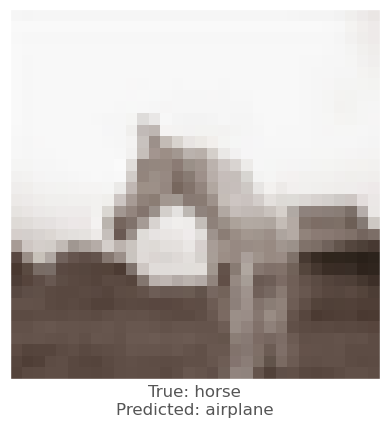

In [35]:
model = resnet
# class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
# gradient_descent_momentum(image_id, model, sensitive_x, sensitive_y)
start = time.time()
distance_list = []
for i in range(1):
    L_distance = gradient_descent_momentum_parallel_beam_search(image_id, model, sensitive_list[29][0], sensitive_list[29][1])
    # distance_list.append(L_distance)
end = time.time()

In [35]:
print(f"{end - start:.6f} sec")
df = pd.DataFrame(distance_list, index = range(1, 31), columns = ['Distance', 'Predicted Class', 'Original Class'])
print(df.shape)
display(df)
df.to_csv('87_distance_ex_result.csv')
#display(pd.DataFrame(data = (npdistance), index = range(0, 30), columns = ['Distance    Predicted Class   Original Class']))
#my_df = pd.DataFrame(data=([1,'A',2],[1,2,3]), index=range(0,2), columns=('A',100,'C'))
#display(pd.DataFrame(my_df))
#print()

160.433201 sec
(30, 3)


,Distance,Predicted Class,Original Class
1,18.0,0.526561,0.458673
2,52.0,0.499267,0.496644
3,64.0,0.498778,0.497843
4,NaN,NaN,NaN
5,30.0,0.491809,0.491809
6,25.0,0.505742,0.487173
7,NaN,NaN,NaN
8,34.0,0.669915,0.316695
9,22.0,0.523517,0.468171
10,NaN,NaN,NaN


#### Untargeted Attack

Let's look at one iteration of the untargeted attack. Here we will demonstrate a successful attack an image of a frog with the `resnet` model. We should see the confidence in the true class drop after several iterations.

Try to see if you can successfully attack other images/models. The more pixels we are allowed to modify, the more likely it is we are to find a solution for any given image.



Round  0
Confidence: 0.049143102


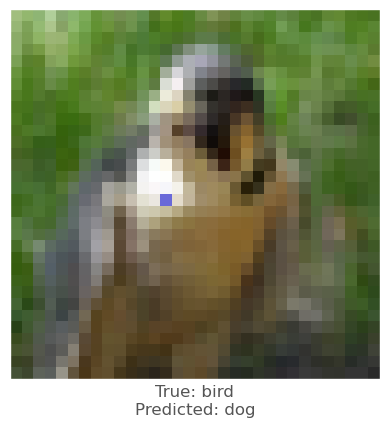

Success Lopt is 123.55702241383908
Confidence: 0.5784494
Confidence: 0.553354
Confidence: 0.553354
Confidence: 0.5404524
Confidence: 0.5404524
Confidence: 0.42025834


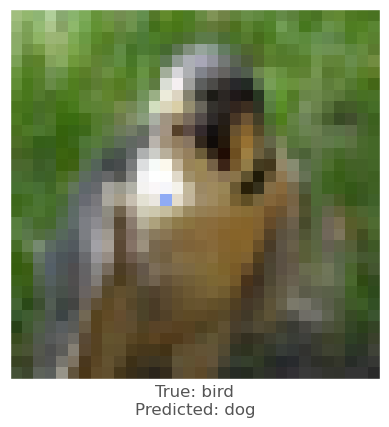

Success Lopt is 85.93899334060009
Confidence: 0.54676193
Confidence: 0.50440603
Confidence: 0.44814116


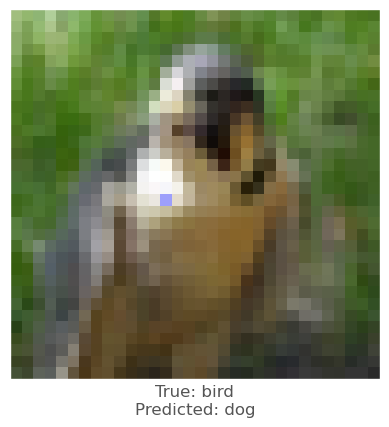

Success Lopt is 71.66061922762361
Confidence: 0.53803813
Confidence: 0.5366706
Confidence: 0.5269514
Confidence: 0.5269514
Confidence: 0.51572776
Confidence: 0.6047626
Confidence: 0.6047626
Confidence: 0.5208503
Confidence: 0.5036767
Confidence: 0.49433148


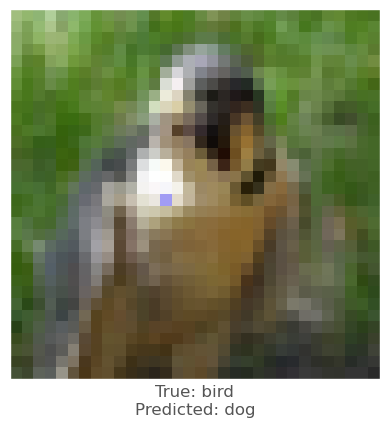

Success Lopt is 67.81619271106729
Final Lopt is 67.81619271106729


Round  1
Confidence: 0.00042562195


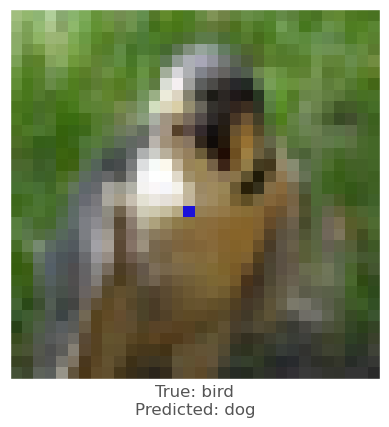

Success Lopt is 126.06376329780723
Confidence: 0.4446252


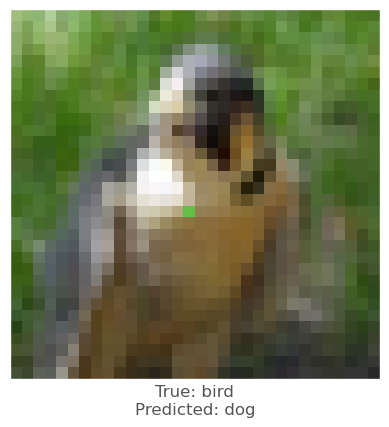

Success Lopt is 55.84396842359419
Confidence: 0.5945228
Confidence: 0.5851412
Confidence: 0.5733351
Confidence: 0.5574734
Confidence: 0.53792715
Confidence: 0.49556714


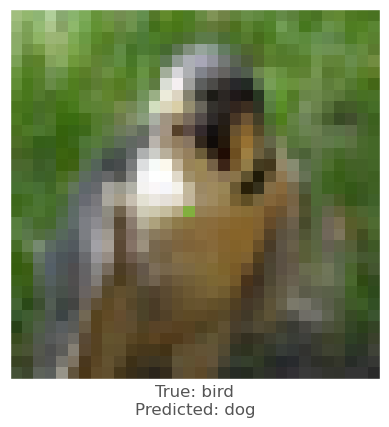

Success Lopt is 38.05729913682143
Confidence: 0.5274456
Confidence: 0.5223809
Confidence: 0.5115672
Confidence: 0.5113208
Confidence: 0.5113208
Confidence: 0.49908045


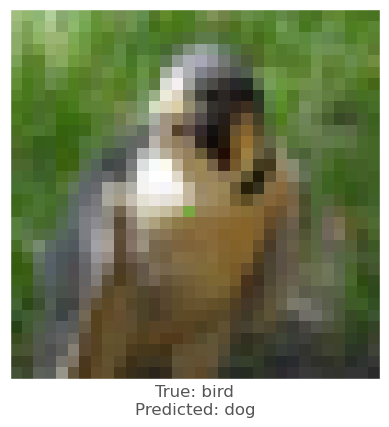

Success Lopt is 32.73197914727825
Final Lopt is 32.73197914727825


Round  2
Confidence: 0.026347125


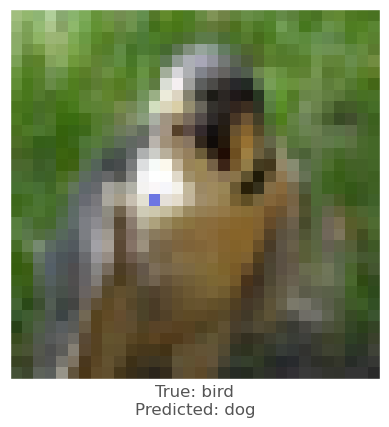

Success Lopt is 125.82406087522747
Confidence: 0.49169996


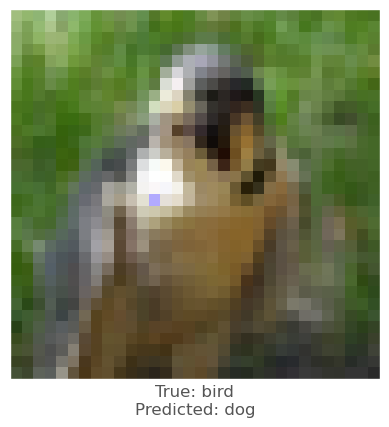

Success Lopt is 60.34152941576028
Confidence: 0.5831421
Confidence: 0.5831421
Confidence: 0.5831421
Confidence: 0.5831421
Confidence: 0.5831421
Confidence: 0.5846964
Confidence: 0.54124874
Confidence: 0.54124874
Confidence: 0.54124874
Confidence: 0.54124874
Confidence: 0.5720455
Confidence: 0.5435256
Confidence: 0.5435256
Confidence: 0.5250577
Confidence: 0.5250577
Confidence: 0.5694721
Confidence: 0.5304236
Confidence: 0.5185027
Confidence: 0.4973551


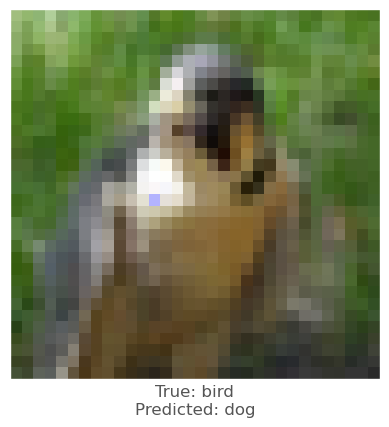

Success Lopt is 55.585789406199524
Confidence: 0.53224427
Confidence: 0.53224427
Confidence: 0.53224427
Confidence: 0.53224427
Confidence: 0.53224427
Confidence: 0.56595975
Confidence: 0.54506516
Confidence: 0.54506516
Confidence: 0.51942825
Confidence: 0.51942825
Final Lopt is 55.585789406199524


Round  3
Confidence: 0.08285866


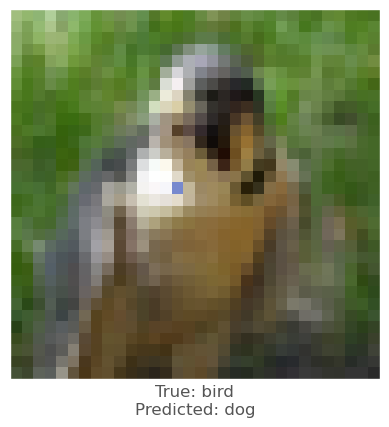

Success Lopt is 124.41342795887606
Confidence: 0.5402543
Confidence: 0.5402543
Confidence: 0.519814
Confidence: 0.5104779
Confidence: 0.50670743
Confidence: 0.369371


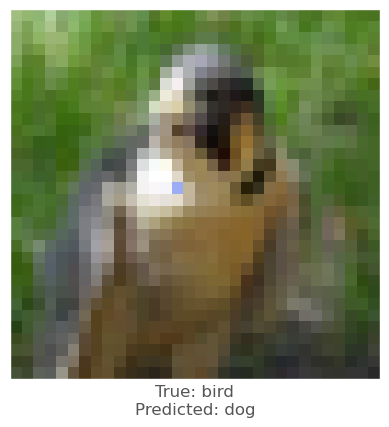

Success Lopt is 87.86899522206352
Confidence: 0.4802981


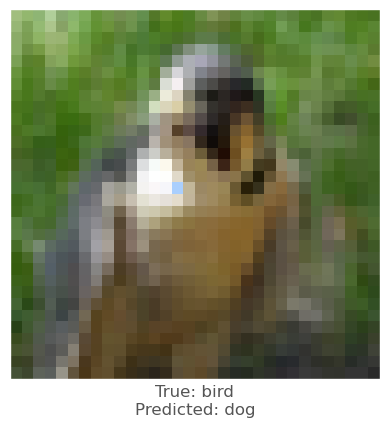

Success Lopt is 73.05503433743328
Confidence: 0.51543224
Confidence: 0.51021427
Confidence: 0.51021427
Confidence: 0.51021427
Confidence: 0.50323546
Confidence: 0.51479065
Confidence: 0.50756437
Confidence: 0.48871186


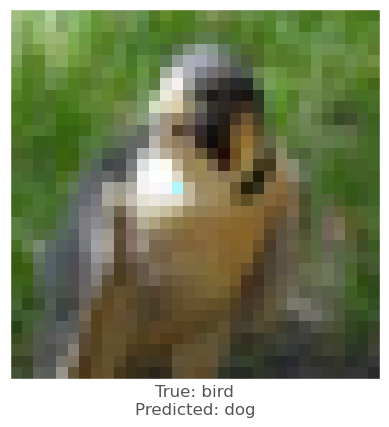

Success Lopt is 68.16031367271023
Final Lopt is 68.16031367271023


Round  4
Confidence: 0.018534504


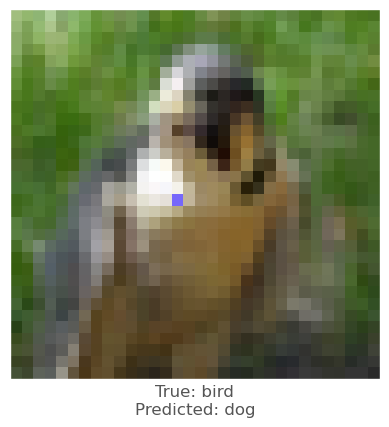

Success Lopt is 116.42352210277396
Confidence: 0.40378934


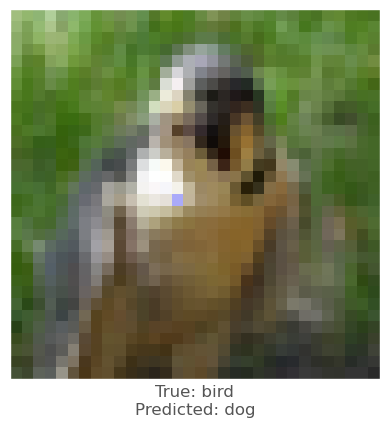

Success Lopt is 57.13490416514131
Confidence: 0.59793186
Confidence: 0.59793186
Confidence: 0.59328943
Confidence: 0.58954
Confidence: 0.58864945
Confidence: 0.55094975
Confidence: 0.53311443
Confidence: 0.5330829
Confidence: 0.5320176
Confidence: 0.5180233
Confidence: 0.47083405


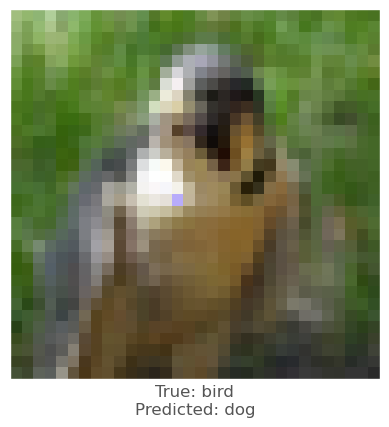

Success Lopt is 47.92311722818292
Confidence: 0.53520316
Confidence: 0.5184499
Confidence: 0.5140561
Confidence: 0.5140561
Confidence: 0.5140561
Confidence: 0.5200152
Confidence: 0.50261635
Confidence: 0.50261635
Confidence: 0.4975961


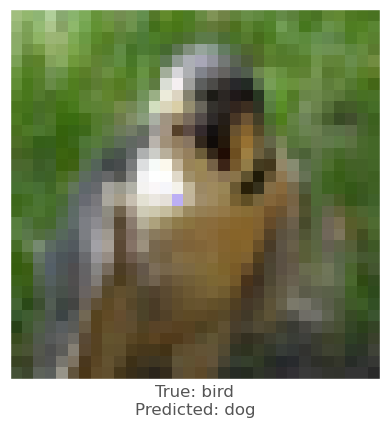

Success Lopt is 44.25684212867634
Final Lopt is 44.25684212867634


Round  5
Confidence: 0.005306377


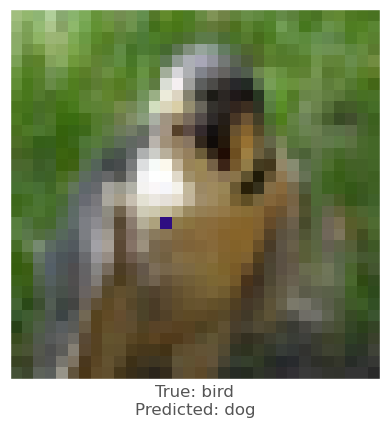

Success Lopt is 124.5028476831694
Confidence: 0.5490702
Confidence: 0.5490702
Confidence: 0.5490702
Confidence: 0.54681855
Confidence: 0.54067576
Confidence: 0.12942518


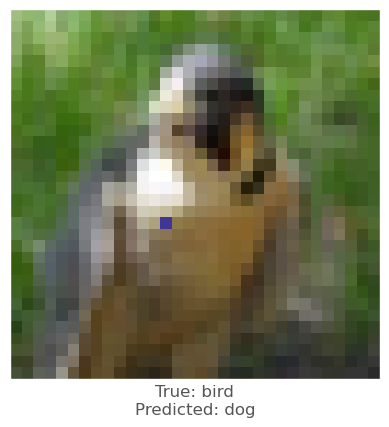

Success Lopt is 86.33798023852239
Confidence: 0.5506947
Confidence: 0.54695565
Confidence: 0.5388893
Confidence: 0.50607455
Confidence: 0.50101197
Confidence: 0.550982
Confidence: 0.5002387
Confidence: 0.5002387
Confidence: 0.46487325


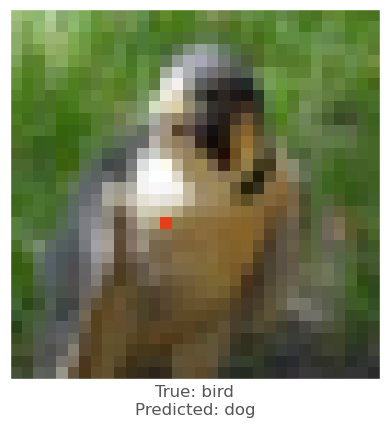

Success Lopt is 77.61954171193395
Confidence: 0.52439207
Confidence: 0.52439207
Confidence: 0.5228248
Confidence: 0.5228248
Confidence: 0.5110006
Confidence: 0.4958539


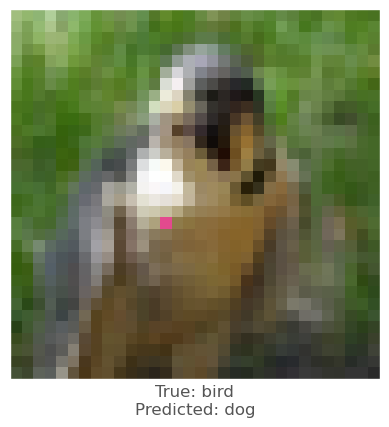

Success Lopt is 74.56586729026884
Final Lopt is 74.56586729026884


Round  6
Confidence: 0.0414868


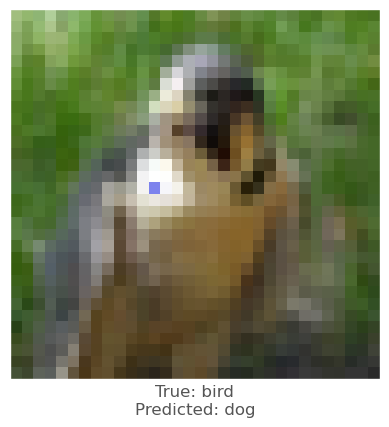

Success Lopt is 124.12997250387
Confidence: 0.64357454
Confidence: 0.5945252
Confidence: 0.588492
Confidence: 0.588492
Confidence: 0.5596114
Confidence: 0.31272283


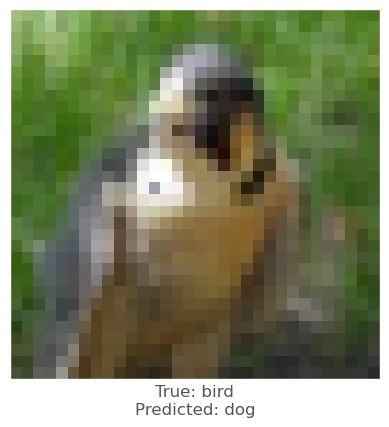

Success Lopt is 92.70749193715565
Confidence: 0.39526173


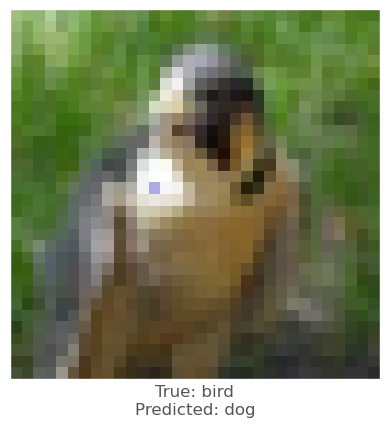

Success Lopt is 76.51909882474598
Confidence: 0.49931192
Confidence: 0.4595915


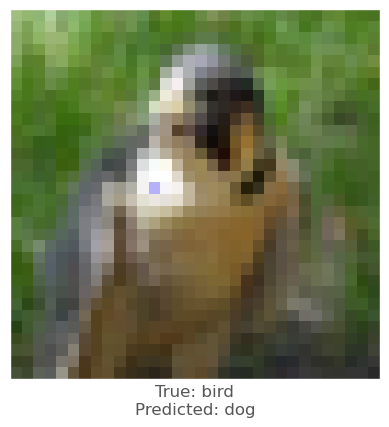

Success Lopt is 68.1742650418526
Confidence: 0.62733424
Confidence: 0.5911754
Confidence: 0.58977574
Confidence: 0.55620044
Confidence: 0.5202111
Confidence: 0.54181033
Confidence: 0.54181033
Confidence: 0.53190017
Confidence: 0.53190017
Confidence: 0.50658894
Confidence: 0.53890157
Confidence: 0.53890157
Confidence: 0.4932912


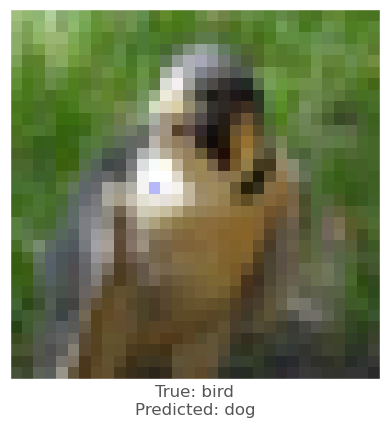

Success Lopt is 66.92516000654086
Final Lopt is 66.92516000654086


Round  7
Confidence: 0.006670809


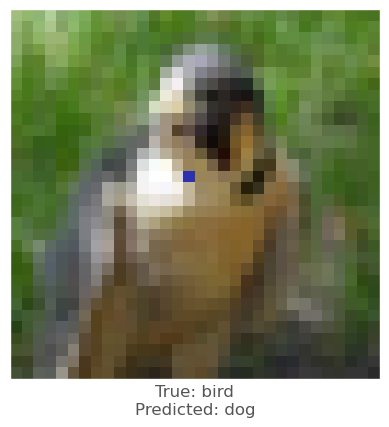

Success Lopt is 117.206647017317
Confidence: 0.31697774


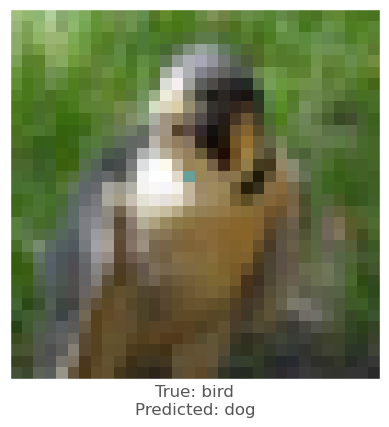

Success Lopt is 55.11670393993464
Confidence: 0.50720704
Confidence: 0.50720704
Confidence: 0.50720704
Confidence: 0.50720704
Confidence: 0.50720704
Confidence: 0.41664276


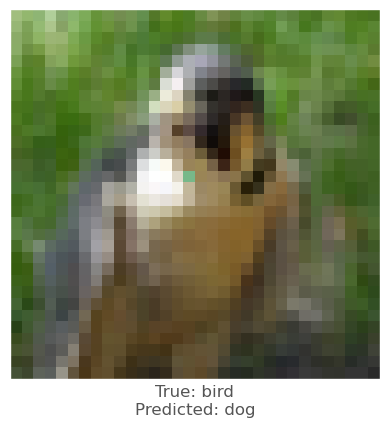

Success Lopt is 40.80215656974809
Confidence: 0.49363965


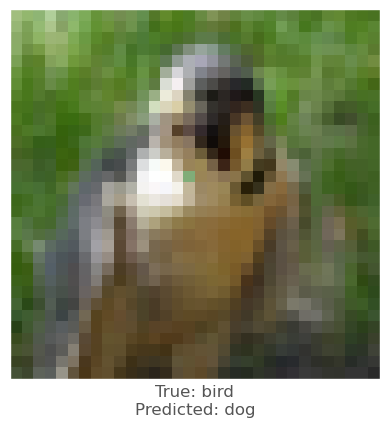

Success Lopt is 31.959690673737782
Confidence: 0.50799006
Confidence: 0.49798


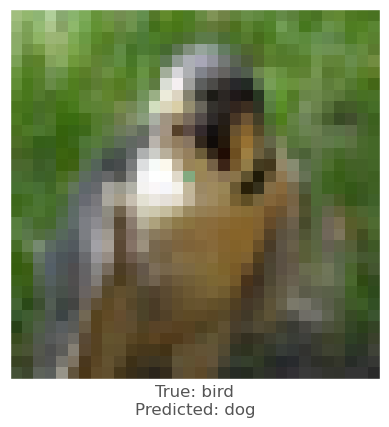

Success Lopt is 28.167537544773268
Final Lopt is 28.167537544773268


Round  8
Confidence: 0.003226696


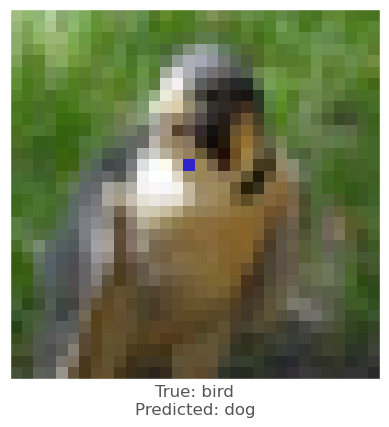

Success Lopt is 110.41925411626556
Confidence: 0.39068338


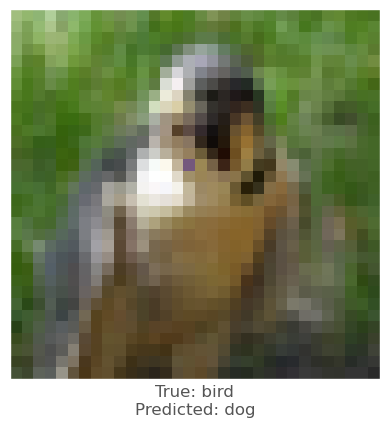

Success Lopt is 43.300022174355746
Confidence: 0.52808154
Confidence: 0.51758456
Confidence: 0.51261896
Confidence: 0.51261896
Confidence: 0.51261896
Confidence: 0.49228597


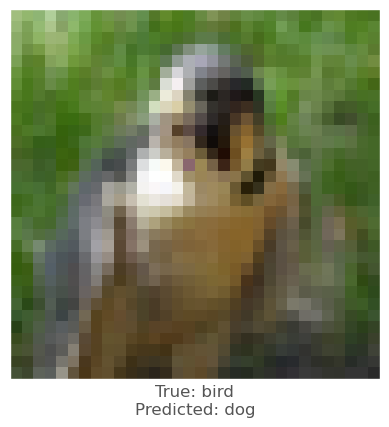

Success Lopt is 29.821053403621022
Confidence: 0.5129631
Confidence: 0.49452555


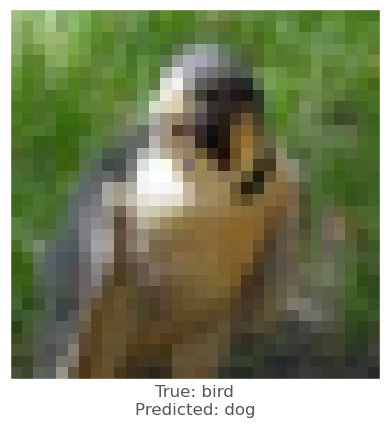

Success Lopt is 23.165483046020697
Confidence: 0.51824206
Confidence: 0.51824206
Confidence: 0.51285267
Confidence: 0.51083386
Confidence: 0.51083386
Final Lopt is 23.165483046020697


Round  9
Confidence: 0.059304282


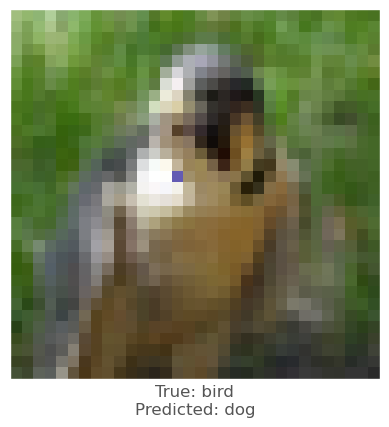

Success Lopt is 125.18142468213864
Confidence: 0.4186124


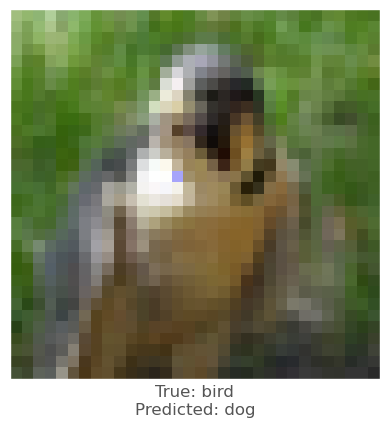

Success Lopt is 57.64371598791868
Confidence: 0.5477351
Confidence: 0.5477351
Confidence: 0.5477351
Confidence: 0.5477351
Confidence: 0.5477351
Confidence: 0.5218016
Confidence: 0.5218016
Confidence: 0.5116058
Confidence: 0.5116058
Confidence: 0.50848305
Confidence: 0.460095


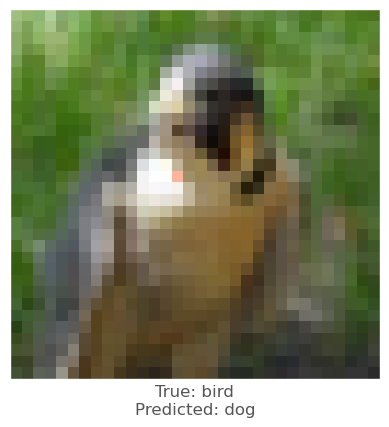

Success Lopt is 44.37561854743697
Confidence: 0.5119252
Confidence: 0.5119252
Confidence: 0.5119252
Confidence: 0.5119252
Confidence: 0.5119252
Final Lopt is 44.37561854743697


Round  10
Confidence: 0.106573656


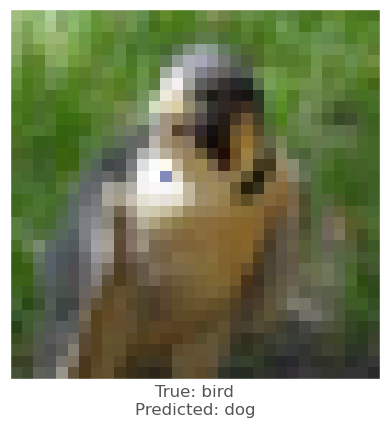

Success Lopt is 123.43953562413682
Confidence: 0.7266538
Confidence: 0.68978363
Confidence: 0.68978363
Confidence: 0.68978363
Confidence: 0.68978363
Confidence: 0.35264724


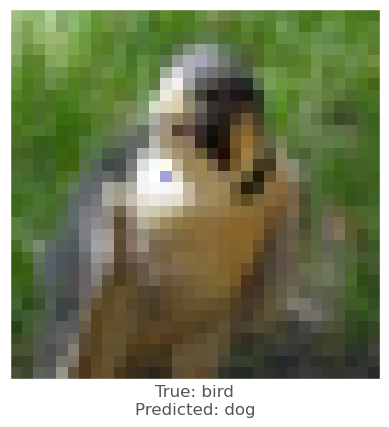

Success Lopt is 90.21241348703933
Confidence: 0.56874514
Confidence: 0.56874514
Confidence: 0.56874514
Confidence: 0.5659974
Confidence: 0.556987
Confidence: 0.54436636
Confidence: 0.54436636
Confidence: 0.48372406


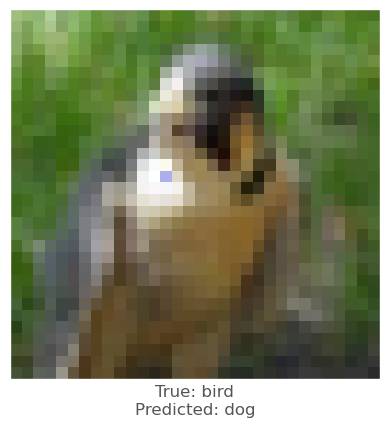

Success Lopt is 79.53706426154463
Confidence: 0.6391381
Confidence: 0.57531494
Confidence: 0.57531494
Confidence: 0.55117905
Confidence: 0.53451085
Confidence: 0.53953767
Confidence: 0.53953767
Confidence: 0.53953767
Confidence: 0.52429783
Confidence: 0.52429783
Final Lopt is 79.53706426154463


Round  11
Confidence: 0.012380314


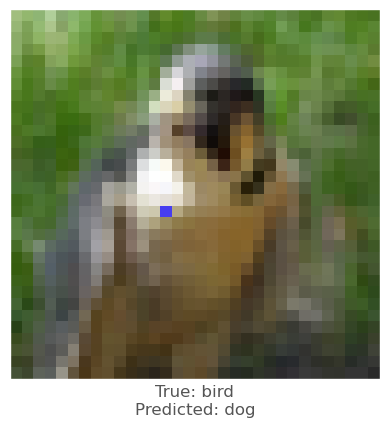

Success Lopt is 127.01821358984931
Confidence: 0.41800883


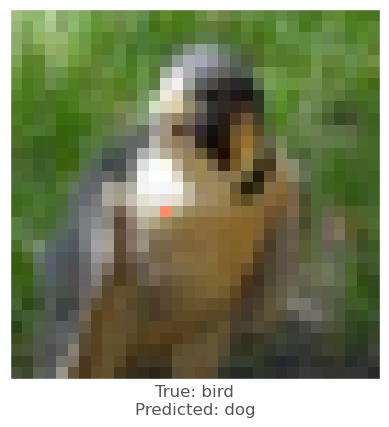

Success Lopt is 57.39673169477146
Confidence: 0.6037216
Confidence: 0.5982534
Confidence: 0.59227777
Confidence: 0.59227777
Confidence: 0.59227777
Confidence: 0.58974534
Confidence: 0.576688
Confidence: 0.576688
Confidence: 0.576688
Confidence: 0.5594226
Confidence: 0.5654488
Confidence: 0.50096005
Confidence: 0.4827812


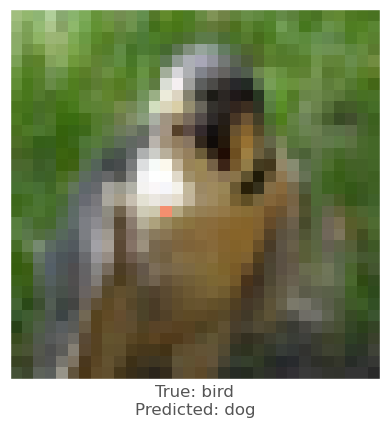

Success Lopt is 47.3763323186225
Confidence: 0.57951194
Confidence: 0.5649921
Confidence: 0.5649921
Confidence: 0.5649921
Confidence: 0.5484006
Confidence: 0.6046518
Confidence: 0.5498044
Confidence: 0.5498044
Confidence: 0.54132086
Confidence: 0.53497046
Confidence: 0.5676271
Confidence: 0.5363784
Confidence: 0.505584
Confidence: 0.50297487
Confidence: 0.50297487
Final Lopt is 47.3763323186225


Round  12
Confidence: 0.015110537


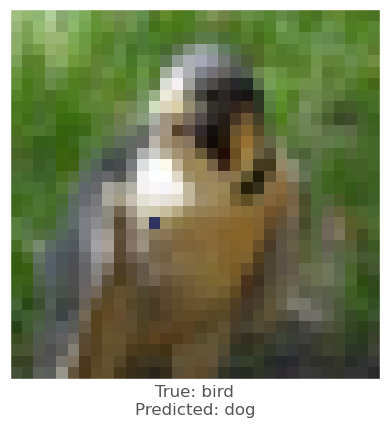

Success Lopt is 124.37637126205341
Confidence: 0.6254317
Confidence: 0.62150323
Confidence: 0.62150323
Confidence: 0.62119794
Confidence: 0.6107277
Confidence: 0.48864472


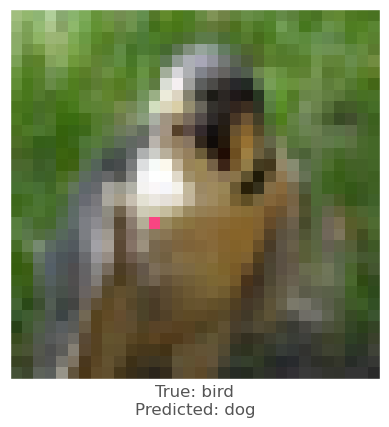

Success Lopt is 92.10225747488761
Confidence: 0.59177375
Confidence: 0.562529
Confidence: 0.5458474
Confidence: 0.5458474
Confidence: 0.5278746
Confidence: 0.5220477
Confidence: 0.5220477
Confidence: 0.5101987
Confidence: 0.5101987
Confidence: 0.45902288


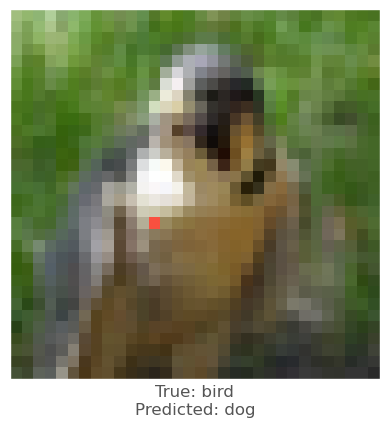

Success Lopt is 81.14378787490986
Confidence: 0.6119692
Confidence: 0.5824995
Confidence: 0.57870585
Confidence: 0.55379885
Confidence: 0.4950244


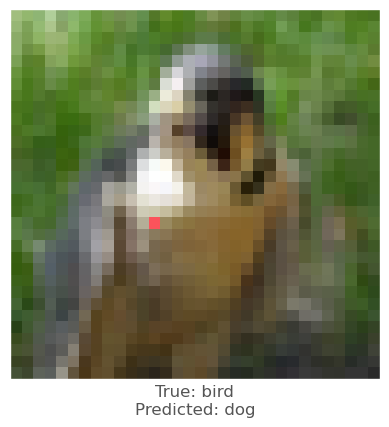

Success Lopt is 78.31881144625221
Final Lopt is 78.31881144625221


Round  13
Confidence: 0.33125433


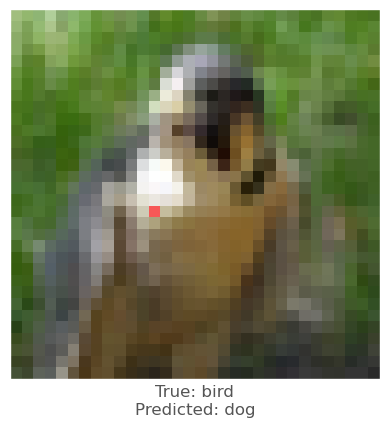

Success Lopt is 111.39961829476697
Confidence: 0.60292065
Confidence: 0.5948539
Confidence: 0.5948539
Confidence: 0.58803153
Confidence: 0.58803153
Confidence: 0.59383315
Confidence: 0.5353576
Confidence: 0.5353576
Confidence: 0.5353576
Confidence: 0.5353576
Confidence: 0.55288994
Confidence: 0.5101794
Confidence: 0.5101794
Confidence: 0.5101794
Confidence: 0.4990744


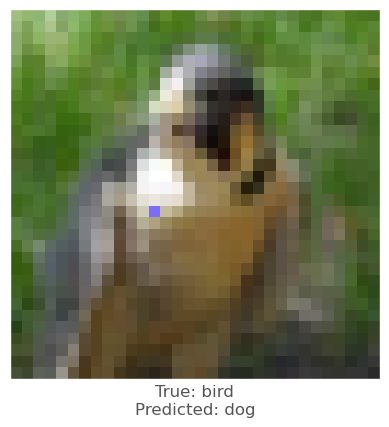

Success Lopt is 91.0231181871024
Confidence: 0.6111403
Confidence: 0.59734875
Confidence: 0.5796993
Confidence: 0.5734453
Confidence: 0.5734453
Confidence: 0.5747321
Confidence: 0.5747321
Confidence: 0.5164748
Confidence: 0.5164748
Confidence: 0.5164748
Confidence: 0.6056935
Confidence: 0.51904386
Confidence: 0.51904386
Confidence: 0.51904386
Confidence: 0.507563
Final Lopt is 91.0231181871024


Round  14
Confidence: 0.026306335


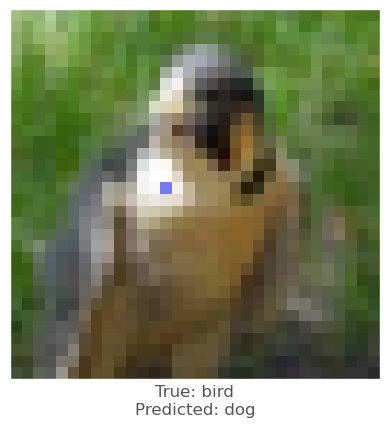

Success Lopt is 127.39691390132903
Confidence: 0.33309555


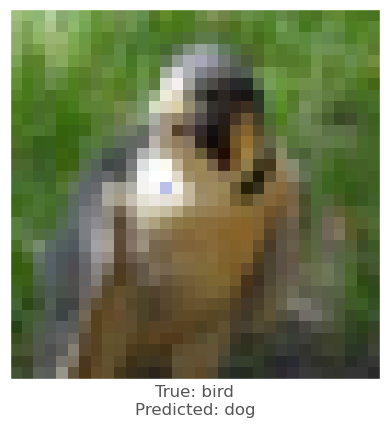

Success Lopt is 60.52250136066556
Confidence: 0.62561107
Confidence: 0.6230818
Confidence: 0.6230818
Confidence: 0.61610717
Confidence: 0.61610717
Confidence: 0.50689787
Confidence: 0.50250924
Confidence: 0.48903778


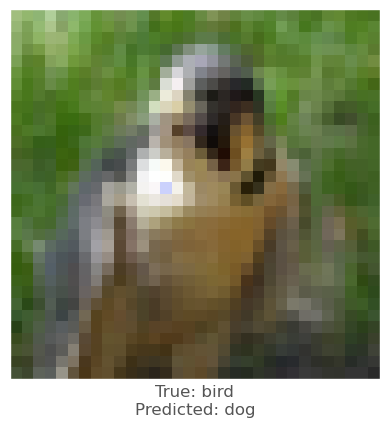

Success Lopt is 42.967746897788004
Confidence: 0.5606013
Confidence: 0.5606013
Confidence: 0.55307007
Confidence: 0.55307007
Confidence: 0.54342884
Confidence: 0.54493815
Confidence: 0.53899366
Confidence: 0.5334917
Confidence: 0.5334917
Confidence: 0.52249235
Confidence: 0.53096557
Confidence: 0.5169017
Confidence: 0.5169017
Confidence: 0.50911015
Confidence: 0.50911015
Confidence: 0.5096521
Confidence: 0.5096521
Confidence: 0.5016466
Confidence: 0.5016466
Confidence: 0.5016466
Final Lopt is 42.967746897788004


Round  15
Confidence: 0.14511858


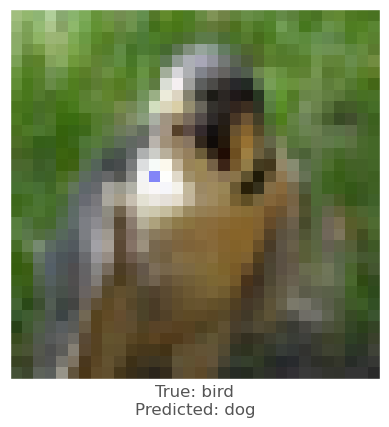

Success Lopt is 122.24207939781832
Confidence: 0.6455612
Confidence: 0.6455612
Confidence: 0.6455612
Confidence: 0.6455612
Confidence: 0.6455612
Confidence: 0.43719974


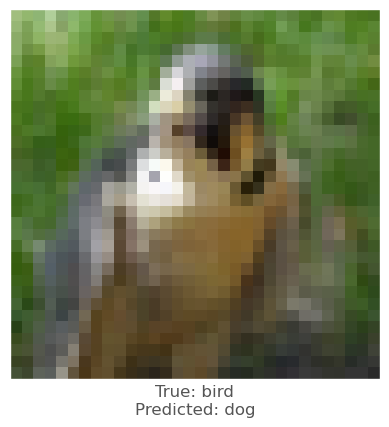

Success Lopt is 90.47633321238018
Confidence: 0.58553743
Confidence: 0.578443
Confidence: 0.578443
Confidence: 0.57801706
Confidence: 0.5718275
Confidence: 0.5540042
Confidence: 0.5540042
Confidence: 0.5311728
Confidence: 0.5148996
Confidence: 0.5081658
Confidence: 0.47552997


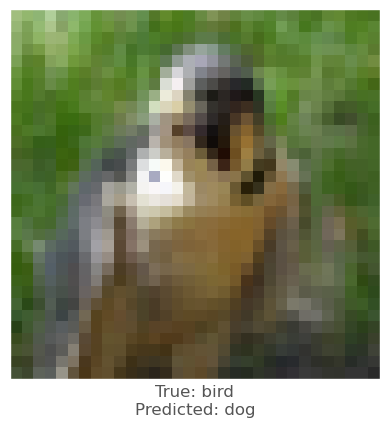

Success Lopt is 85.56182319317904
Confidence: 0.5130673
Confidence: 0.5130673
Confidence: 0.5130673
Confidence: 0.5130673
Confidence: 0.5130673
Confidence: 0.5427994
Confidence: 0.5290818
Confidence: 0.5271885
Confidence: 0.49420542


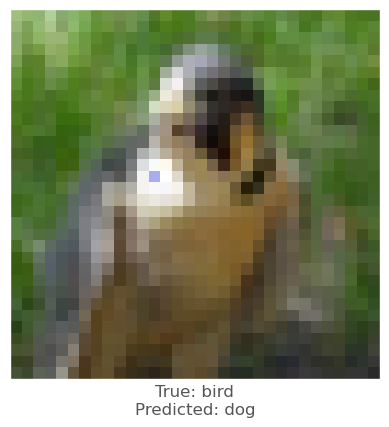

Success Lopt is 83.68985958022321
Final Lopt is 83.68985958022321


Round  16
Confidence: 0.011230632


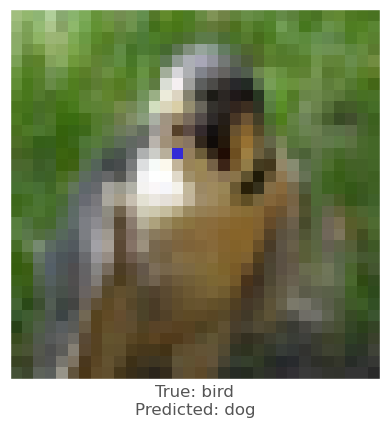

Success Lopt is 110.75110024241785
Confidence: 0.22970445


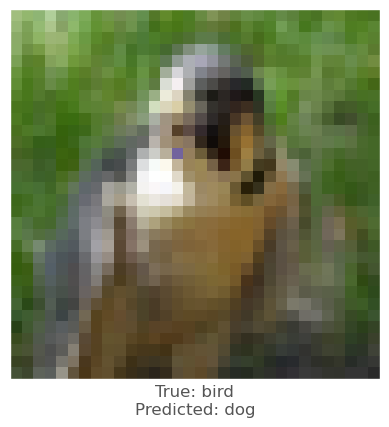

Success Lopt is 48.135548699339225
Confidence: 0.44305474


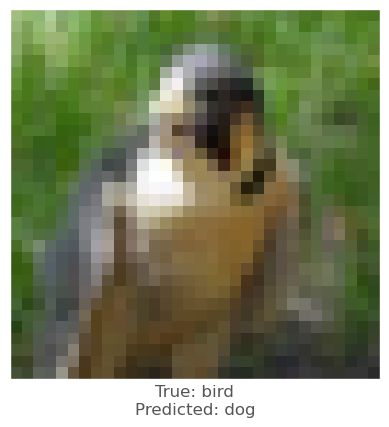

Success Lopt is 22.509051174538982
Confidence: 0.5935484
Confidence: 0.5935484
Confidence: 0.5912338
Confidence: 0.5912338
Confidence: 0.5912338
Confidence: 0.536525
Confidence: 0.536525
Confidence: 0.536525
Confidence: 0.536525
Confidence: 0.5315779
Confidence: 0.5178898
Confidence: 0.50470966
Confidence: 0.49099597


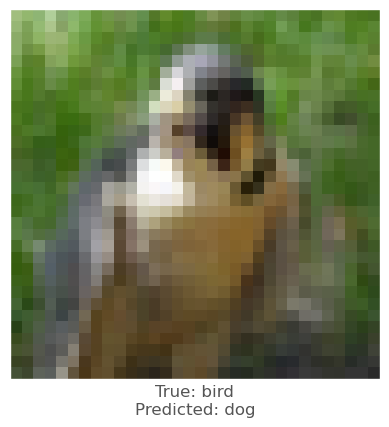

Success Lopt is 18.01440568491438
Confidence: 0.5221164
Confidence: 0.5221164
Confidence: 0.5115695
Confidence: 0.5115695
Confidence: 0.5115695
Final Lopt is 18.01440568491438


Round  17
Confidence: 0.011074257


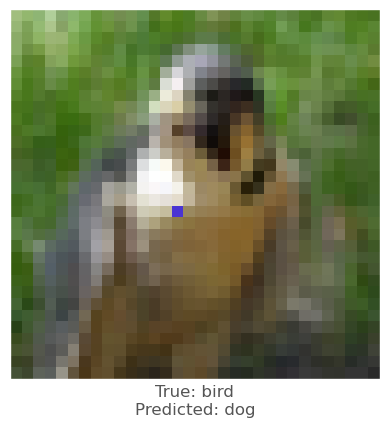

Success Lopt is 115.68782851882442
Confidence: 0.47101045


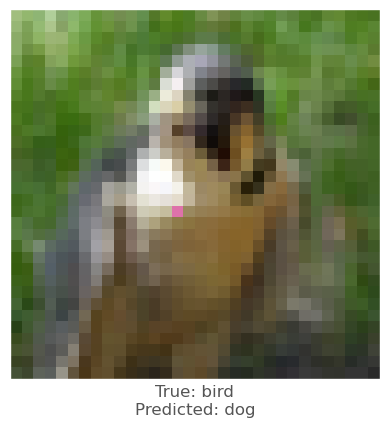

Success Lopt is 53.04208924116875
Confidence: 0.5772239
Confidence: 0.572143
Confidence: 0.56793743
Confidence: 0.56793743
Confidence: 0.56793743
Confidence: 0.5320883
Confidence: 0.52673733
Confidence: 0.52673733
Confidence: 0.52673733
Confidence: 0.5258901
Confidence: 0.5074484
Confidence: 0.4993866


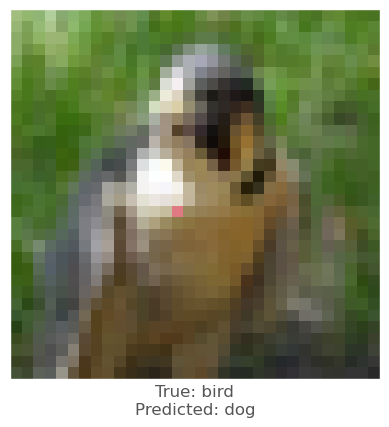

Success Lopt is 45.24030575639074
Confidence: 0.5364896
Confidence: 0.51948816
Confidence: 0.5120668
Confidence: 0.5120668
Confidence: 0.51187444
Confidence: 0.51914775
Confidence: 0.5184238
Confidence: 0.5184238
Confidence: 0.51425886
Confidence: 0.50774974
Confidence: 0.525716
Confidence: 0.5214267
Confidence: 0.5214267
Confidence: 0.51444083
Confidence: 0.5062971
Final Lopt is 45.24030575639074


Round  18
Confidence: 0.04660737


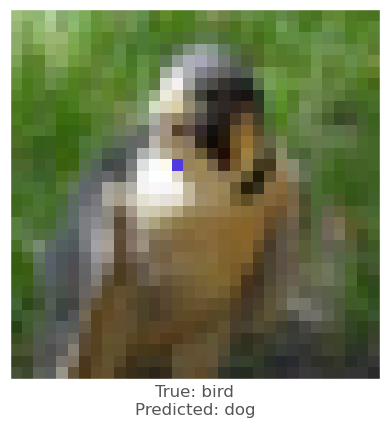

Success Lopt is 122.58001032801567
Confidence: 0.47336996


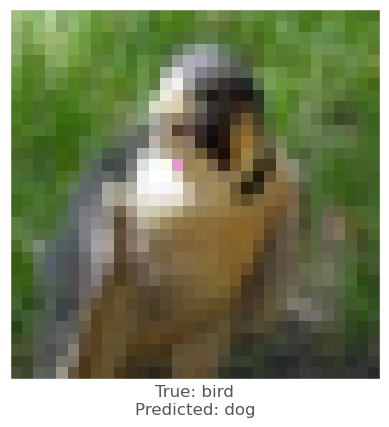

Success Lopt is 51.68229849801065
Confidence: 0.5230136
Confidence: 0.5098362
Confidence: 0.5098362
Confidence: 0.5098362
Confidence: 0.5089133
Confidence: 0.49766585


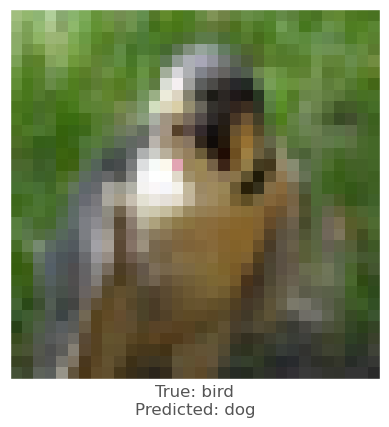

Success Lopt is 32.49587646683693
Confidence: 0.51525813
Confidence: 0.51456666
Confidence: 0.50748545
Confidence: 0.5047706
Confidence: 0.50027984
Confidence: 0.5246052
Confidence: 0.5229478
Confidence: 0.50651914
Confidence: 0.49649268


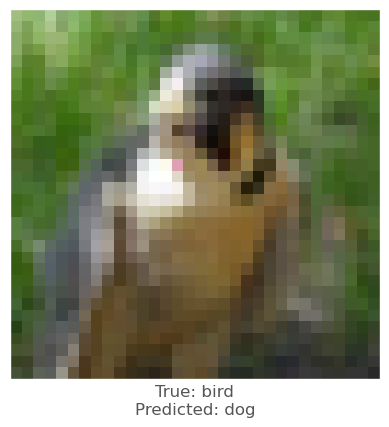

Success Lopt is 29.14178294234665
Final Lopt is 29.14178294234665


Round  19
Confidence: 0.013011257


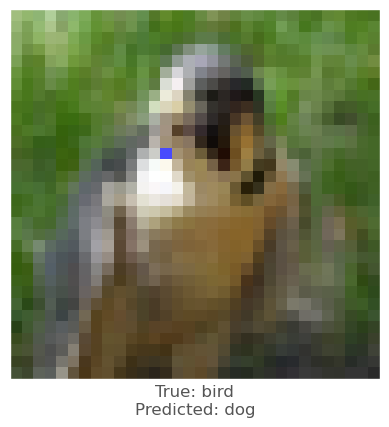

Success Lopt is 111.93433512636848
Confidence: 0.38282108


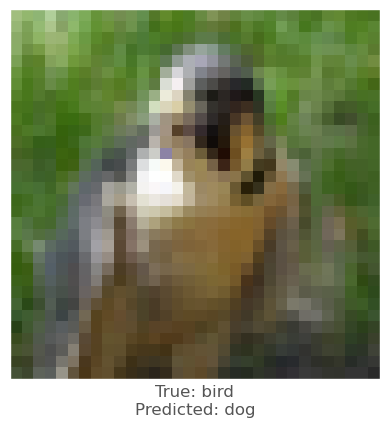

Success Lopt is 43.531193279883865
Confidence: 0.61238617
Confidence: 0.6033631
Confidence: 0.6033631
Confidence: 0.5987122
Confidence: 0.5987122
Confidence: 0.5771598
Confidence: 0.5497812
Confidence: 0.5497812
Confidence: 0.5497812
Confidence: 0.5497812
Confidence: 0.548464
Confidence: 0.548464
Confidence: 0.54772174
Confidence: 0.50361687
Confidence: 0.4821439


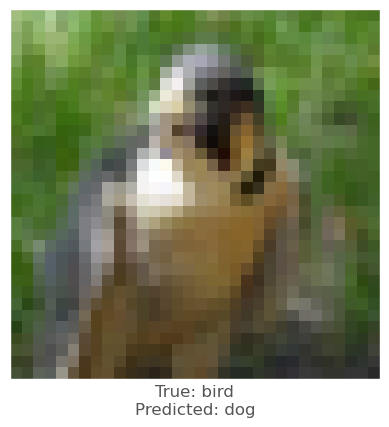

Success Lopt is 36.92195421329163
Confidence: 0.54509455
Confidence: 0.53828
Confidence: 0.5204627
Confidence: 0.51808625
Confidence: 0.51206607
Confidence: 0.5543493
Confidence: 0.52045125
Confidence: 0.52045125
Confidence: 0.5152422
Confidence: 0.5152422
Final Lopt is 36.92195421329163


Round  20
Confidence: 0.030478336


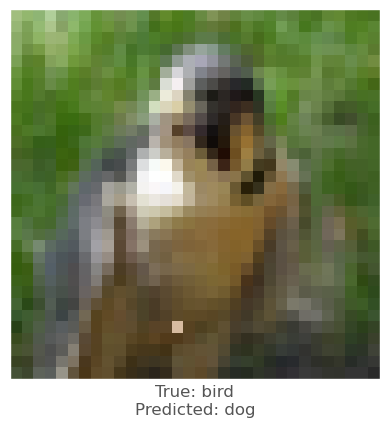

Success Lopt is 127.65125817230057
Confidence: 0.11033316


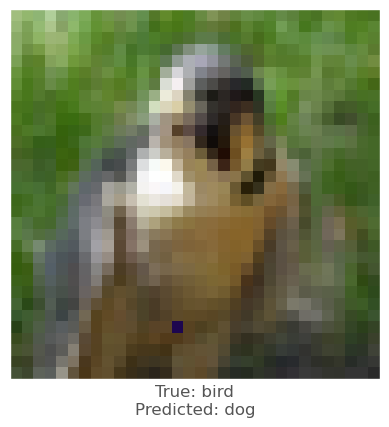

Success Lopt is 58.84731237148918
Confidence: 0.4504832


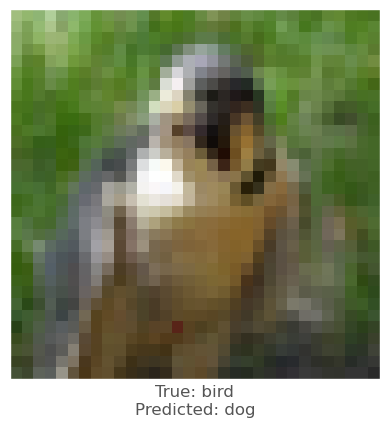

Success Lopt is 28.283519560342754
Confidence: 0.56915194
Confidence: 0.56915194
Confidence: 0.5539219
Confidence: 0.5490959
Confidence: 0.5490959
Confidence: 0.5090108
Confidence: 0.5087455
Confidence: 0.50237983
Confidence: 0.50237983
Confidence: 0.50237983
Confidence: 0.49095222


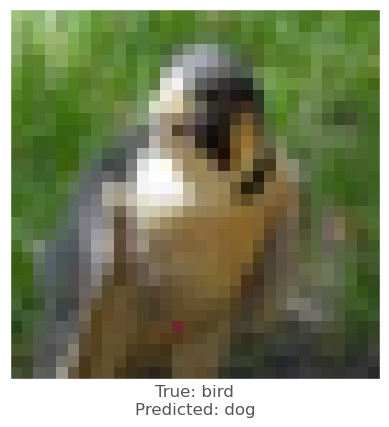

Success Lopt is 23.63860707775956
Confidence: 0.5120641
Confidence: 0.5003866
Confidence: 0.5003866
Confidence: 0.5003866
Confidence: 0.4988567


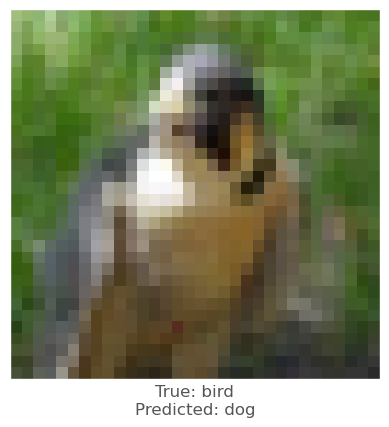

Success Lopt is 21.403529646776832
Final Lopt is 21.403529646776832


Round  21
Confidence: 0.06380129


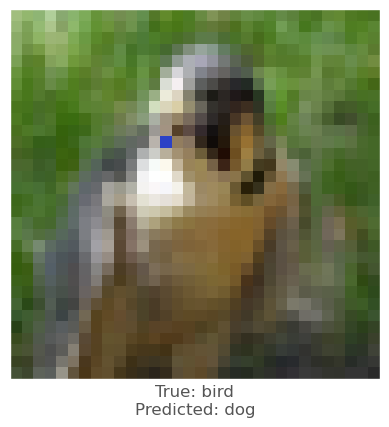

Success Lopt is 116.36733160551019
Confidence: 0.39837557


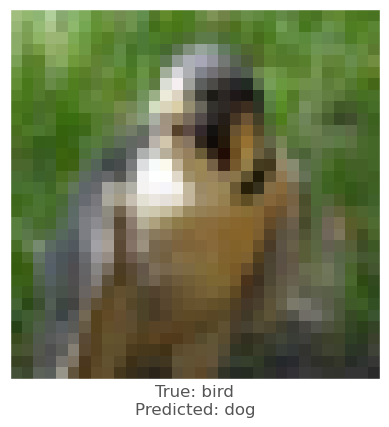

Success Lopt is 54.185285062130305
Confidence: 0.5551045
Confidence: 0.54915744
Confidence: 0.545277
Confidence: 0.545277
Confidence: 0.5316937
Confidence: 0.48781645


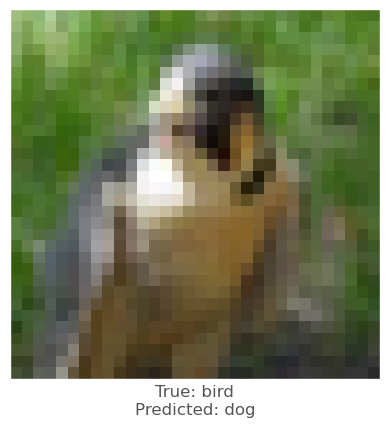

Success Lopt is 39.20415536589431
Confidence: 0.5272531
Confidence: 0.5272531
Confidence: 0.5190518
Confidence: 0.5190518
Confidence: 0.5061633
Confidence: 0.5015935
Confidence: 0.5015935
Confidence: 0.49388862


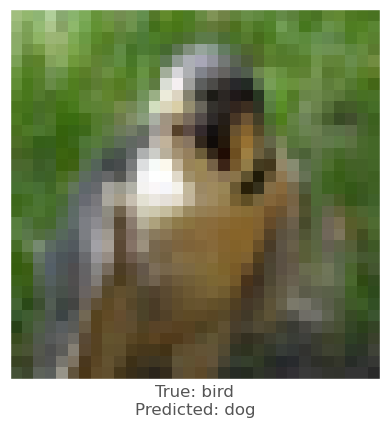

Success Lopt is 34.650999993861944
Final Lopt is 34.650999993861944


Round  22
Confidence: 0.18353054


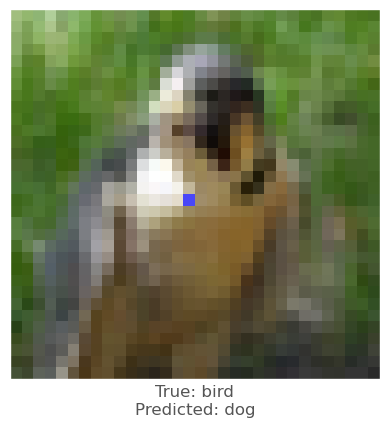

Success Lopt is 120.29280875076097
Confidence: 0.48969737


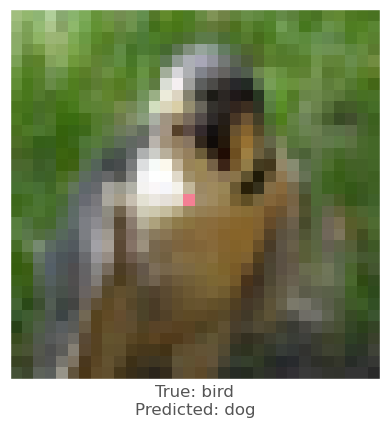

Success Lopt is 52.375419491858224
Confidence: 0.5844
Confidence: 0.56569064
Confidence: 0.55342436
Confidence: 0.55342436
Confidence: 0.5527391
Confidence: 0.518348
Confidence: 0.518348
Confidence: 0.518348
Confidence: 0.5090574
Confidence: 0.5070564
Confidence: 0.49989578
Confidence: 0.49989578
Confidence: 0.49512494


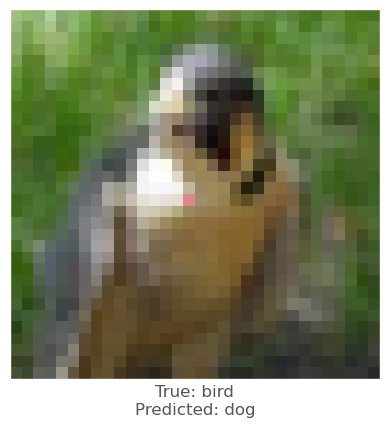

Success Lopt is 44.11214584123172
Confidence: 0.5148315
Confidence: 0.5133568
Confidence: 0.51186556
Confidence: 0.507852
Confidence: 0.50649184
Confidence: 0.52360326
Confidence: 0.50676894
Confidence: 0.50676894
Confidence: 0.50676894
Confidence: 0.5023833
Confidence: 0.5064588
Confidence: 0.5064588
Confidence: 0.4999563
Confidence: 0.4999563
Confidence: 0.49779493


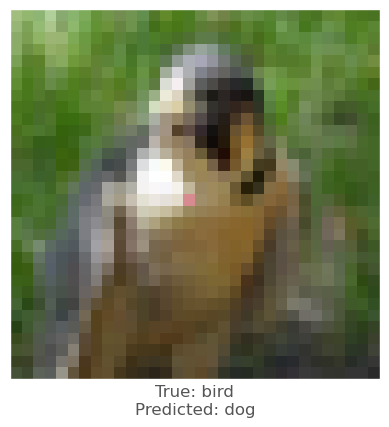

Success Lopt is 41.96643514223294
Final Lopt is 41.96643514223294


Round  23
Confidence: 0.028863683


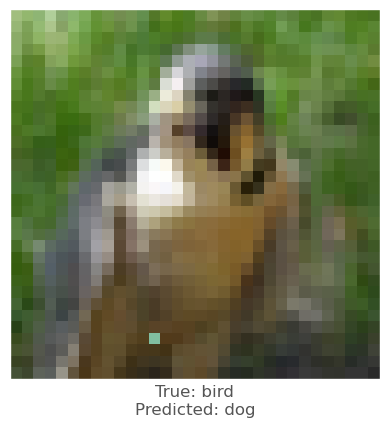

Success Lopt is 127.44385175050851
Confidence: 0.12496213


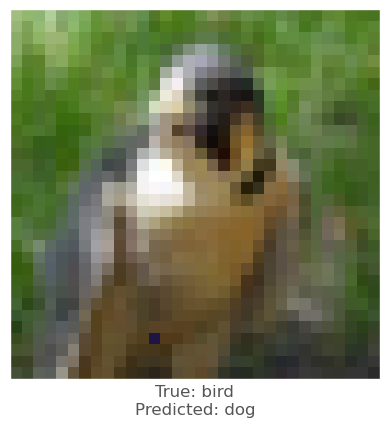

Success Lopt is 60.34126180244668
Confidence: 0.37405813


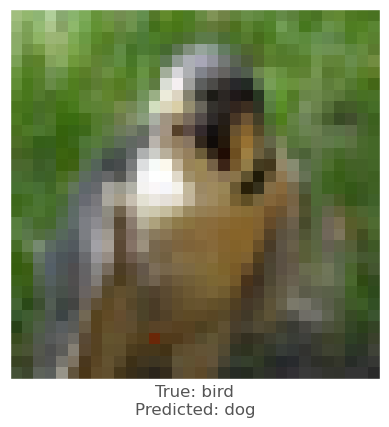

Success Lopt is 27.987718842605837
Confidence: 0.5029262
Confidence: 0.4877342


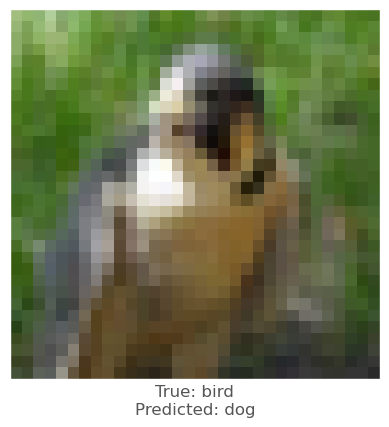

Success Lopt is 12.959380620478399
Confidence: 0.61035055
Confidence: 0.5950681
Confidence: 0.5876919
Confidence: 0.58100367
Confidence: 0.58100367
Confidence: 0.5680135
Confidence: 0.55921376
Confidence: 0.5414565
Confidence: 0.5357558
Confidence: 0.5314483
Confidence: 0.5206883
Confidence: 0.5206883
Confidence: 0.51936966
Confidence: 0.5164578
Confidence: 0.5164578
Confidence: 0.5270015
Confidence: 0.5102664
Confidence: 0.5080045
Confidence: 0.50736886
Confidence: 0.50651354
Final Lopt is 12.959380620478399


Round  24
Confidence: 0.059005704


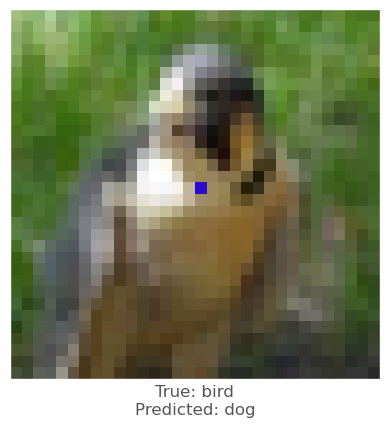

Success Lopt is 122.42959416857454
Confidence: 0.46615922


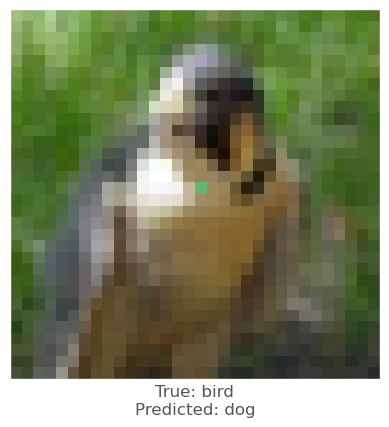

Success Lopt is 54.49974606208025
Confidence: 0.52673507
Confidence: 0.52673507
Confidence: 0.52673507
Confidence: 0.51860386
Confidence: 0.51860386
Confidence: 0.5229876
Confidence: 0.49156213


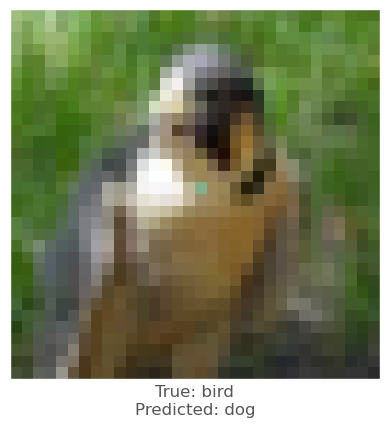

Success Lopt is 39.72496795530611
Confidence: 0.5240159
Confidence: 0.5240159
Confidence: 0.51800793
Confidence: 0.5134947
Confidence: 0.5093073
Confidence: 0.50867957
Confidence: 0.50867957
Confidence: 0.5068375
Confidence: 0.5038848
Confidence: 0.5038848
Confidence: 0.49769038


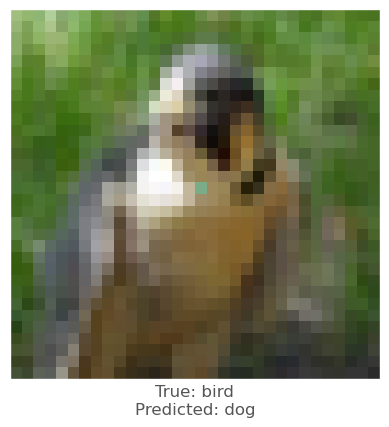

Success Lopt is 36.49336380169862
Final Lopt is 36.49336380169862


Round  25
Confidence: 0.043331664


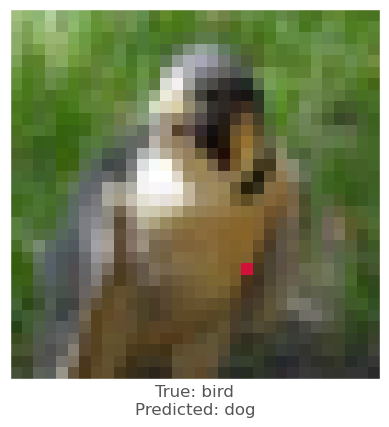

Success Lopt is 106.495895140372
Confidence: 0.24623375


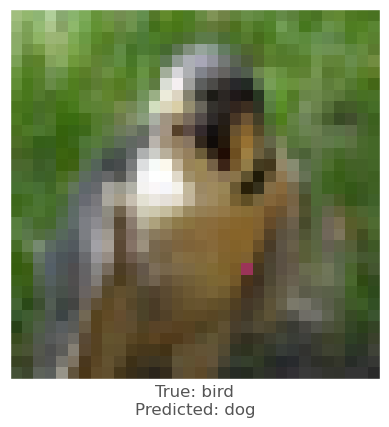

Success Lopt is 52.71033076846359
Confidence: 0.5505042
Confidence: 0.5479596
Confidence: 0.54578924
Confidence: 0.54578924
Confidence: 0.53870434
Confidence: 0.42775643


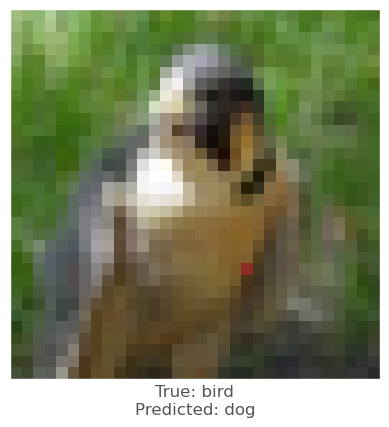

Success Lopt is 36.131355571315595
Confidence: 0.52053595
Confidence: 0.49786437


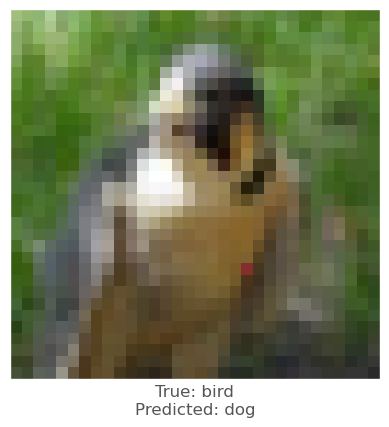

Success Lopt is 29.8374668465585
Confidence: 0.53791934
Confidence: 0.53791934
Confidence: 0.53050625
Confidence: 0.53050625
Confidence: 0.52696127
Confidence: 0.5374871
Confidence: 0.5374871
Confidence: 0.5374871
Confidence: 0.5374871
Confidence: 0.52290356
Final Lopt is 29.8374668465585


Round  26
Confidence: 0.05495669


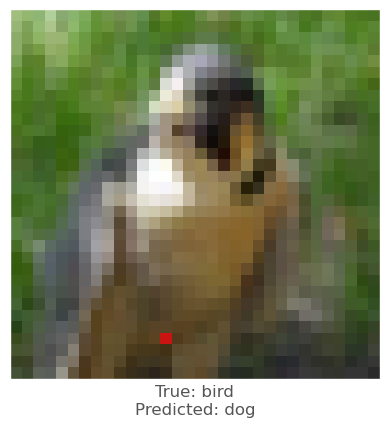

Success Lopt is 119.85980219914788
Confidence: 0.14070657


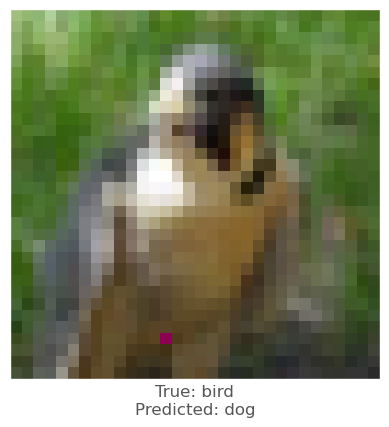

Success Lopt is 58.80215545842131
Confidence: 0.37745133


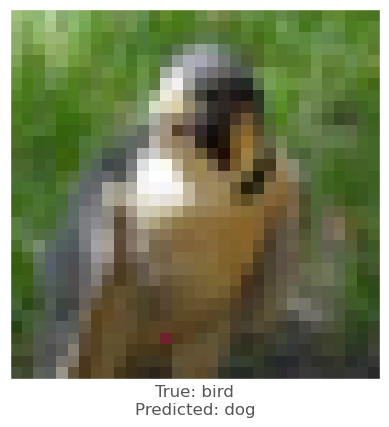

Success Lopt is 27.055894523630826
Confidence: 0.53065974
Confidence: 0.52820086
Confidence: 0.5231643
Confidence: 0.51707006
Confidence: 0.51695037
Confidence: 0.45176938


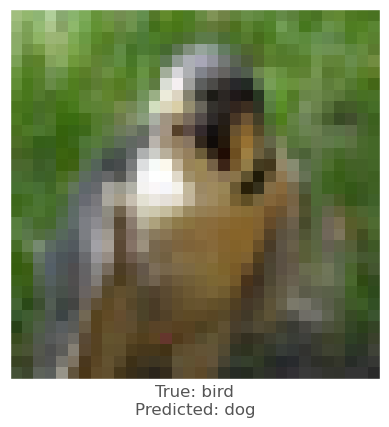

Success Lopt is 19.857096382188473
Confidence: 0.50543875
Confidence: 0.49548158


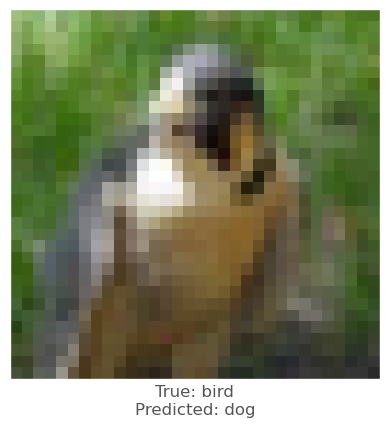

Success Lopt is 15.28639291069672
Confidence: 0.513005
Confidence: 0.50794804
Confidence: 0.50794804
Confidence: 0.50794804
Confidence: 0.5077652
Final Lopt is 15.28639291069672


Round  27
Confidence: 0.08653193


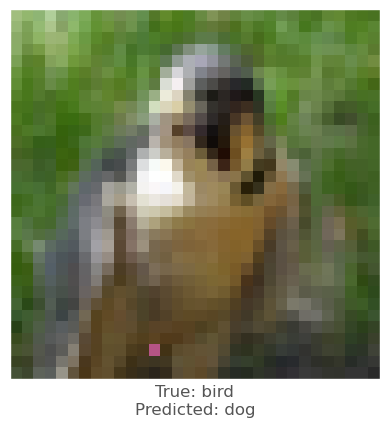

Success Lopt is 111.53062322125317
Confidence: 0.20957883


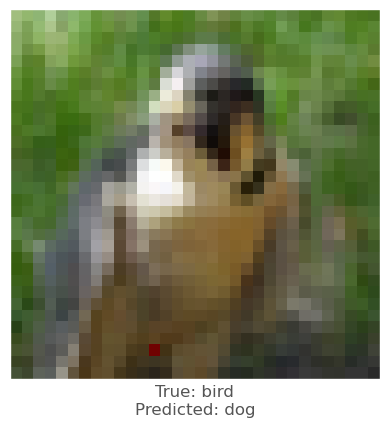

Success Lopt is 52.717314601129736
Confidence: 0.5118047
Confidence: 0.50954306
Confidence: 0.50918853
Confidence: 0.50918853
Confidence: 0.48523924


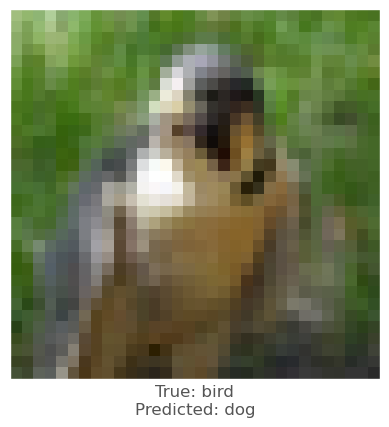

Success Lopt is 25.06040613743162
Confidence: 0.60133946
Confidence: 0.60133946
Confidence: 0.60133946
Confidence: 0.59884614
Confidence: 0.59523225
Confidence: 0.56815404
Confidence: 0.56815404
Confidence: 0.56815404
Confidence: 0.56815404
Confidence: 0.56702965
Confidence: 0.54553473
Confidence: 0.53822845
Confidence: 0.53822845
Confidence: 0.5350226
Confidence: 0.5350226
Confidence: 0.5244182
Confidence: 0.5244182
Confidence: 0.5244182
Confidence: 0.5244182
Confidence: 0.51982117
Confidence: 0.5376913
Confidence: 0.50290424
Confidence: 0.50290424
Confidence: 0.50290424
Confidence: 0.50290424
Final Lopt is 25.06040613743162


Round  28
Confidence: 0.06119173


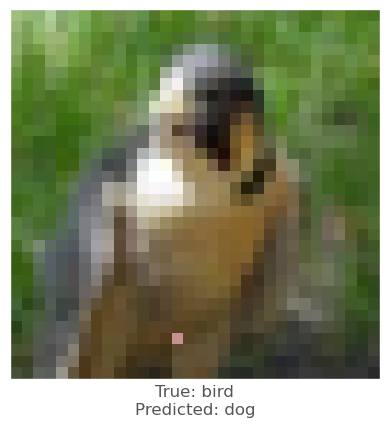

Success Lopt is 121.11398456968635
Confidence: 0.19189487


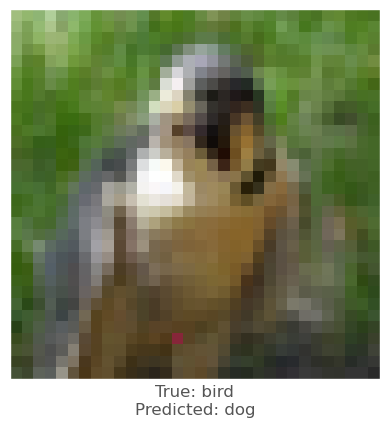

Success Lopt is 53.45268966747332
Confidence: 0.4168347


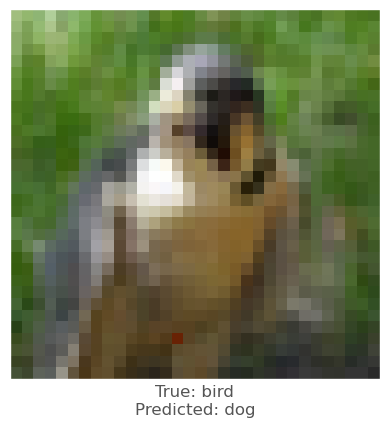

Success Lopt is 23.583938433257927
Confidence: 0.6167192
Confidence: 0.6167192
Confidence: 0.6167192
Confidence: 0.6167192
Confidence: 0.6167192
Confidence: 0.55161554
Confidence: 0.55161554
Confidence: 0.5496424
Confidence: 0.5496424
Confidence: 0.5394171
Confidence: 0.5282319
Confidence: 0.5282319
Confidence: 0.5227234
Confidence: 0.5227234
Confidence: 0.48435643


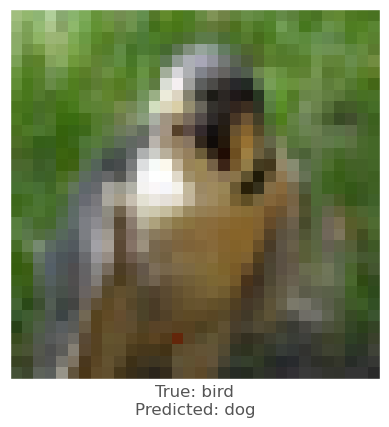

Success Lopt is 19.596222002918566
Confidence: 0.55981946
Confidence: 0.5434863
Confidence: 0.53581095
Confidence: 0.53581095
Confidence: 0.53581095
Final Lopt is 19.596222002918566


Round  29
Confidence: 0.04708223


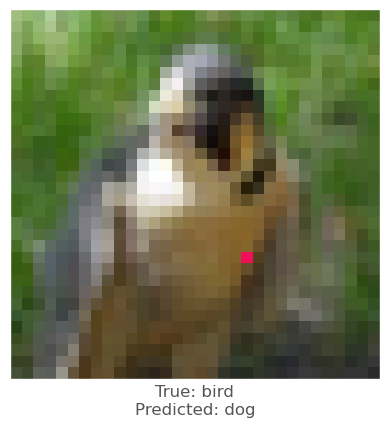

Success Lopt is 115.69729178340853
Confidence: 0.35251084


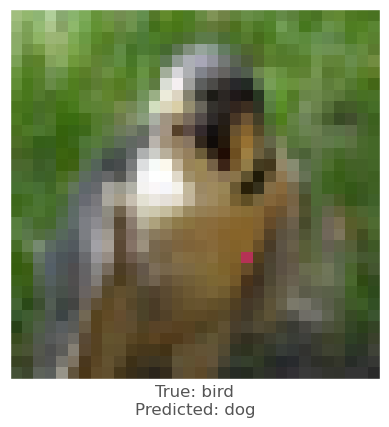

Success Lopt is 54.481205819782645
Confidence: 0.59457535
Confidence: 0.5944228
Confidence: 0.5912166
Confidence: 0.56201625
Confidence: 0.55215144
Confidence: 0.4797251


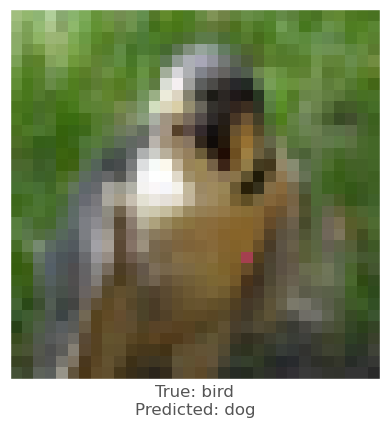

Success Lopt is 37.68262580672766
Confidence: 0.556931
Confidence: 0.556931
Confidence: 0.53834647
Confidence: 0.53043115
Confidence: 0.5208442
Confidence: 0.53230816
Confidence: 0.52546376
Confidence: 0.5111764
Confidence: 0.5111764
Confidence: 0.5069279
Confidence: 0.53121644
Confidence: 0.5213027
Confidence: 0.5118684
Confidence: 0.50117433
Confidence: 0.50117433
Confidence: 0.5037859
Confidence: 0.48276004


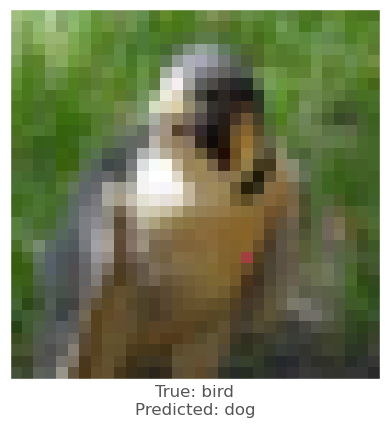

Success Lopt is 35.355700280444694
Final Lopt is 35.355700280444694
31.775528 sec
[123.55702241383908, 85.93899334060009, 71.66061922762361, 67.81619271106729, 126.06376329780723, 55.84396842359419, 38.05729913682143, 32.73197914727825, 125.82406087522747, 60.34152941576028, 55.585789406199524, 124.41342795887606, 87.86899522206352, 73.05503433743328, 68.16031367271023, 116.42352210277396, 57.13490416514131, 47.92311722818292, 44.25684212867634, 124.5028476831694, 86.33798023852239, 77.61954171193395, 74.56586729026884, 124.12997250387, 92.70749193715565, 76.51909882474598, 68.1742650418526, 66.92516000654086, 117.206647017317, 55.11670393993464, 40.80215656974809, 31.959690673737782, 28.167537544773268, 110.41925411626556, 43.300022174355746, 29.821053403621022, 23.165483046020697, 125.18142468213864, 57.64371598791868, 44.37561854743697, 123.43953562413682, 90.21241348703933, 79.53706426154463, 127.01821358984931, 57.39673169477146, 47.3763323186225, 124.37637126205341, 92.1022574748

In [98]:
image_id = 384
pixels = 1 # Number of pixels to attack
model = resnet


# _ = attack(image_id, model, pixel_count=pixels, verbose=True)
start = time.time()
_ = my_attack_3(image_id, model, pixel_count=pixels, maxiter = 5, popsize = 50, verbose = True)
end = time.time()
print(f"{end - start:.6f} sec")
print(Lopt_list)
print(attacked_pixel_coord)

#### Targeted Attack

In the targeted attack, we can choose which class we want a model to classify an image as. The task is much harder for the targeted attack, as we constrain the misclassification to a given class rather than any class that's not the correct one. We should see the confidence in the target class rise after several iterations.

Below we try to cause the `lenet` to classify an image of a `ship` as an `automobile`. Try to change the parameters and see what happens.

Attacking with target automobile
Confidence: 3.0633404e-05
Confidence: 0.00010486837
Confidence: 0.00014085951
Confidence: 0.00014085951
Confidence: 0.00014861667
Confidence: 0.00015590874
Confidence: 0.00015590874
Confidence: 0.0001633432
Confidence: 0.0001691464
Confidence: 0.0001691464
Confidence: 0.0001736398
Confidence: 0.00018478777
Confidence: 0.00018478777
Confidence: 0.00018926852
Confidence: 0.00019364354
Confidence: 0.00019561265
Confidence: 0.00019561265
Confidence: 0.00019561265
Confidence: 0.00019561265
Confidence: 0.00019561265
Confidence: 0.00019561265
Confidence: 0.00019561265
Confidence: 0.0002003284
Confidence: 0.0002003284
Confidence: 0.0002003284
Confidence: 0.0002003284
Confidence: 0.0002003284
Confidence: 0.0002003284
Confidence: 0.0002003284
Confidence: 0.0002003284
Confidence: 0.0002003284
Confidence: 0.00020290277
Confidence: 0.00020290277
Confidence: 0.00020290277
Confidence: 0.00020290277
Confidence: 0.00020290277
Confidence: 0.00020290277
Confidence: 0.0002

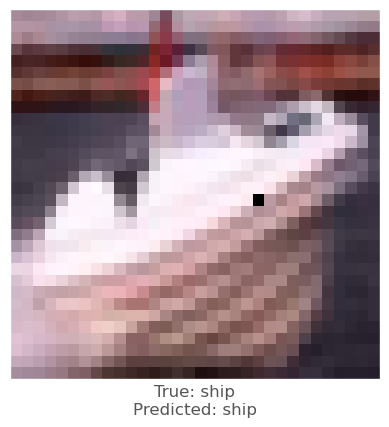

In [60]:
image_id = 108
target_class = 1 # Integer in range 0-9
pixels = 1
model = net_in_net
# net_in_net in 1 pixel : fail
# net_in_net in 3 pixel : success
# wide_resnet in 3 pixel : fail
# densenet in 3 pixel : fail
# pure_cnn in 3 pixel : fail

print('Attacking with target', class_names[target_class])
_ = attack(image_id, model, target_class, pixel_count=pixels, verbose=True)

### Collect Results

Armed with all the necessary tools to conduct a one pixel attack, the final step is to collect relevant statistics on the targeted and untargeted attack. The relevant data points are what percentage of images were we able to successfully attack for a given model, and how the number of pixels affect this percentage.

We will loop through every combination of all models, perturbations of 1,3,5 pixels, images, and target classes (for the targeted attack). This will take a lot of computational resources and time, so [skip to the statistics section](#Attack-Statistics) if that's not your idea of fun.

In [ ]:
def attack_all(models, samples=500, pixels=(1,3,5), targeted=False, 
               maxiter=75, popsize=400, verbose=False):
    results = []
    for model in models:
        model_results = []
        valid_imgs = correct_imgs[correct_imgs.name == model.name].img
        img_samples = np.random.choice(valid_imgs, samples, replace=False)
        
        for pixel_count in pixels:
            for i, img_id in enumerate(img_samples):
                print('\n', model.name, '- image', img_id, '-', i+1, '/', len(img_samples))
                targets = [None] if not targeted else range(10)
                
                for target in targets:
                    if targeted:
                        print('Attacking with target', class_names[target])
                        if target == y_test[img_id, 0]:
                            continue
                    result = attack(img_id, model, target, pixel_count, 
                                    maxiter=maxiter, popsize=popsize, 
                                    verbose=verbose)
                    model_results.append(result)
                    
        results += model_results
        helper.checkpoint(results, targeted)
    return results

In [ ]:
untargeted = attack_all(models, samples=100, targeted=False)

In [ ]:
targeted = attack_all(models, samples=10, targeted=True)

### Attack Statistics

Print the final results! 

In [ ]:
# Load the results
untargeted, targeted = helper.load_results()

In [ ]:
columns = ['model', 'pixels', 'image', 'true', 'predicted', 'success', 'cdiff', 'prior_probs', 'predicted_probs', 'perturbation']
untargeted_results = pd.DataFrame(untargeted, columns=columns)
targeted_results = pd.DataFrame(targeted, columns=columns)

#### Untargeted

In [43]:
helper.attack_stats(untargeted_results, models, network_stats)

,model,accuracy,pixels,attack_success_rate
0,lenet,0.7488,1,0.9
1,lenet,0.7488,3,1.0
2,lenet,0.7488,5,1.0
3,pure_cnn,0.8877,1,0.3
4,pure_cnn,0.8877,3,0.4
5,pure_cnn,0.8877,5,0.5
6,net_in_net,0.9074,1,0.1
7,net_in_net,0.9074,3,0.6
8,net_in_net,0.9074,5,0.7
9,resnet,0.9231,1,0.1


#### Targeted

In [35]:
helper.attack_stats(targeted_results, models, network_stats)

,model,accuracy,pixels,attack_success_rate
0,lenet,0.7488,1,0.222222
1,lenet,0.7488,3,0.644444
2,lenet,0.7488,5,0.633333
3,resnet,0.9231,1,0.155556
4,resnet,0.9231,3,0.311111
5,resnet,0.9231,5,0.344444


### Show some successful attacks

Plot 9 random successful attack images

Untargeted Attack


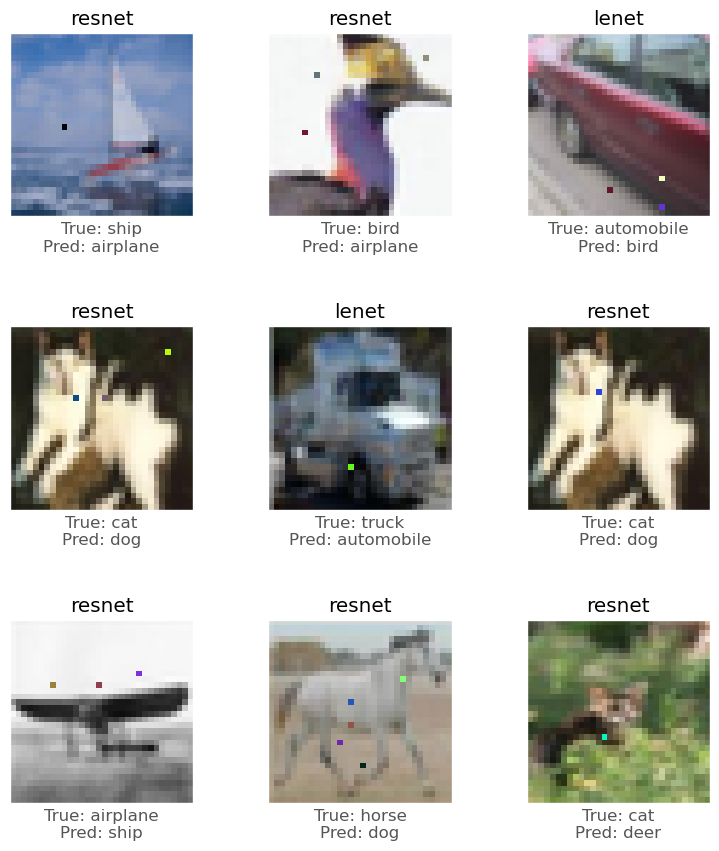

In [25]:
print('Untargeted Attack')
helper.visualize_attack(untargeted_results, class_names)

Targeted Attack


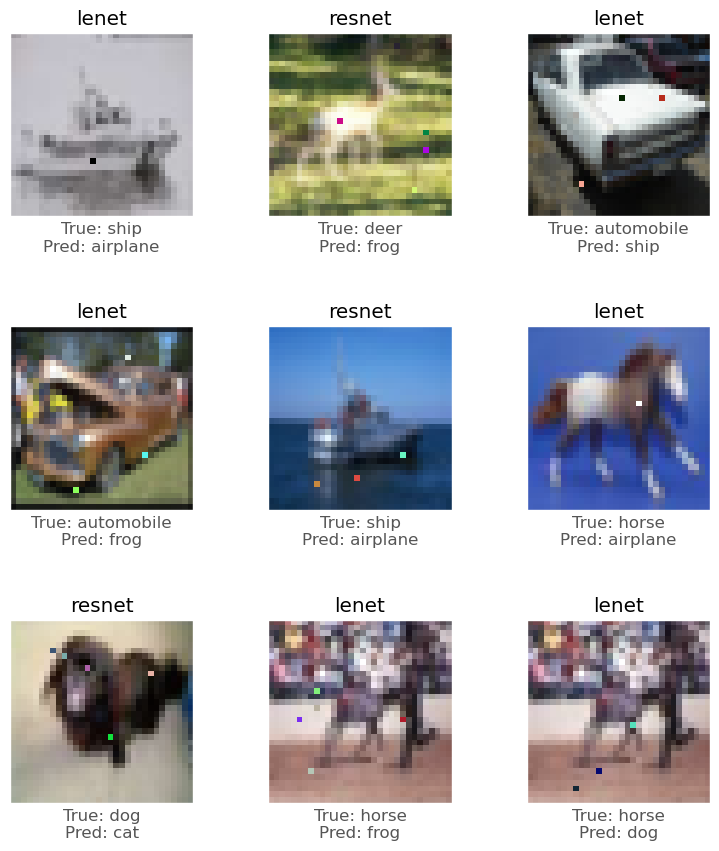

In [26]:
print('Targeted Attack')
helper.visualize_attack(targeted_results, class_names)

## Conclusions

It appears that the accuracy of a model is not strongly correlated with the chance of performing a successful attack on an image. Perhaps surprisingly, the purely convolutional model is the most resistant CNN to these types of attacks. In addition, the capsule network CapsNet has the lowest attack success rate out of all the models, although it is still vulnerable to attack.

[Part 2](1_one-pixel-attack-cifar10.ipynb)

## Credits
 -  This implemenation is based off of the original paper describing the one pixel attack: https://arxiv.org/abs/1710.08864
 - Base code for iPython notebook: https://github.com/09rohanchopra/cifar10
 - Keras Cifar10 models: https://github.com/BIGBALLON/cifar-10-cnn
 - Scipy's differential evolution implementation: https://docs.scipy.org/doc/scipy-0.17.0/reference/generated/scipy.optimize.differential_evolution.html
 - State of the art: https://github.com/RedditSota/state-of-the-art-result-for-machine-learning-problems
 - CapsNet Keras: https://github.com/XifengGuo/CapsNet-Keras
 - CapsNet with Cifar: https://github.com/theblackcat102/dynamic-routing-capsule-cifar